In [21]:
## Load libraries
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd, numpy as np, gc
import warnings
from sklearn.metrics import roc_auc_score
import lightgbm as lgbm
import statsmodels.api as sm

In [3]:
## Identifying and dividing test data into real and synthetic samples using variable value repetition counts
df_train=pd.read_csv('train.csv')
df_test=pd.read_csv('test.csv')

## Dropping the ids and retaining only the variable values
df_test.drop(['ID_code'], axis=1, inplace=True)
df_test = df_test.values

In [4]:
## Generating the real and synthetic data
unique_samples = []
unique_count = np.zeros_like(df_test)
for feature in range(df_test.shape[1]):
    _, index_, count_ = np.unique(df_test[:, feature], return_counts=True, return_index=True)
    unique_count[index_[count_ == 1], feature] += 1

# Samples which have unique values are real the others are fake
real_samples_indexes = np.argwhere(np.sum(unique_count, axis=1) > 0)[:, 0]
synthetic_samples_indexes = np.argwhere(np.sum(unique_count, axis=1) == 0)[:, 0]

print('Found',len(real_samples_indexes),'real test')
print('Found',len(synthetic_samples_indexes),'fake test')

Found 100000 real test
Found 100000 fake test


In [5]:
d = {}
for i in range(200): d['var_'+str(i)] = 'float32'
d['target'] = 'uint8'
d['ID_code'] = 'object'

train = pd.read_csv('train.csv', dtype=d)
test = pd.read_csv('test.csv', dtype=d)

print('Loaded',len(train),'rows of train')
print('Loaded',len(test),'rows of test')

Loaded 200000 rows of train
Loaded 200000 rows of test


In [6]:
# FREQUENCY ENCODE
def encode_FE(df,col,test):
    cv = df[col].value_counts()
    nm = col+'_FE'
    df[nm] = df[col].map(cv)
    test[nm] = test[col].map(cv)
    test[nm].fillna(0,inplace=True)
    if cv.max()<=255:
        df[nm] = df[nm].astype('uint8')
        test[nm] = test[nm].astype('uint8')
    else:
        df[nm] = df[nm].astype('uint16')
        test[nm] = test[nm].astype('uint16')        
    return

test['target'] = -1
comb = pd.concat([train,test.loc[real_samples_indexes]],axis=0,sort=True)
for i in range(200): encode_FE(comb,'var_'+str(i),test)
train = comb[:len(train)]; del comb
print('Added 200 new magic features!')
print(len(train.columns))

Added 200 new magic features!
402


In [8]:
train.head()

,ID_code,target,var_0,var_1,var_10,var_100,var_101,var_102,var_103,var_104,...,var_190_FE,var_191_FE,var_192_FE,var_193_FE,var_194_FE,var_195_FE,var_196_FE,var_197_FE,var_198_FE,var_199_FE
0,train_0,0,8.9255,-6.7863,2.9252,9.476300,13.310200,26.5376,1.4403,14.7100,...,3,8,9,4,9,5,5,14,5,2
1,train_1,0,11.5006,-4.1473,-0.4032,-13.695000,8.406800,35.4734,1.7093,15.1866,...,8,5,9,2,4,4,4,21,6,2
2,train_2,0,8.6093,-2.7457,-0.3249,-0.393900,12.631700,14.8863,1.3854,15.0284,...,4,5,6,2,2,2,3,12,4,2
3,train_3,0,11.0604,-2.1518,2.3061,-19.859200,22.531601,18.6129,1.3512,9.3291,...,2,3,6,4,4,8,5,4,2,2
4,train_4,0,9.8369,-1.4834,-9.4458,-22.926399,12.356200,17.3410,1.6940,7.1179,...,3,8,1,1,1,9,5,9,2,2


In [16]:
X=train.drop(['ID_code','target'],axis=1)
y=train['target']

In [17]:
X.head()

,var_0,var_1,var_10,var_100,var_101,var_102,var_103,var_104,var_105,var_106,...,var_190_FE,var_191_FE,var_192_FE,var_193_FE,var_194_FE,var_195_FE,var_196_FE,var_197_FE,var_198_FE,var_199_FE
0,8.9255,-6.7863,2.9252,9.476300,13.310200,26.5376,1.4403,14.7100,6.0454,9.5426,...,3,8,9,4,9,5,5,14,5,2
1,11.5006,-4.1473,-0.4032,-13.695000,8.406800,35.4734,1.7093,15.1866,2.6227,7.3412,...,8,5,9,2,4,4,4,21,6,2
2,8.6093,-2.7457,-0.3249,-0.393900,12.631700,14.8863,1.3854,15.0284,3.9995,5.3683,...,4,5,6,2,2,2,3,12,4,2
3,11.0604,-2.1518,2.3061,-19.859200,22.531601,18.6129,1.3512,9.3291,4.2835,10.3907,...,2,3,6,4,4,8,5,4,2,2
4,9.8369,-1.4834,-9.4458,-22.926399,12.356200,17.3410,1.6940,7.1179,5.1934,8.8230,...,3,8,1,1,1,9,5,9,2,2


In [27]:
len(X.columns)
X.shape

(200000, 400)

In [18]:
## Grid search to run lightgbm model
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold

def objective(trial, X, y):
    param_grid = {}  # to be filled in later
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgbm.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            early_stopping_rounds=100,
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = preds

    return np.mean(cv_scores)

In [22]:
from optuna.integration import LightGBMPruningCallback

def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgbm.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            early_stopping_rounds=100,
            callbacks=[
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)

In [23]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=20)

[I 2022-04-10 00:22:10,510] A new study created in memory with name: LGBM Classifier


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=13.448619779058472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.448619779058472
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set

[I 2022-04-10 01:50:23,344] Trial 0 finished with value: 0.21864400231227013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18262195919338875, 'num_leaves': 860, 'max_depth': 3, 'min_data_in_leaf': 3300, 'lambda_l1': 45, 'lambda_l2': 95, 'min_gain_to_split': 13.448619779058472, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 0 with value: 0.21864400231227013.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=8.276762941515816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.276762941515816
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Wa

[I 2022-04-10 10:19:32,990] Trial 1 finished with value: 0.21550199207154258 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2454498386240457, 'num_leaves': 2120, 'max_depth': 3, 'min_data_in_leaf': 3700, 'lambda_l1': 25, 'lambda_l2': 65, 'min_gain_to_split': 8.276762941515816, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 1 with value: 0.21550199207154258.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=7.585992616304486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.585992616304486
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current

[I 2022-04-10 10:21:09,547] Trial 2 finished with value: 0.21300816881784151 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22812738432525573, 'num_leaves': 240, 'max_depth': 12, 'min_data_in_leaf': 6700, 'lambda_l1': 25, 'lambda_l2': 95, 'min_gain_to_split': 7.585992616304486, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2 with value: 0.21300816881784151.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.016949691880775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.016949691880775
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1

[I 2022-04-10 10:22:35,571] Trial 3 finished with value: 0.21072637620650064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19399383727957759, 'num_leaves': 2920, 'max_depth': 6, 'min_data_in_leaf': 1200, 'lambda_l1': 50, 'lambda_l2': 75, 'min_gain_to_split': 4.016949691880775, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 3 with value: 0.21072637620650064.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.443541181472508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.443541181472508
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30

[I 2022-04-10 10:23:18,845] Trial 4 finished with value: 0.21304257180681097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2799100860135844, 'num_leaves': 660, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5, 'lambda_l2': 55, 'min_gain_to_split': 13.443541181472508, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 3 with value: 0.21072637620650064.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.346491547516939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.346491547516939
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-04-10 10:23:28,496] Trial 5 pruned. Trial was pruned at iteration 779.
[I 2022-04-10 10:23:33,158] Trial 6 pruned. Trial was pruned at iteration 53.
[I 2022-04-10 10:23:37,121] Trial 7 pruned. Trial was pruned at iteration 0.
[I 2022-04-10 10:23:40,843] Trial 8 pruned. Trial was pruned at iteration 0.
[I 2022-04-10 10:23:44,784] Trial 9 pruned. Trial was pruned at iteration 0.
[I 2022-04-10 10:23:48,705] Trial 10 pruned. Trial was pruned at iteration 0.
[I 2022-04-10 10:23:52,592] Trial 11 pruned. Trial was pruned at iteration 0.
[I 2022-04-10 10:23:56,794] Trial 12 pruned. Trial was pruned at iteration 0.
[I 2022-04-10 10:24:00,876] Trial 13 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.38379505333368513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38379505333368513
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Cur

[I 2022-04-10 10:25:39,917] Trial 14 finished with value: 0.20937095345020315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22143972835502246, 'num_leaves': 2980, 'max_depth': 6, 'min_data_in_leaf': 2300, 'lambda_l1': 60, 'lambda_l2': 35, 'min_gain_to_split': 0.38379505333368513, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 14 with value: 0.20937095345020315.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.4442246304896107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4442246304896107
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set

[I 2022-04-10 10:27:27,816] Trial 15 finished with value: 0.2075472292773167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2885579361996278, 'num_leaves': 2920, 'max_depth': 6, 'min_data_in_leaf': 2000, 'lambda_l1': 60, 'lambda_l2': 35, 'min_gain_to_split': 0.4442246304896107, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 15 with value: 0.2075472292773167.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.14041558204717575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14041558204717575
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is s

[I 2022-04-10 10:29:19,773] Trial 16 finished with value: 0.20757538795835942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29851830851704386, 'num_leaves': 2540, 'max_depth': 5, 'min_data_in_leaf': 2400, 'lambda_l1': 65, 'lambda_l2': 30, 'min_gain_to_split': 0.14041558204717575, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 15 with value: 0.2075472292773167.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.8216399087996786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8216399087996786
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-04-10 10:29:43,268] Trial 17 pruned. Trial was pruned at iteration 928.
[I 2022-04-10 10:29:48,368] Trial 18 pruned. Trial was pruned at iteration 38.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.09025414860003877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09025414860003877
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is s

[I 2022-04-10 10:33:01,201] Trial 19 finished with value: 0.2103771124776334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25443740534805004, 'num_leaves': 2620, 'max_depth': 7, 'min_data_in_leaf': 5600, 'lambda_l1': 75, 'lambda_l2': 40, 'min_gain_to_split': 0.09025414860003877, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 15 with value: 0.2075472292773167.


In [25]:
## Checking the best parameters and best values
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value (rmse): 0.20755
	Best params:
		n_estimators: 10000
		learning_rate: 0.2885579361996278
		num_leaves: 2920
		max_depth: 6
		min_data_in_leaf: 2000
		lambda_l1: 60
		lambda_l2: 35
		min_gain_to_split: 0.4442246304896107
		bagging_fraction: 0.8
		bagging_freq: 1
		feature_fraction: 0.7


In [30]:
param = {
    'learning_rate': 0.2885579361996278,
    'num_leaves': 2920,
    'metric':'auc',
    'boost_from_average':'false',
    'feature_fraction': 0.7,
    'max_depth': 6,
    'objective': 'binary',
    'verbosity': -10,
    'n_estimators': 10000,
    'min_data_in_leaf': 2000,
    'lambda_l1': 60,
    'lambda_l2': 35,
    'min_gain_to_split': 0.4442246304896107,
    'bagging_fraction': 0.8,
    'bagging_freq': 1}

In [33]:
train2 = train.sample(frac=1,random_state=42)
train2.shape

(200000, 402)

In [34]:
evals_result = {}
num_vars = 200

# SAVE OUT-OF-FOLD PREDICTIONS
all_oof = np.zeros((len(train2),num_vars+1))
all_oof[:,0] = np.ones(len(train2))
all_oofB = np.zeros((len(train2),num_vars+1))
all_oofB[:,0] = np.ones(len(train2))

# SAVE TEST PREDICTIONS
all_preds = np.zeros((len(test),num_vars+1))
all_preds[:,0] = np.ones(len(test))
all_predsB = np.zeros((len(test),num_vars+1))
all_predsB[:,0] = np.ones(len(test))

VAR_0 with magic val_auc = 0.50108


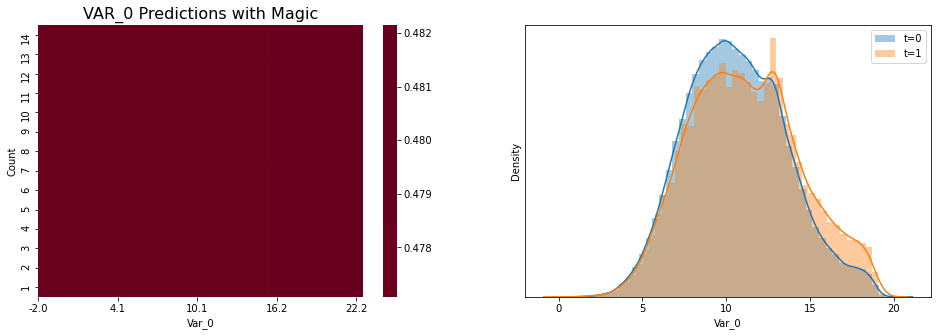

VAR_0 without magic val_auc = 0.50108


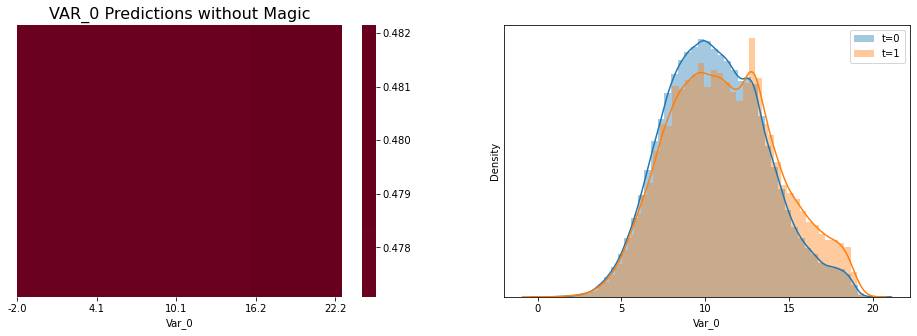

VAR_1 with magic val_auc = 0.50087


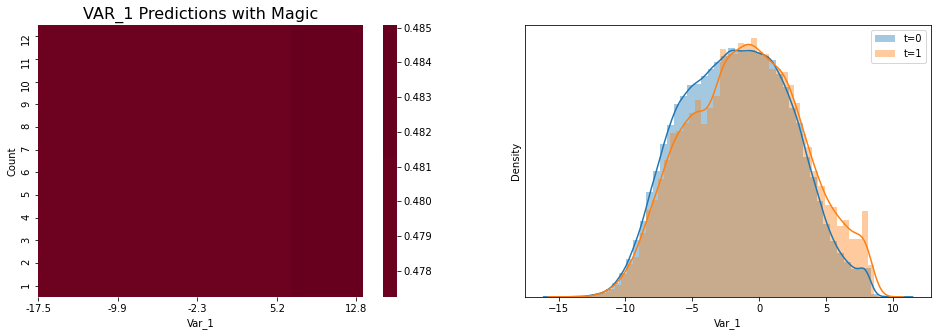

VAR_1 without magic val_auc = 0.50087


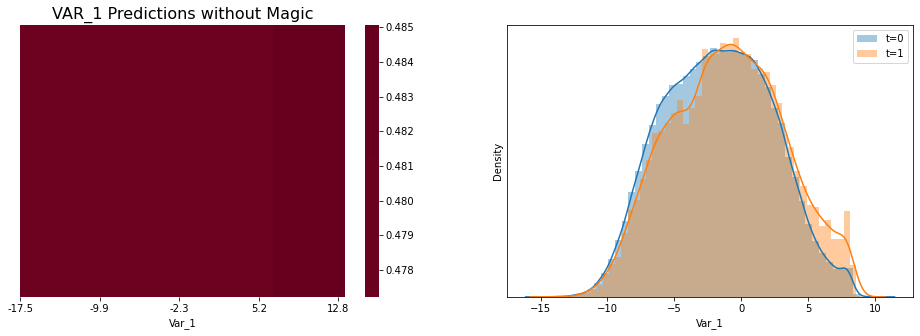

VAR_2 with magic val_auc = 0.5


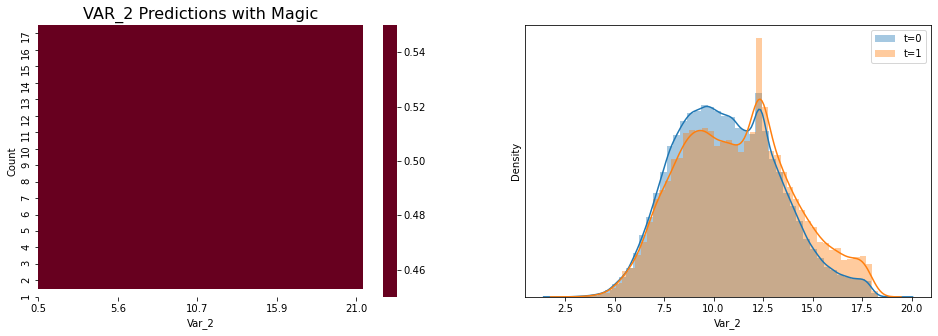

VAR_2 without magic val_auc = 0.5


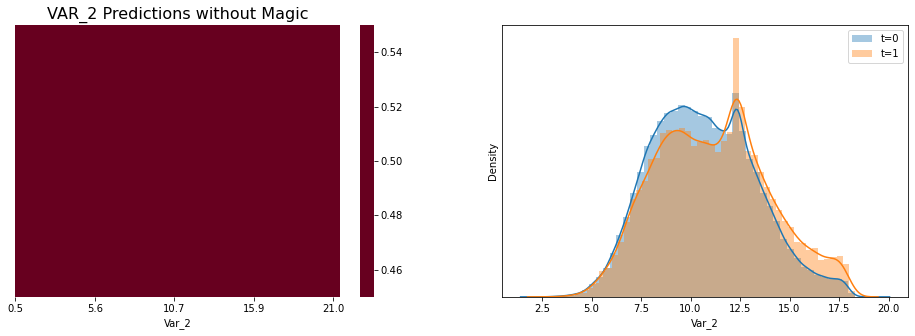

VAR_3 with magic val_auc = 0.5


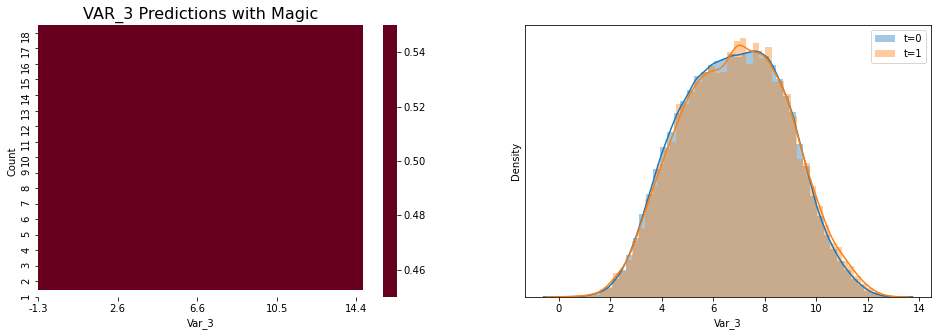

VAR_3 without magic val_auc = 0.5


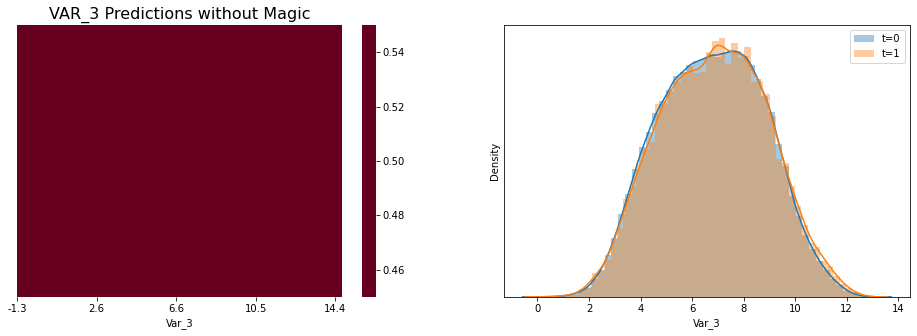

VAR_4 with magic val_auc = 0.5


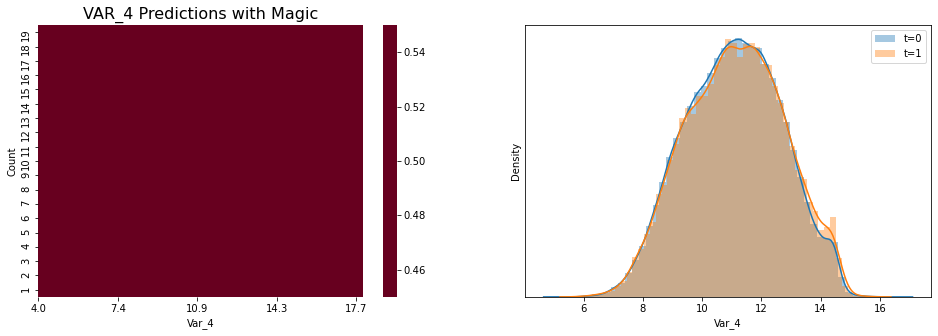

VAR_4 without magic val_auc = 0.5


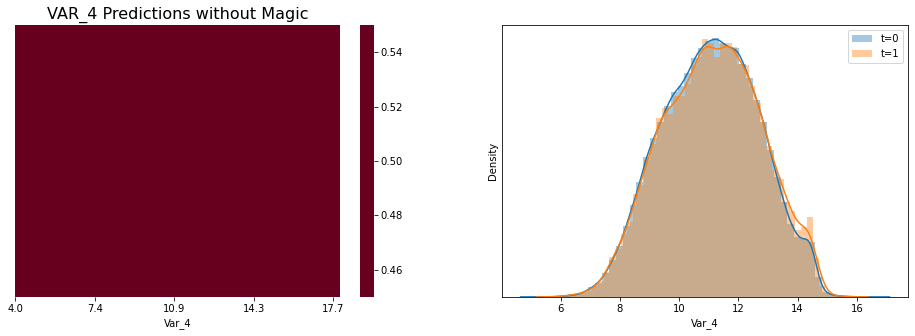

VAR_5 with magic val_auc = 0.5


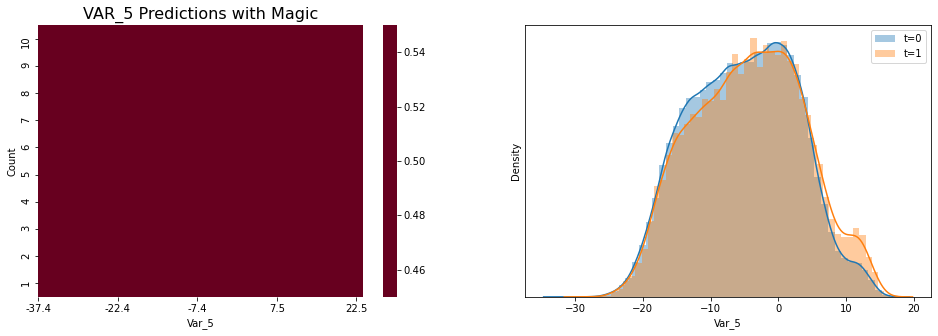

VAR_5 without magic val_auc = 0.5


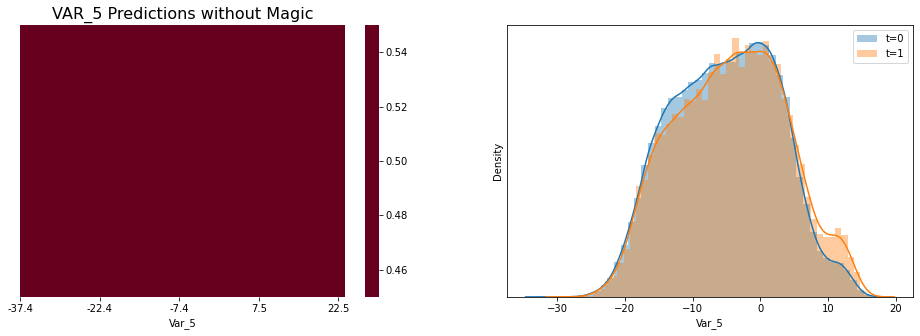

VAR_6 with magic val_auc = 0.51723


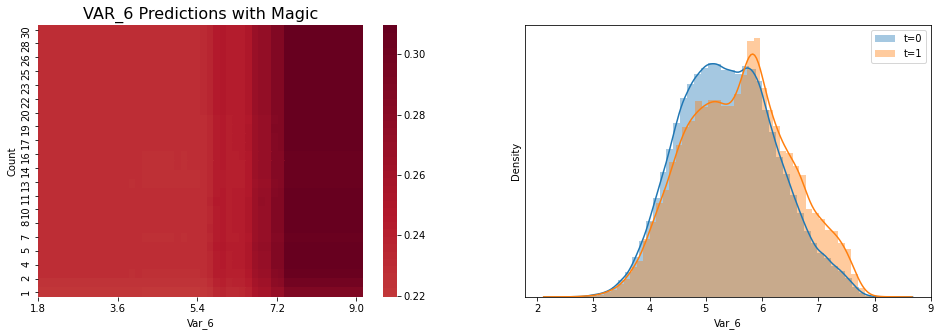

VAR_6 without magic val_auc = 0.51791


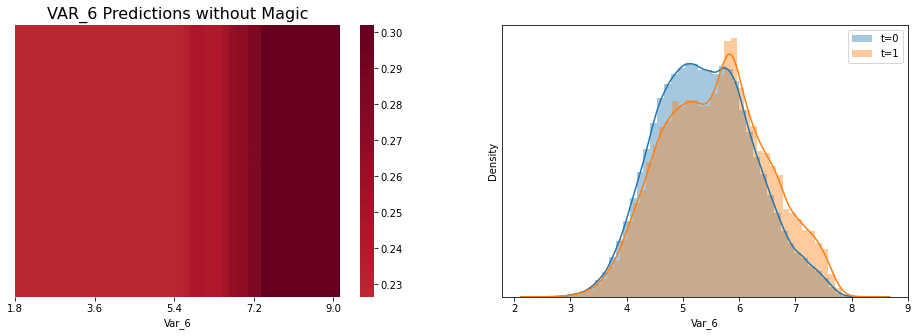

VAR_7 with magic val_auc = 0.5


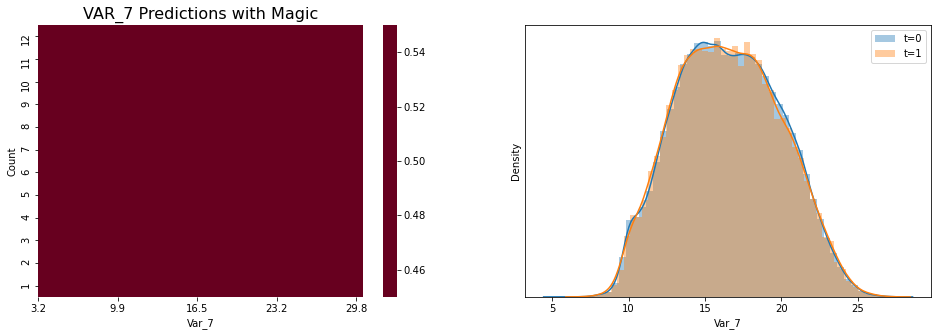

VAR_7 without magic val_auc = 0.5


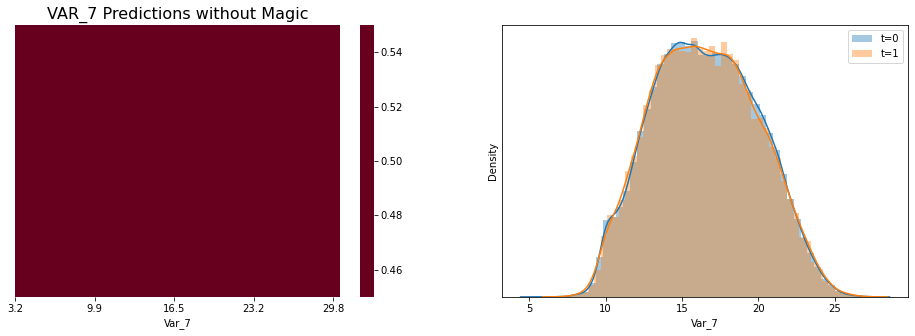

VAR_8 with magic val_auc = 0.5


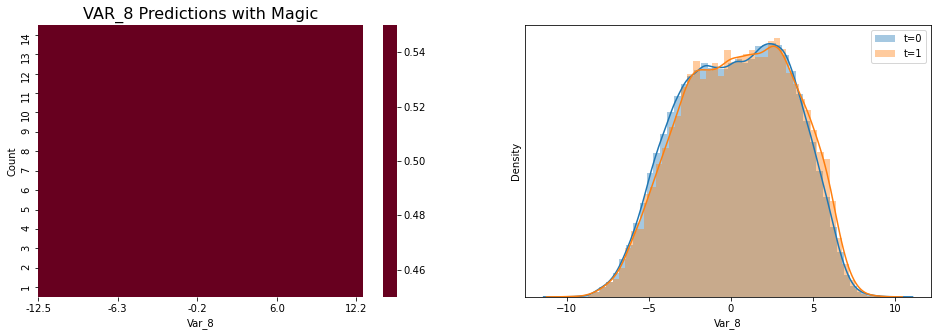

VAR_8 without magic val_auc = 0.5


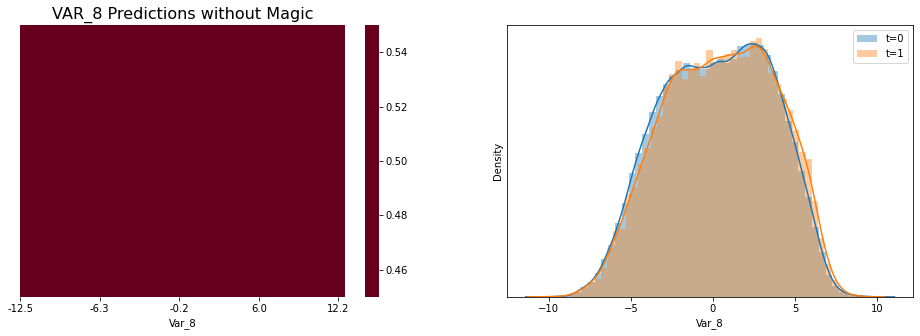

VAR_9 with magic val_auc = 0.5


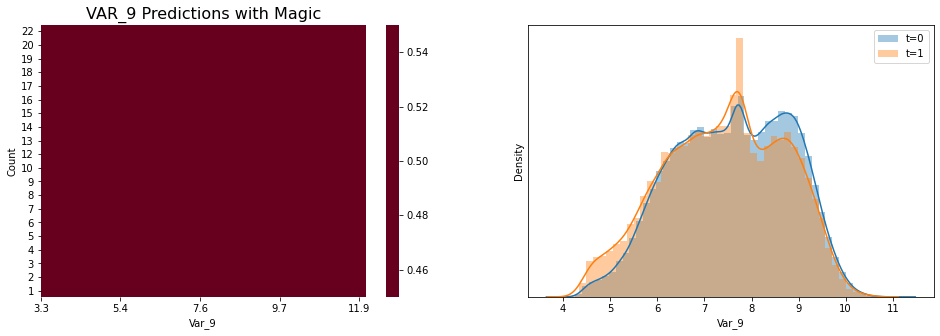

VAR_9 without magic val_auc = 0.5


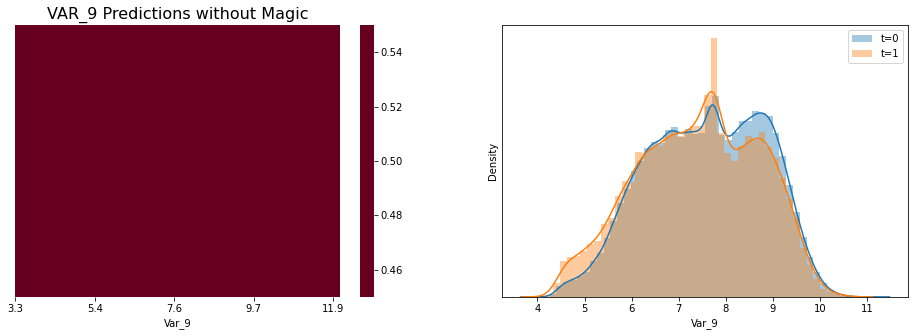

VAR_10 with magic val_auc = 0.5


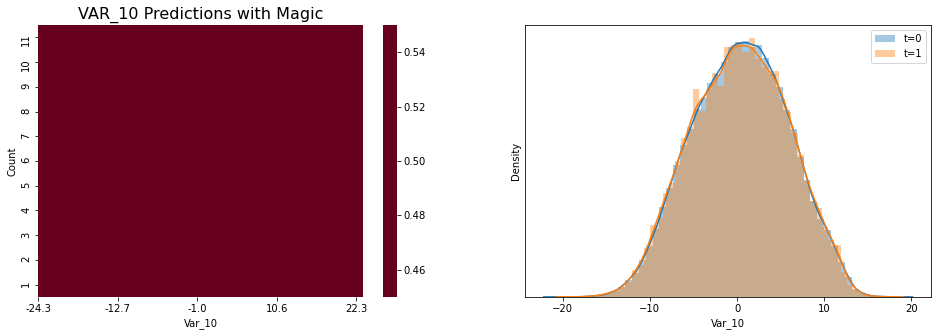

VAR_10 without magic val_auc = 0.5


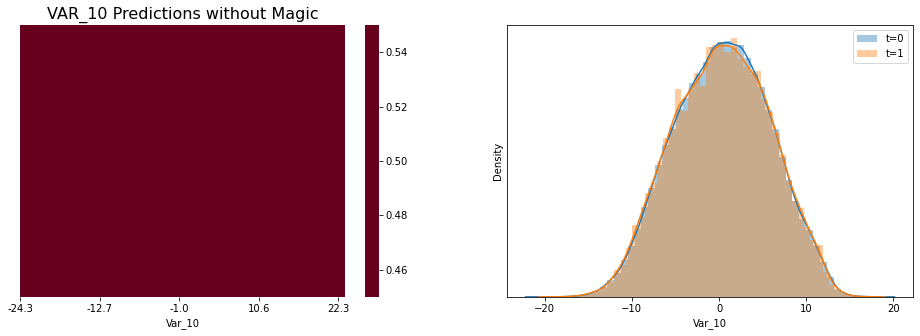

VAR_11 with magic val_auc = 0.5


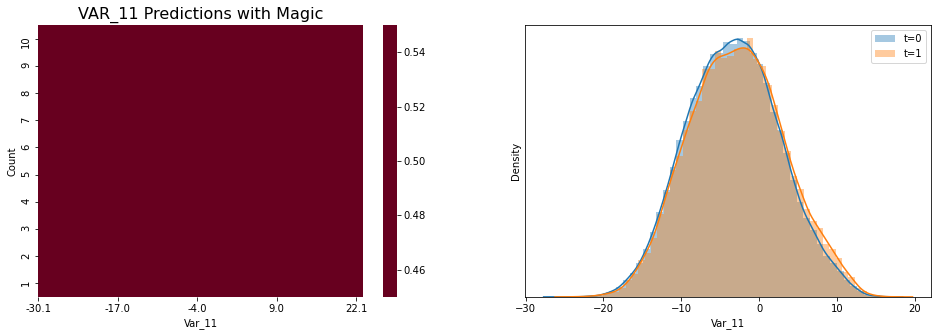

VAR_11 without magic val_auc = 0.5


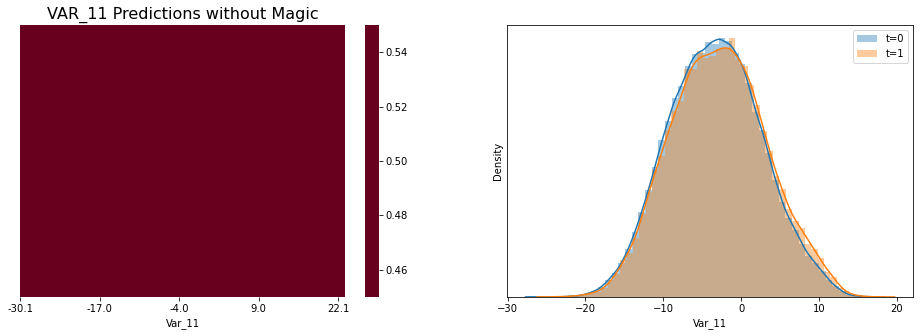

VAR_12 with magic val_auc = 0.55989


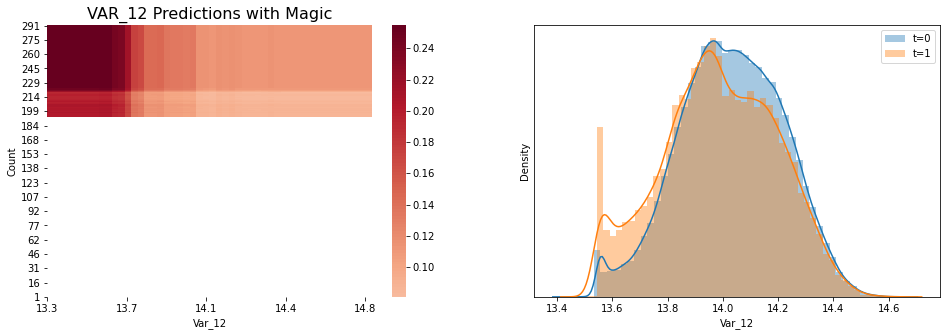

VAR_12 without magic val_auc = 0.54894


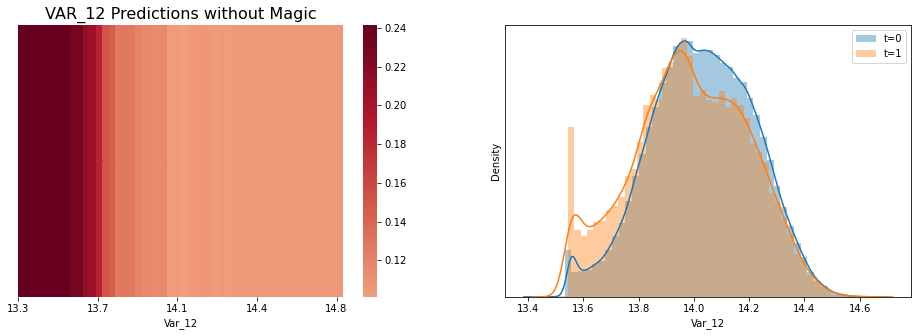

VAR_13 with magic val_auc = 0.50275


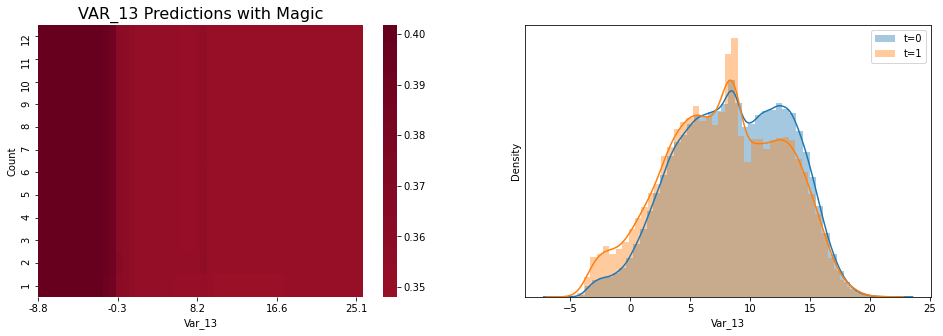

VAR_13 without magic val_auc = 0.50421


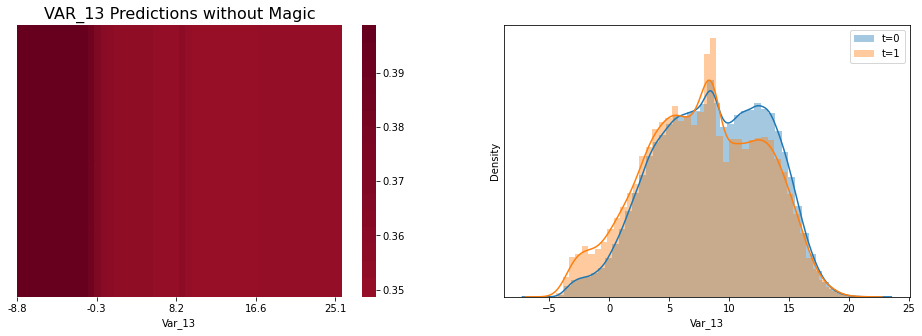

VAR_14 with magic val_auc = 0.5


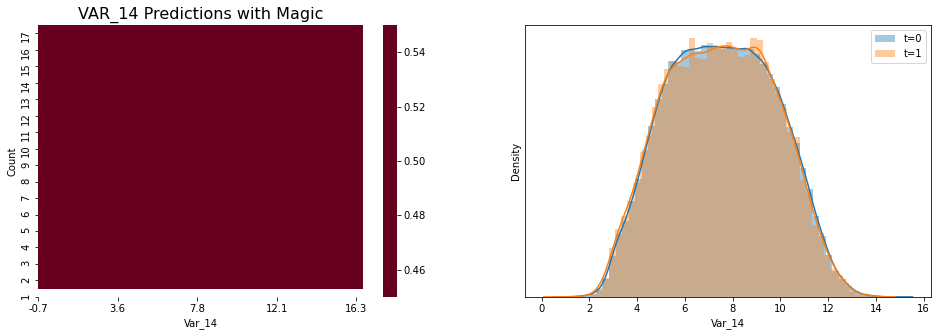

VAR_14 without magic val_auc = 0.5


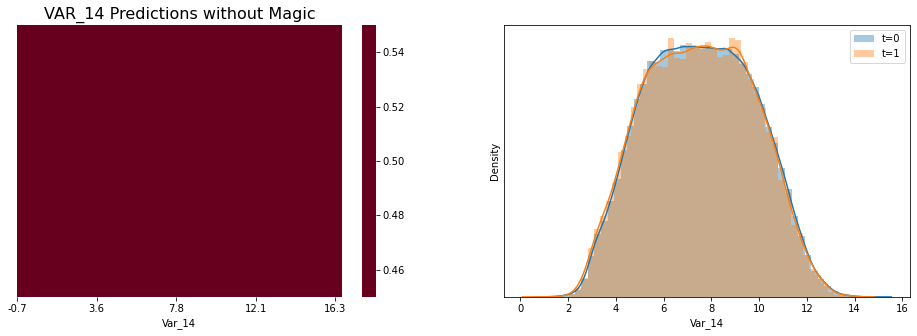

VAR_15 with magic val_auc = 0.5


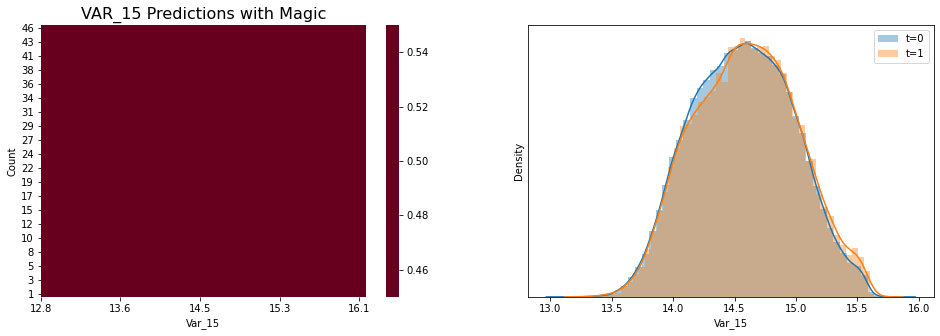

VAR_15 without magic val_auc = 0.5


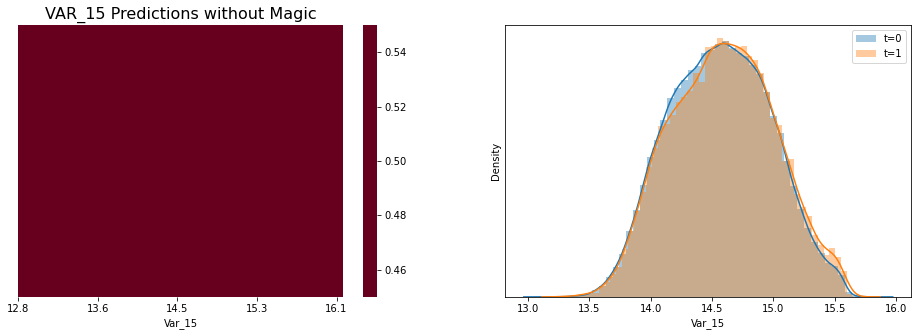

VAR_16 with magic val_auc = 0.5


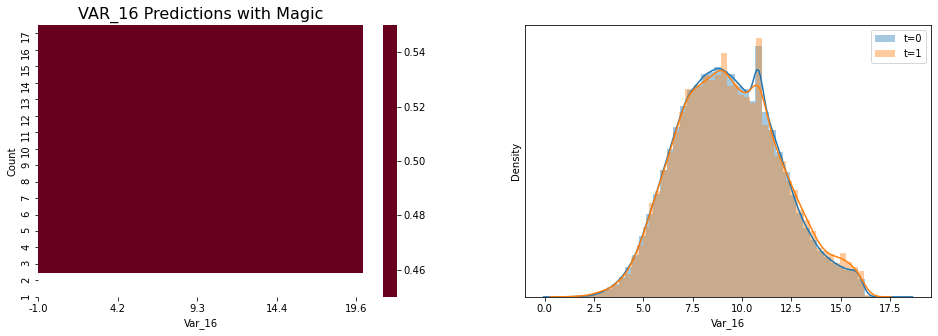

VAR_16 without magic val_auc = 0.5


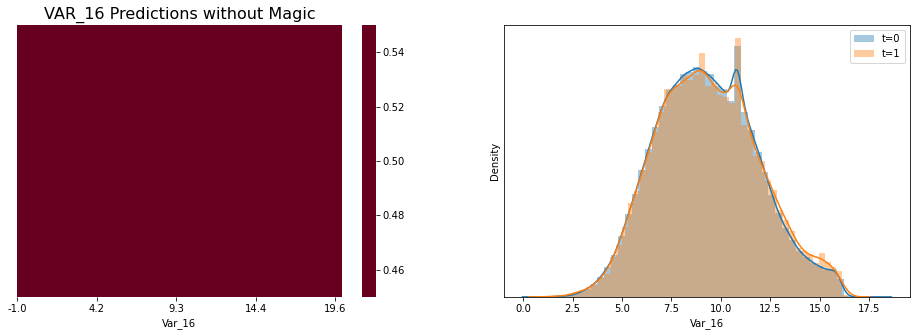

VAR_17 with magic val_auc = 0.5


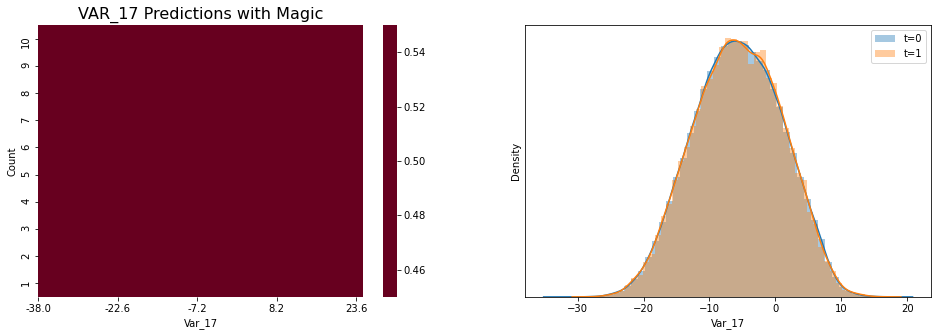

VAR_17 without magic val_auc = 0.5


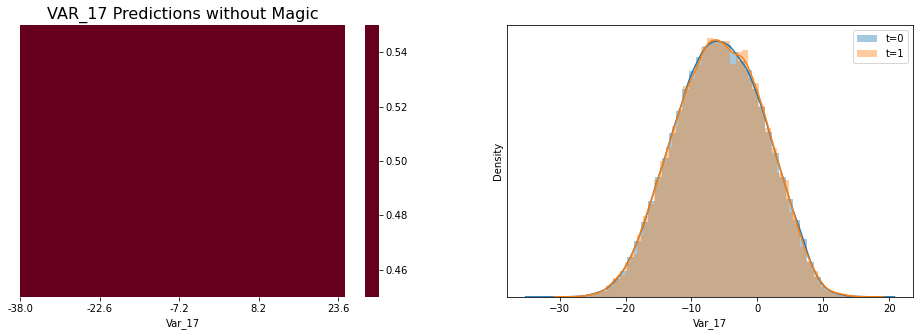

VAR_18 with magic val_auc = 0.5


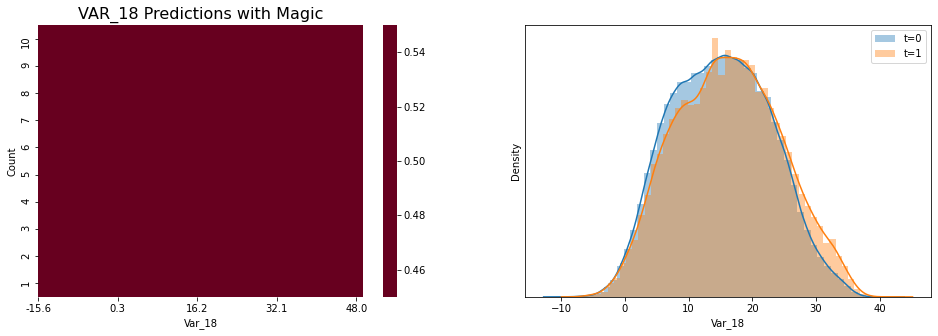

VAR_18 without magic val_auc = 0.5


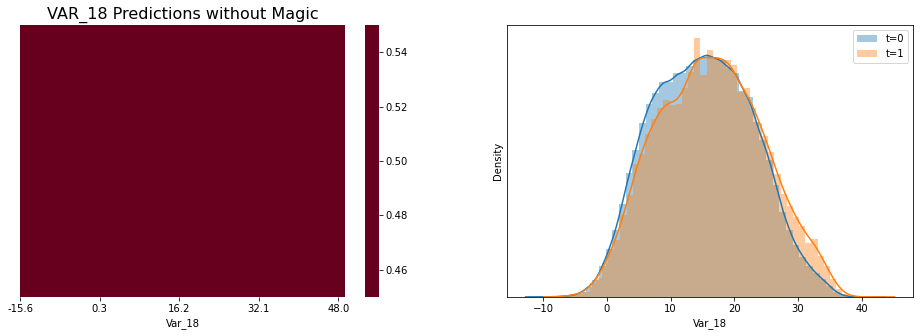

VAR_19 with magic val_auc = 0.5


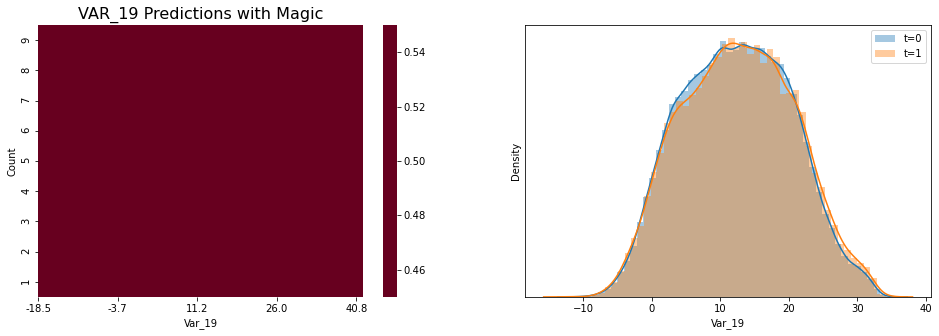

VAR_19 without magic val_auc = 0.5


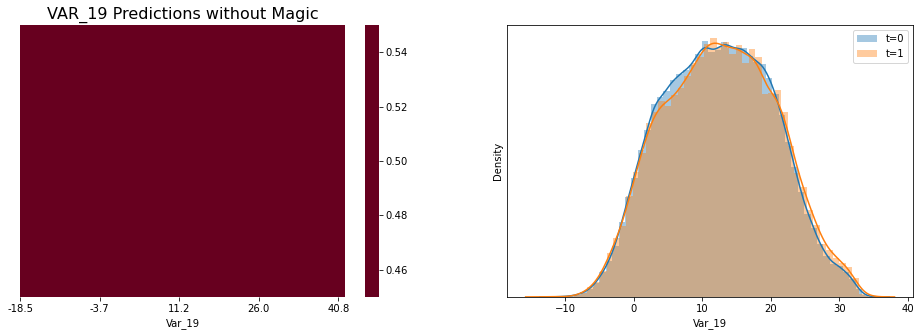

VAR_20 with magic val_auc = 0.5


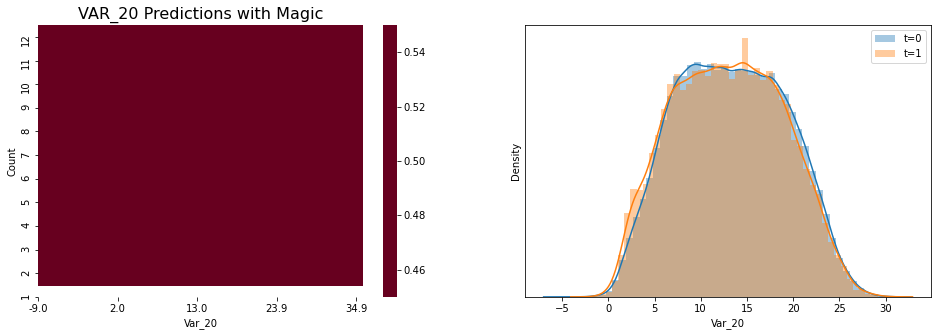

VAR_20 without magic val_auc = 0.5


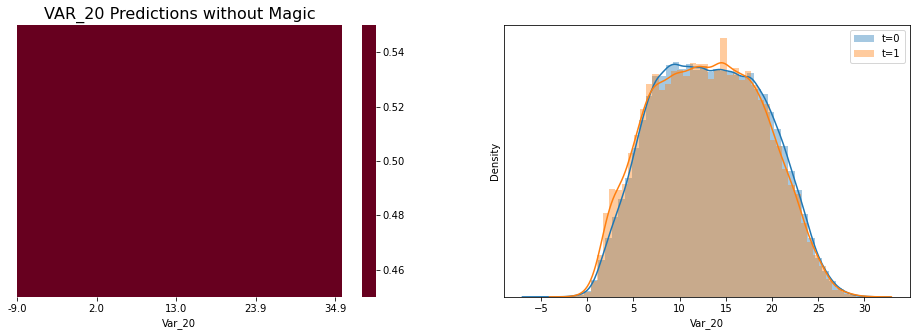

VAR_21 with magic val_auc = 0.50098


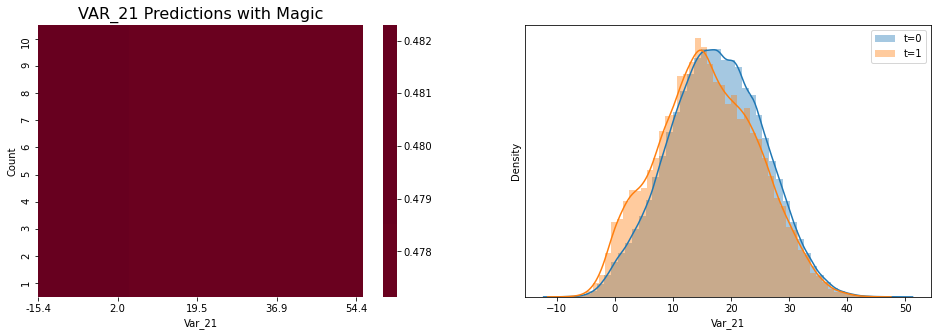

VAR_21 without magic val_auc = 0.50098


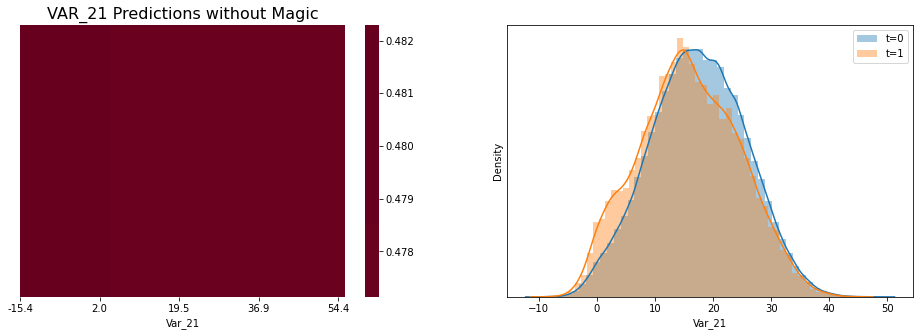

VAR_22 with magic val_auc = 0.5488


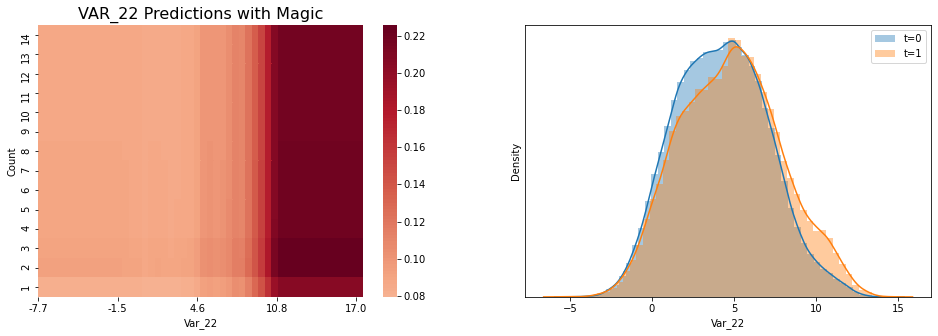

VAR_22 without magic val_auc = 0.55018


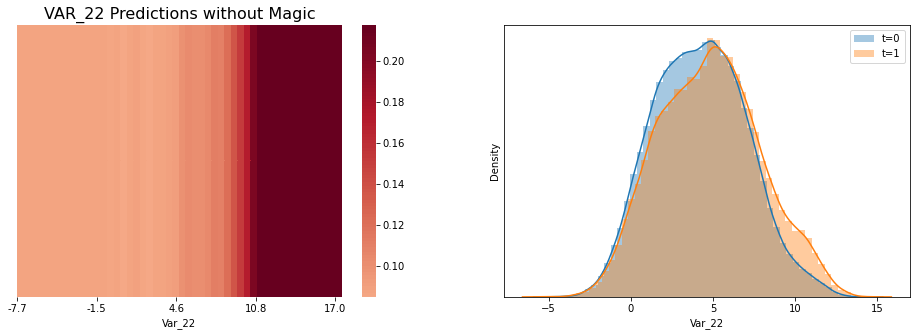

VAR_23 with magic val_auc = 0.5


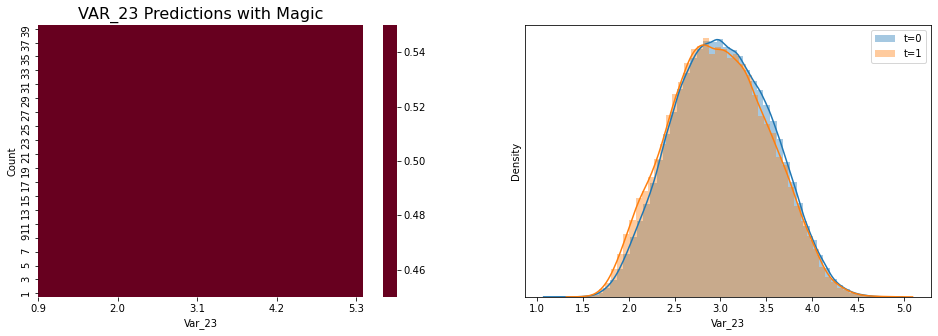

VAR_23 without magic val_auc = 0.5


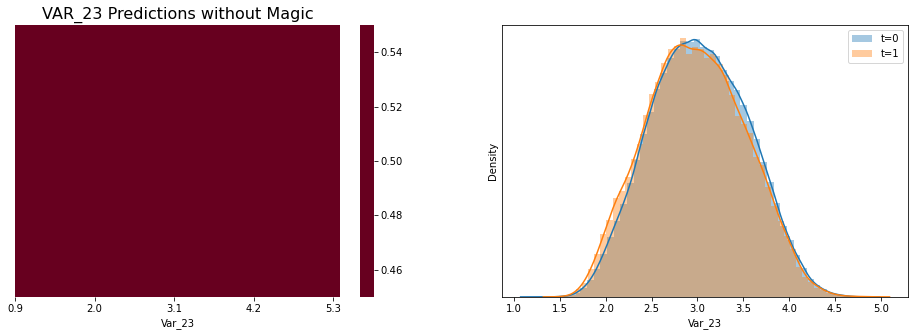

VAR_24 with magic val_auc = 0.5


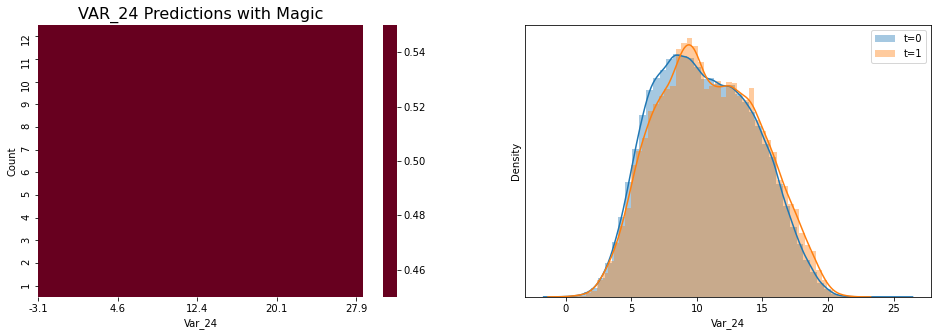

VAR_24 without magic val_auc = 0.5


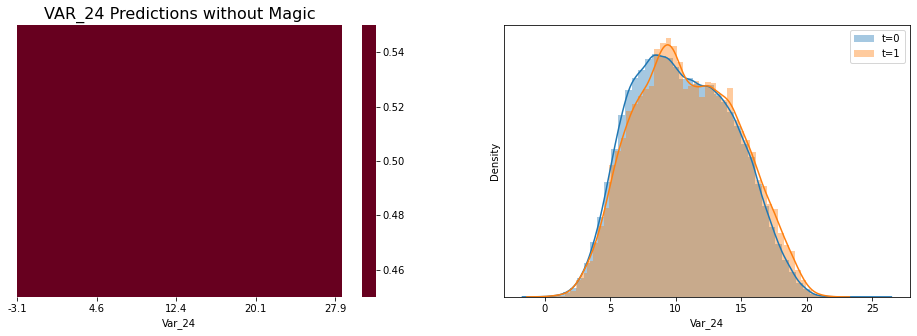

VAR_25 with magic val_auc = 0.5


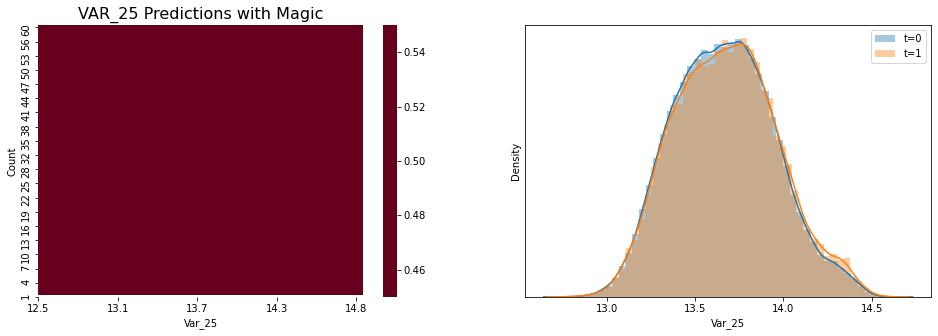

VAR_25 without magic val_auc = 0.5


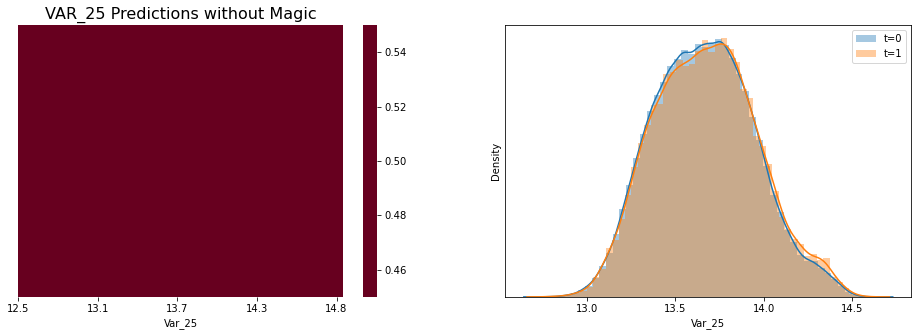

VAR_26 with magic val_auc = 0.55215


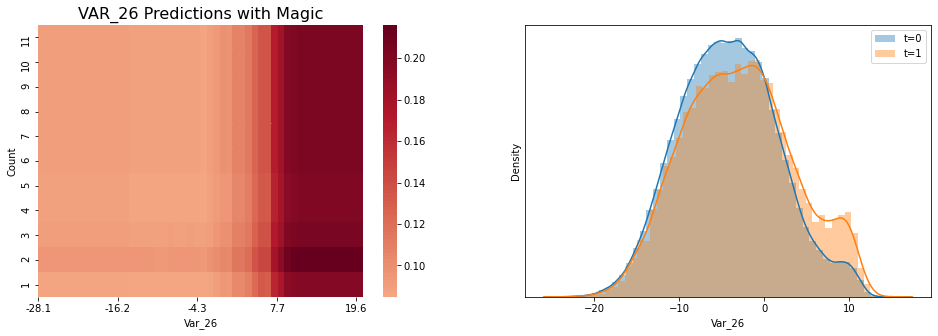

VAR_26 without magic val_auc = 0.54981


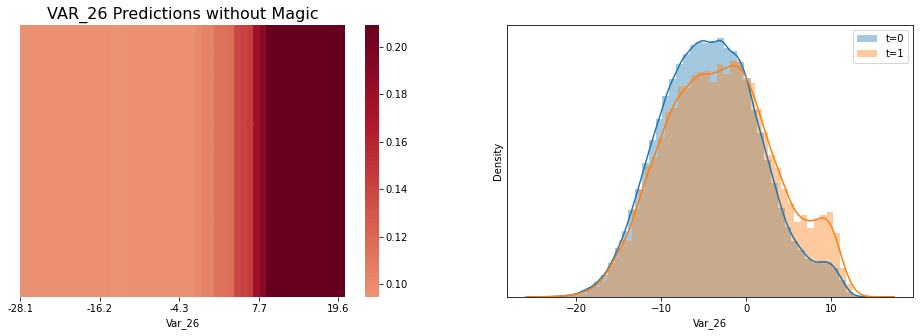

VAR_27 with magic val_auc = 0.5


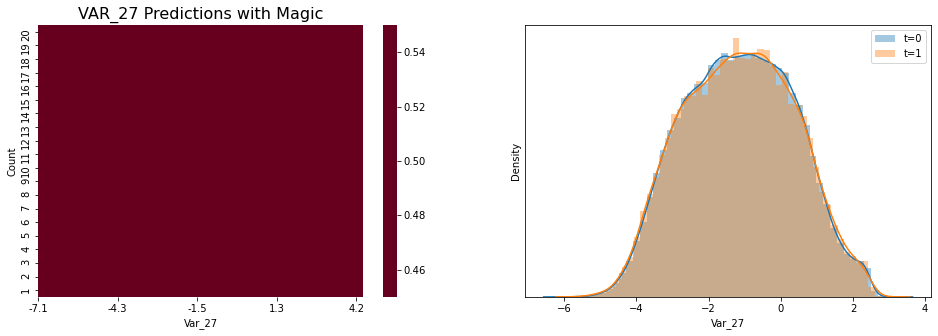

VAR_27 without magic val_auc = 0.5


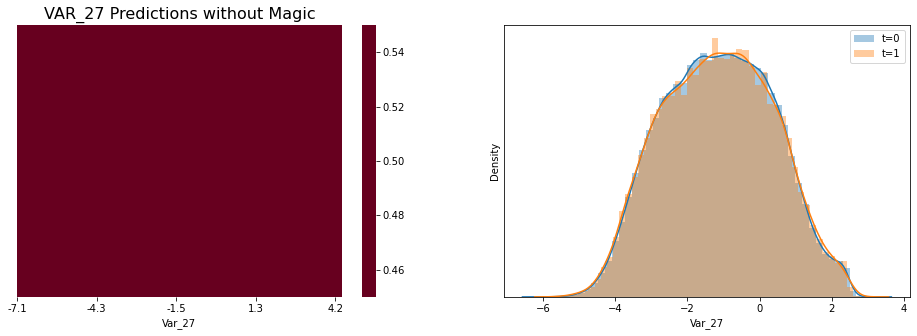

VAR_28 with magic val_auc = 0.5


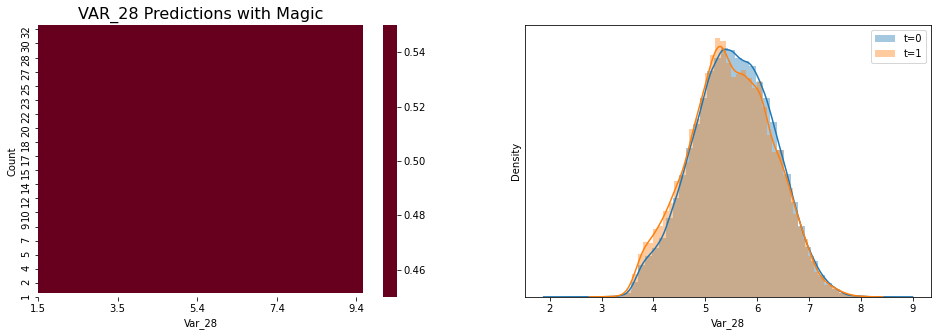

VAR_28 without magic val_auc = 0.5


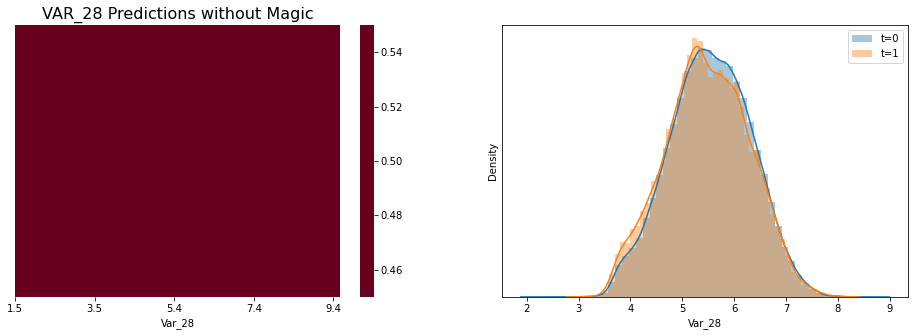

VAR_29 with magic val_auc = 0.5


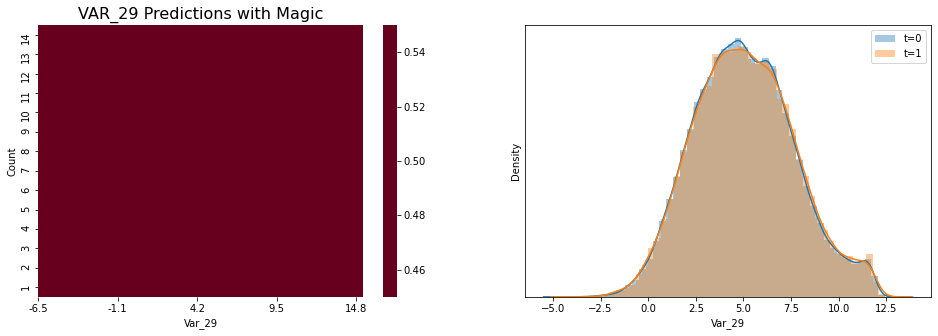

VAR_29 without magic val_auc = 0.5


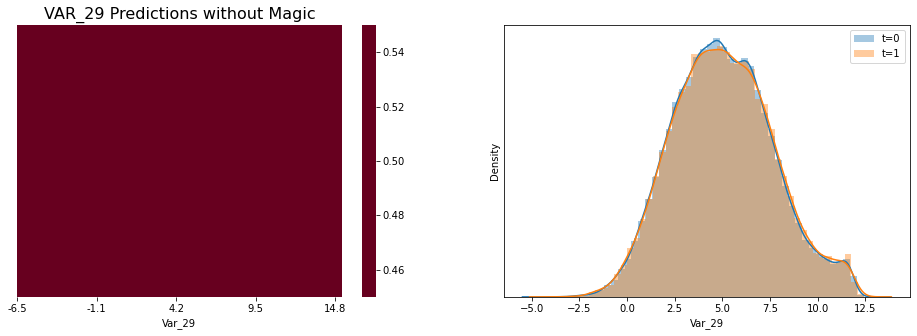

VAR_30 with magic val_auc = 0.5


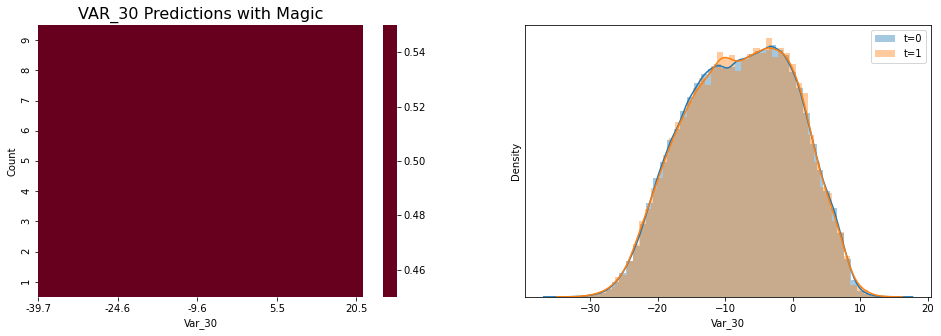

VAR_30 without magic val_auc = 0.5


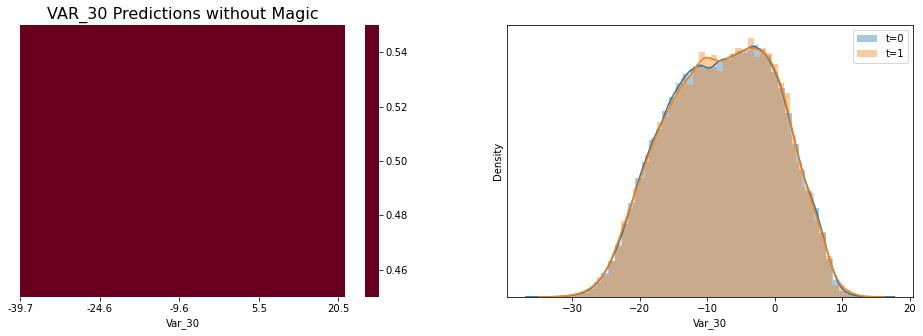

VAR_31 with magic val_auc = 0.5


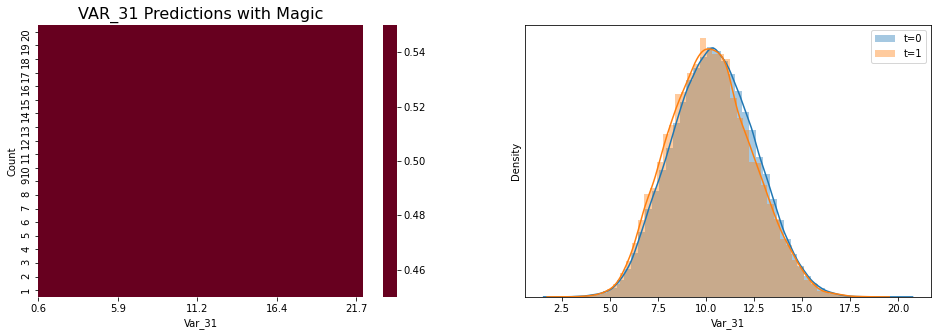

VAR_31 without magic val_auc = 0.5


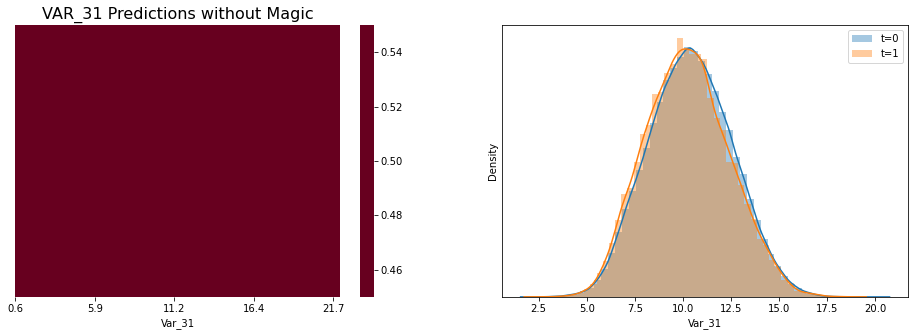

VAR_32 with magic val_auc = 0.5


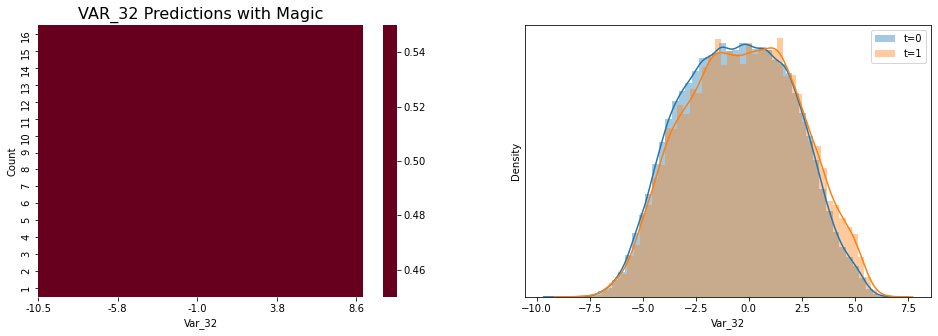

VAR_32 without magic val_auc = 0.5


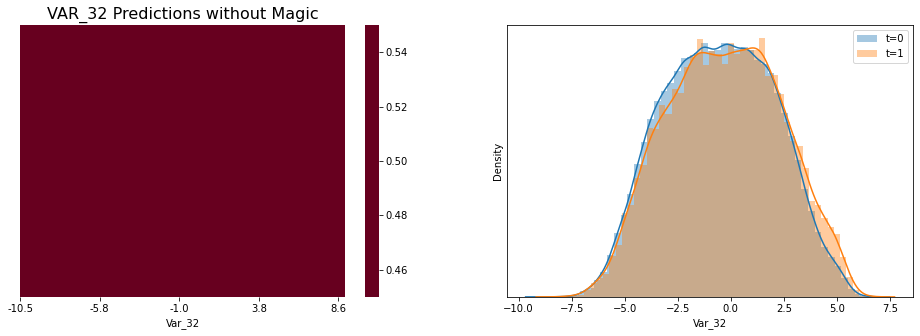

VAR_33 with magic val_auc = 0.5


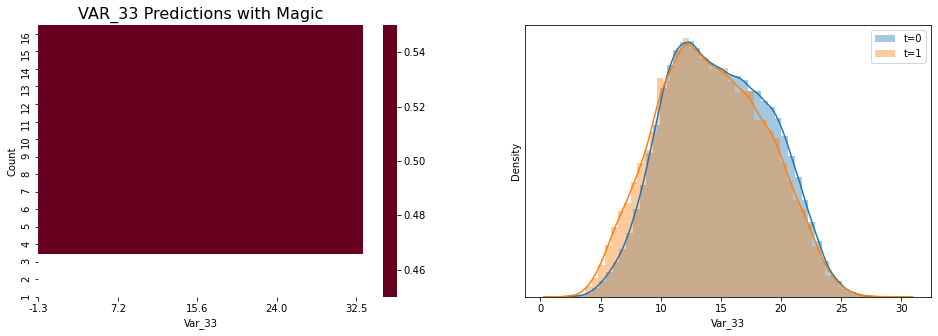

VAR_33 without magic val_auc = 0.5


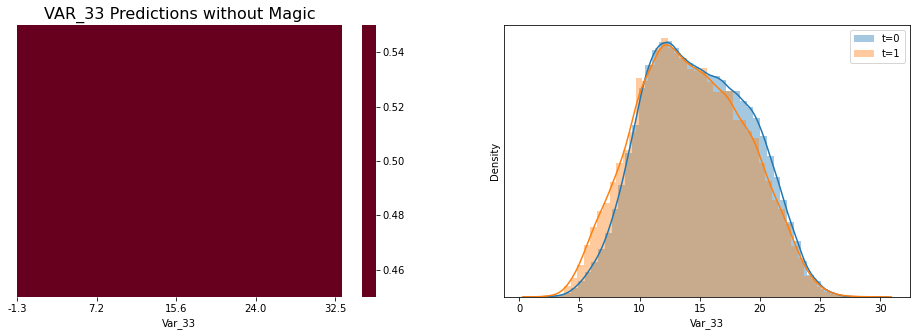

VAR_34 with magic val_auc = 0.5


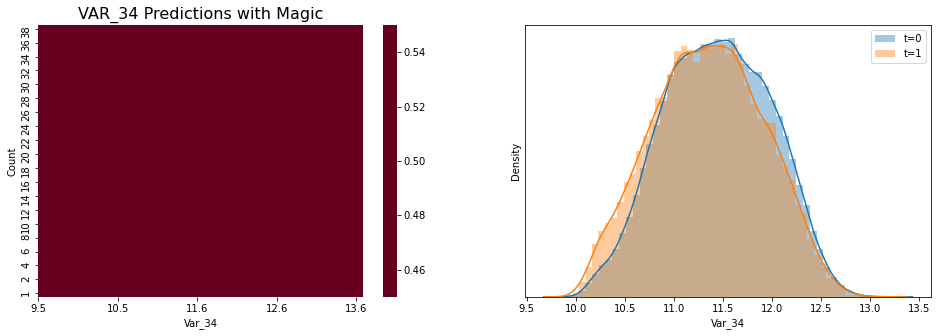

VAR_34 without magic val_auc = 0.5


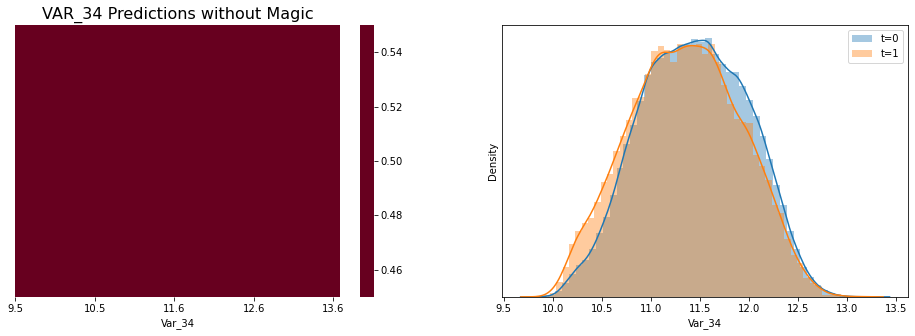

VAR_35 with magic val_auc = 0.5


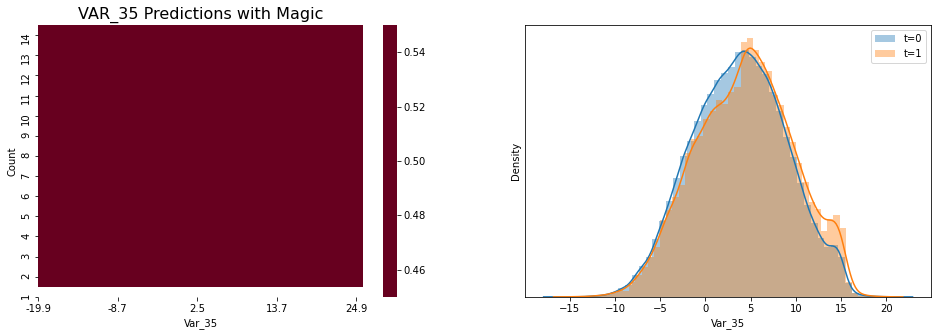

VAR_35 without magic val_auc = 0.5


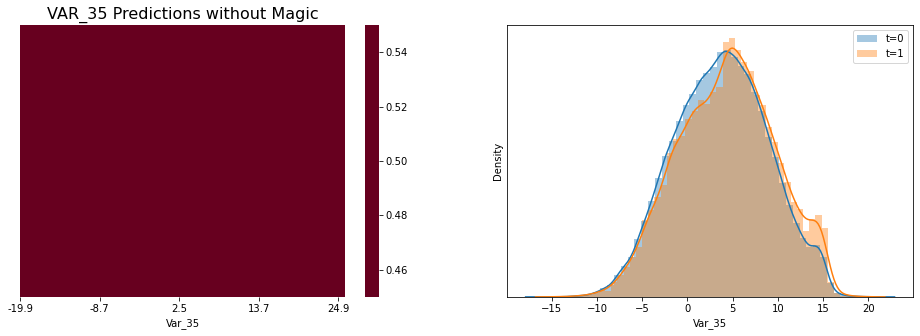

VAR_36 with magic val_auc = 0.5


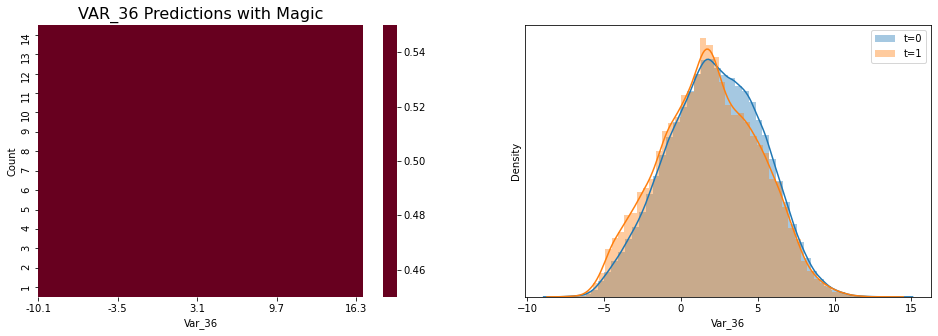

VAR_36 without magic val_auc = 0.5


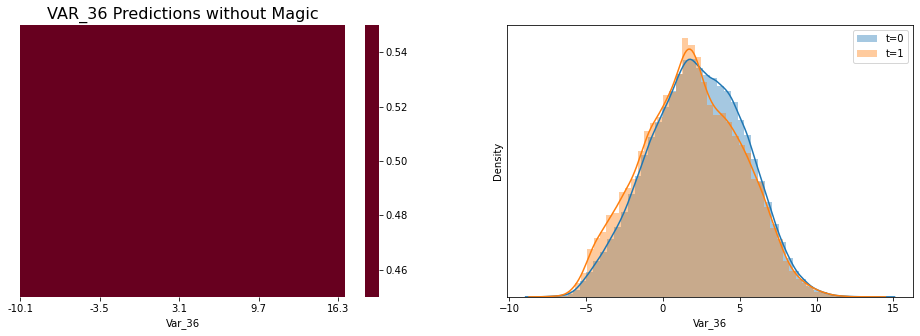

VAR_37 with magic val_auc = 0.5


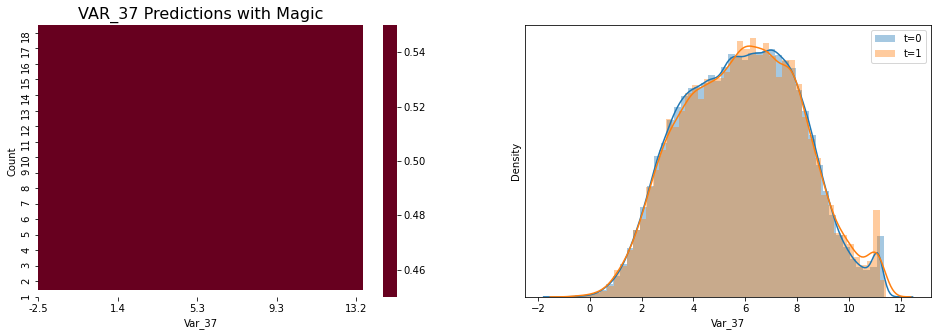

VAR_37 without magic val_auc = 0.5


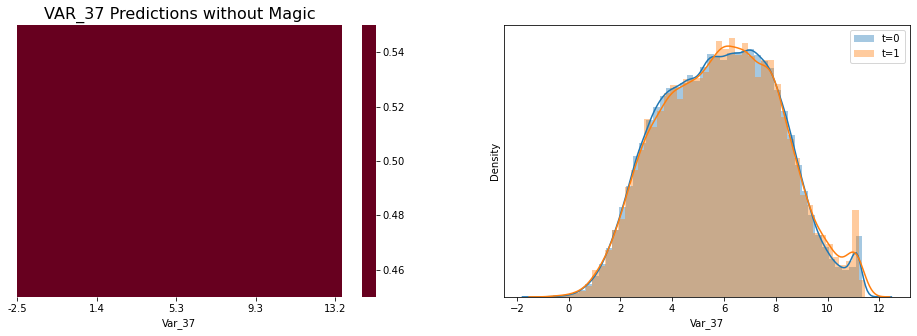

VAR_38 with magic val_auc = 0.5


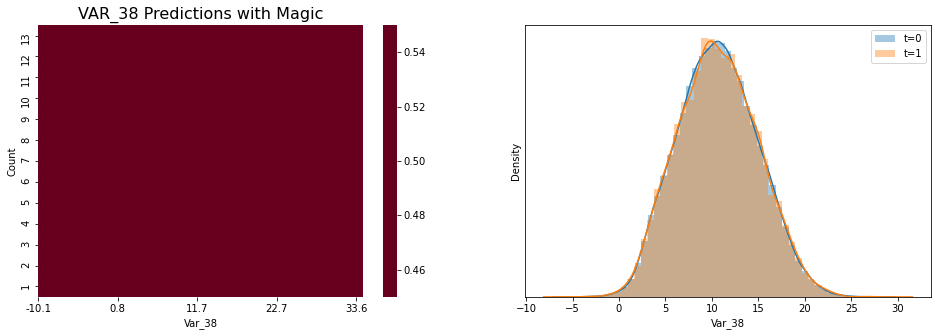

VAR_38 without magic val_auc = 0.5


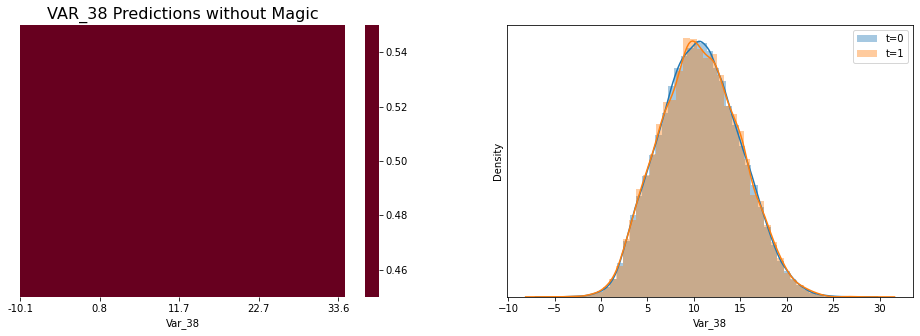

VAR_39 with magic val_auc = 0.5


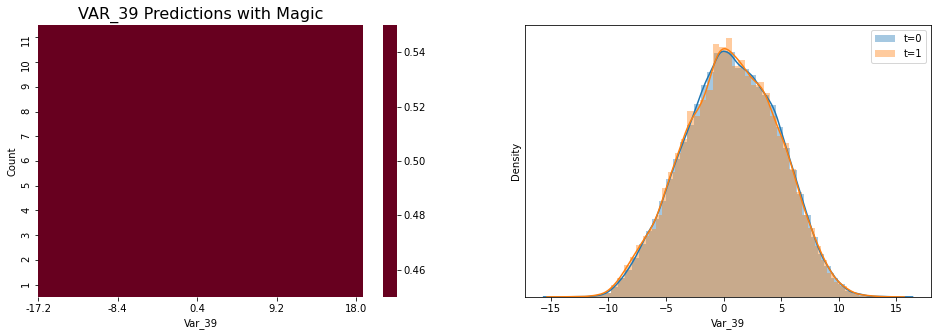

VAR_39 without magic val_auc = 0.5


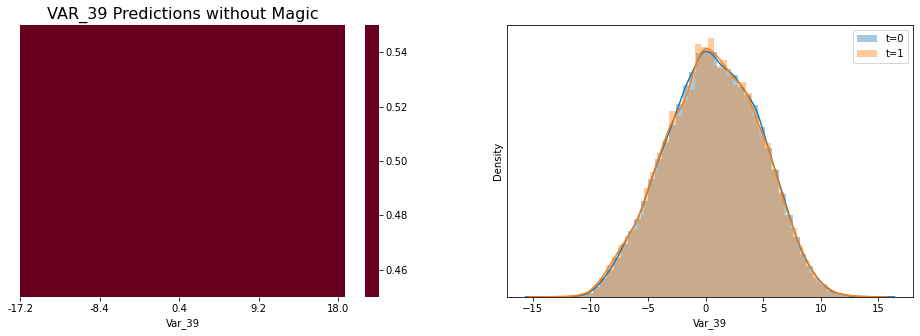

VAR_40 with magic val_auc = 0.5


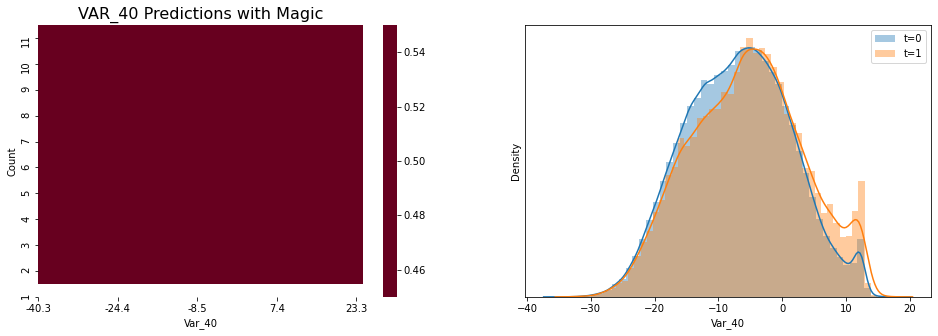

VAR_40 without magic val_auc = 0.5


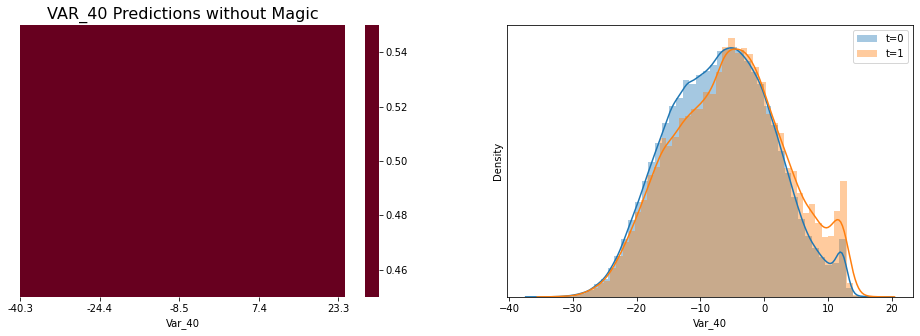

VAR_41 with magic val_auc = 0.5


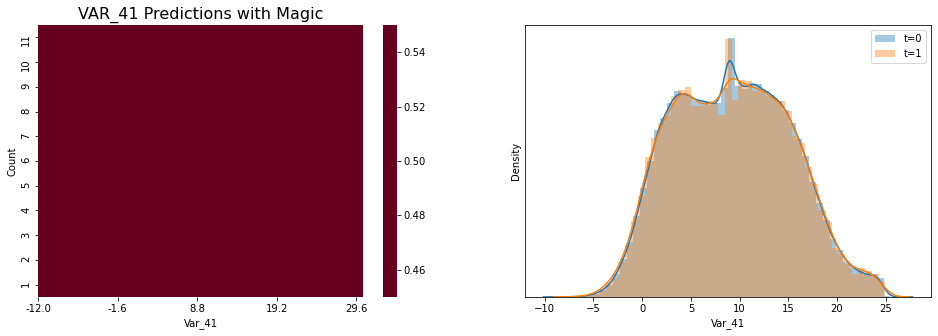

VAR_41 without magic val_auc = 0.5


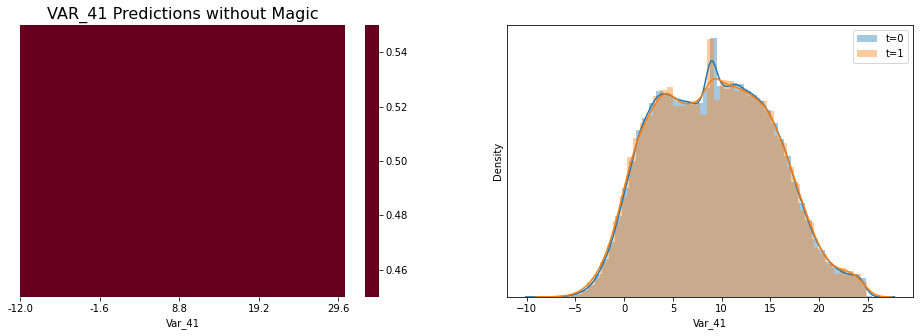

VAR_42 with magic val_auc = 0.5


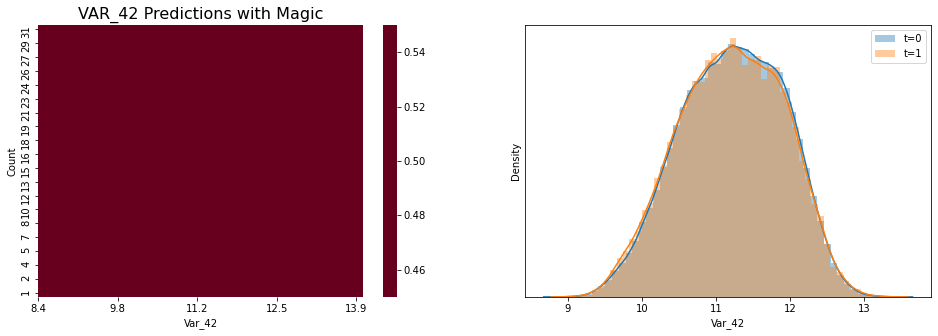

VAR_42 without magic val_auc = 0.5


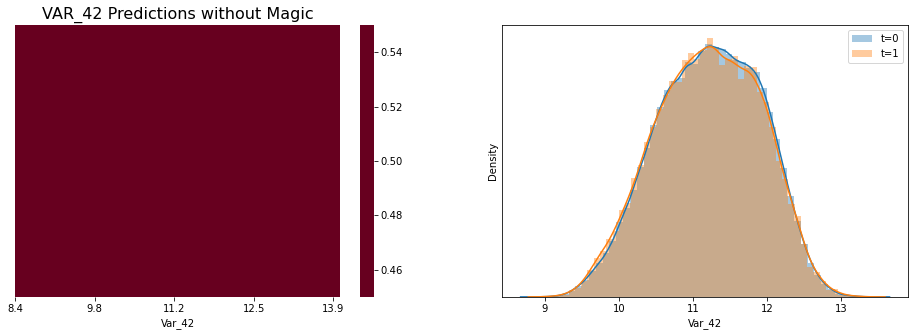

VAR_43 with magic val_auc = 0.5


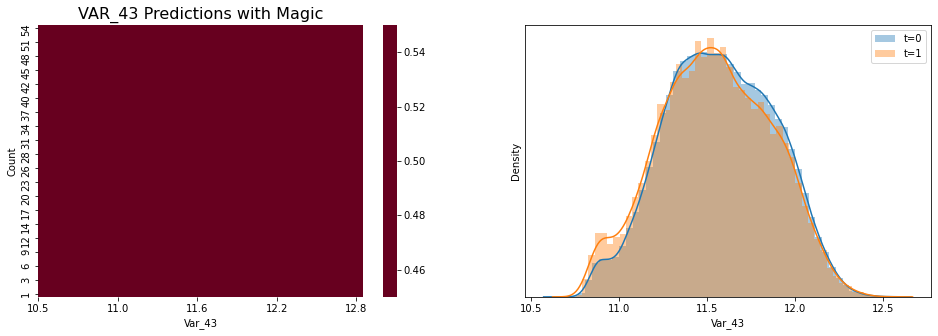

VAR_43 without magic val_auc = 0.5


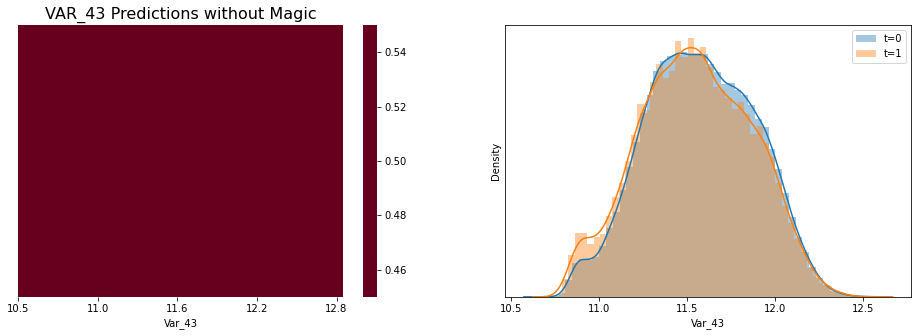

VAR_44 with magic val_auc = 0.5


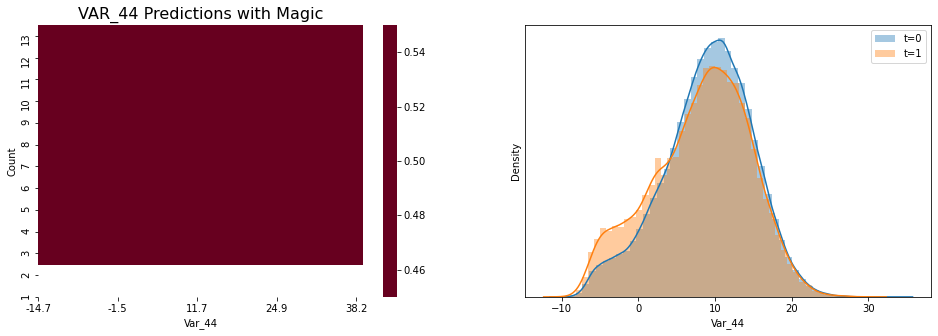

VAR_44 without magic val_auc = 0.5


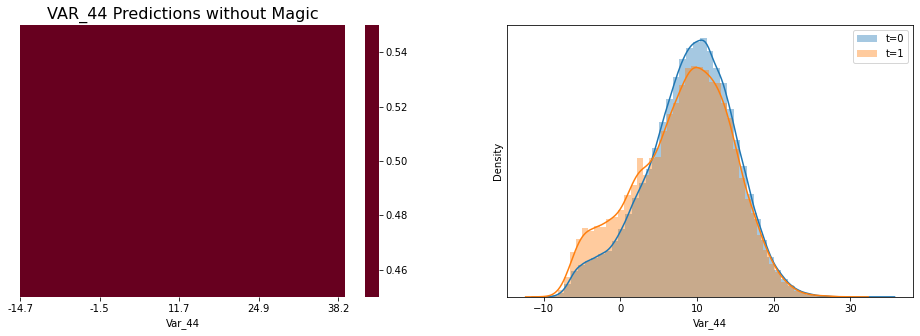

VAR_45 with magic val_auc = 0.5


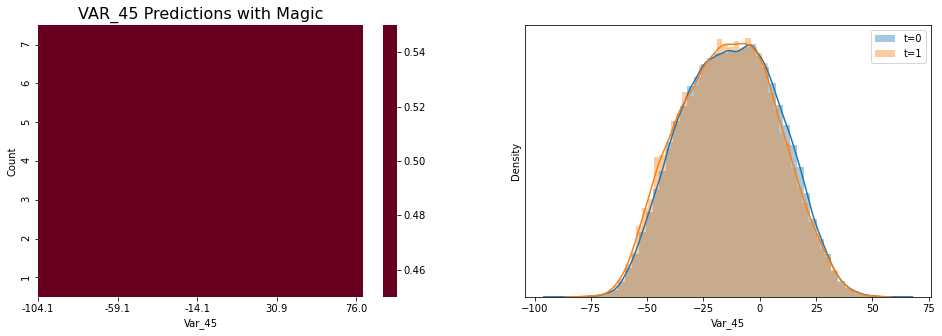

VAR_45 without magic val_auc = 0.5


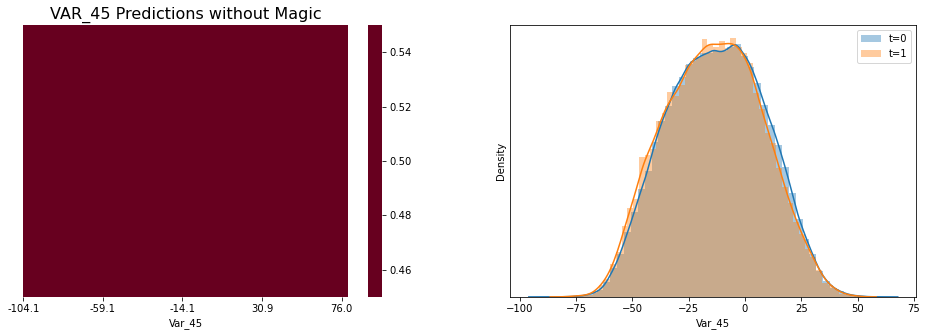

VAR_46 with magic val_auc = 0.5


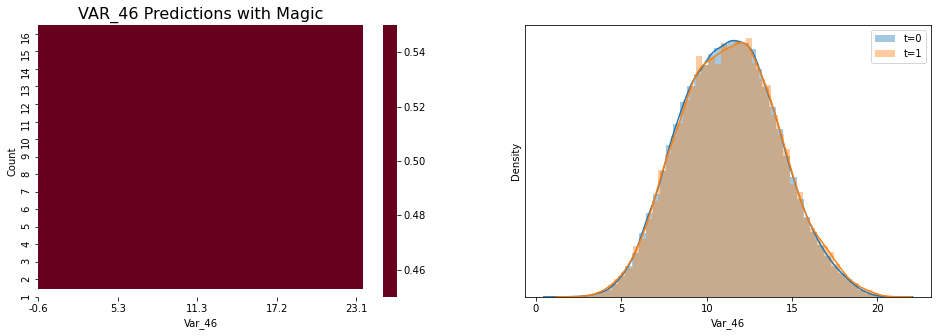

VAR_46 without magic val_auc = 0.5


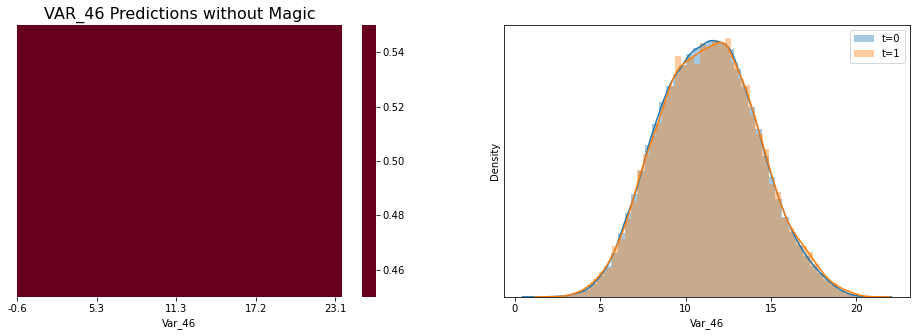

VAR_47 with magic val_auc = 0.5


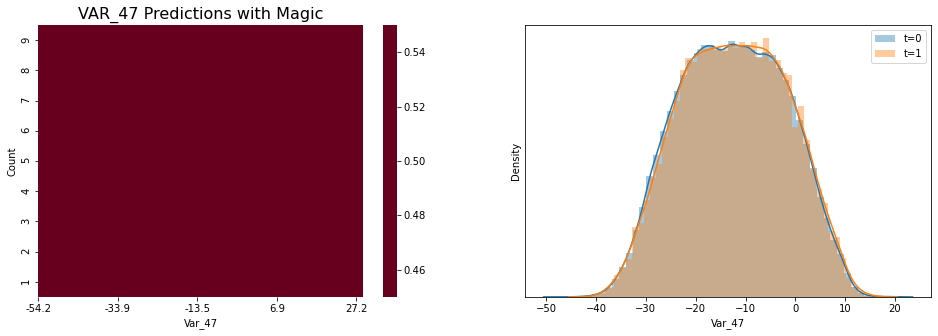

VAR_47 without magic val_auc = 0.5


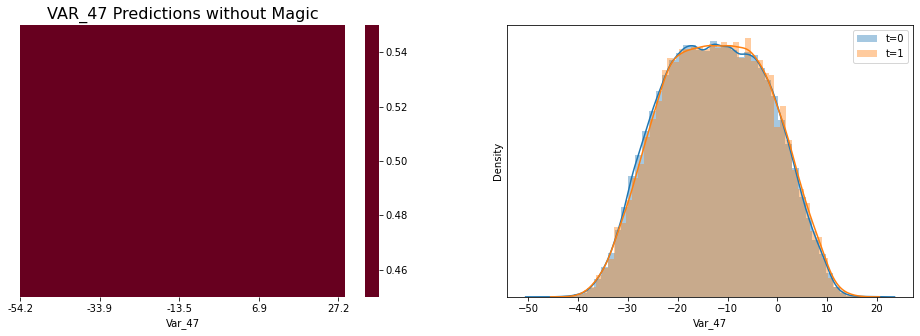

VAR_48 with magic val_auc = 0.5


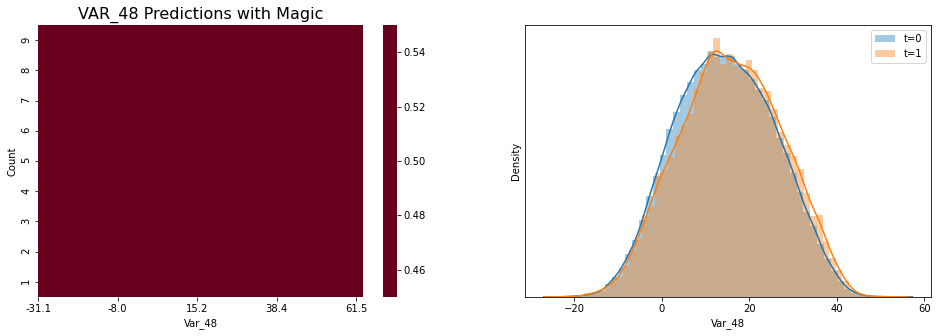

VAR_48 without magic val_auc = 0.5


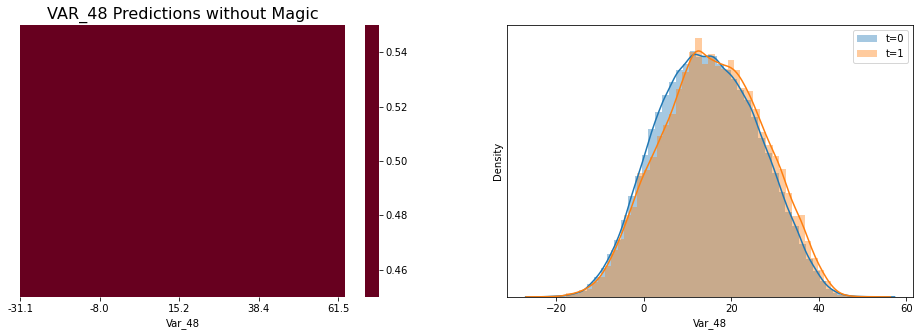

VAR_49 with magic val_auc = 0.5


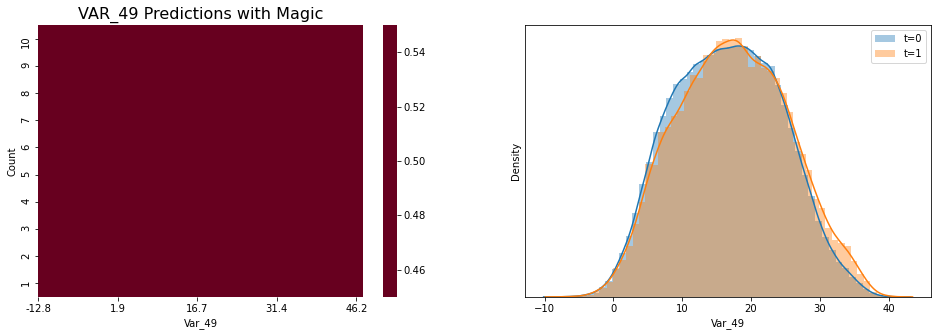

VAR_49 without magic val_auc = 0.5


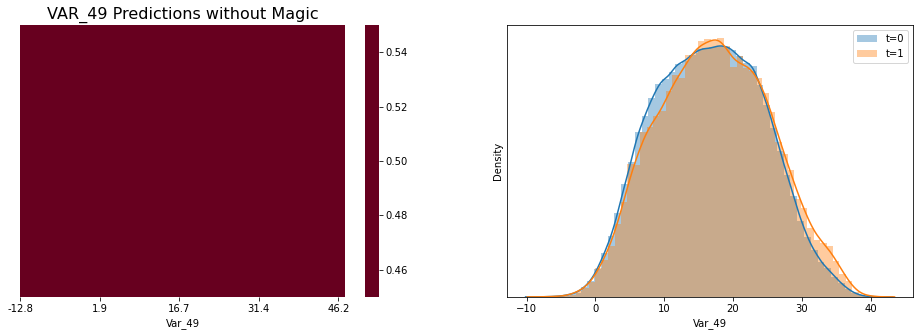

VAR_50 with magic val_auc = 0.5


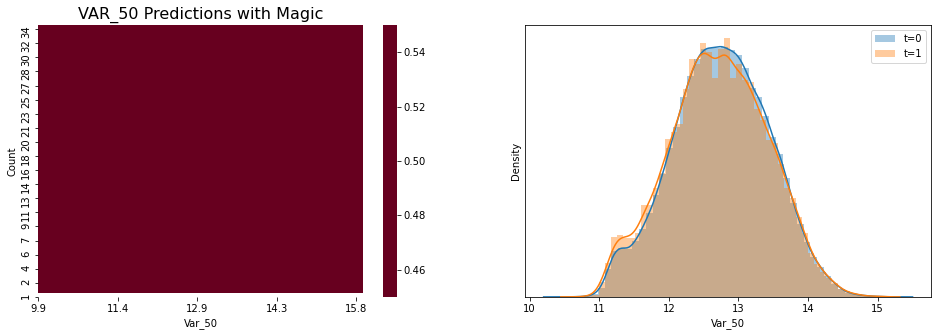

VAR_50 without magic val_auc = 0.5


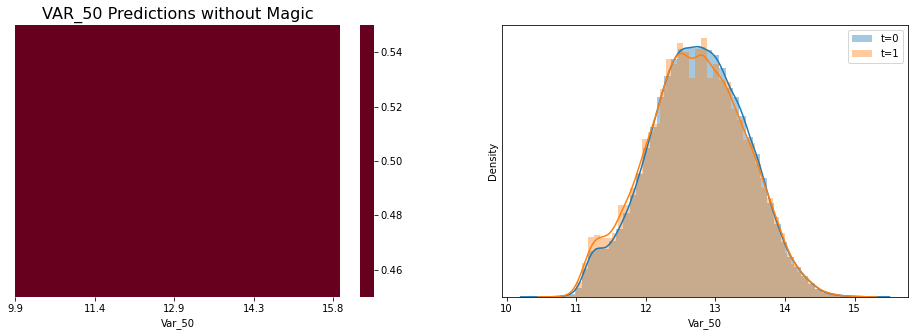

VAR_51 with magic val_auc = 0.5


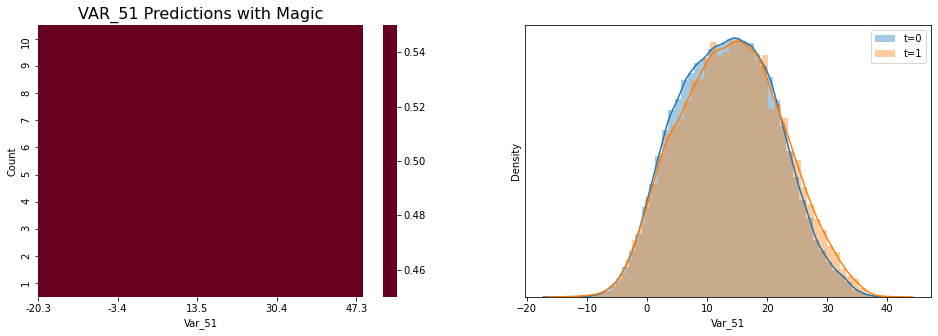

VAR_51 without magic val_auc = 0.5


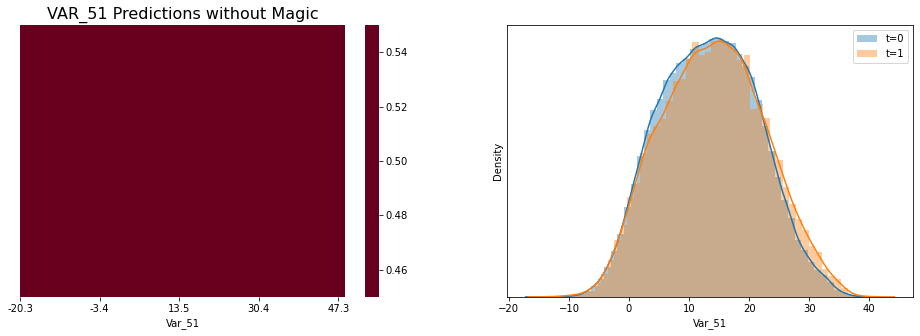

VAR_52 with magic val_auc = 0.5


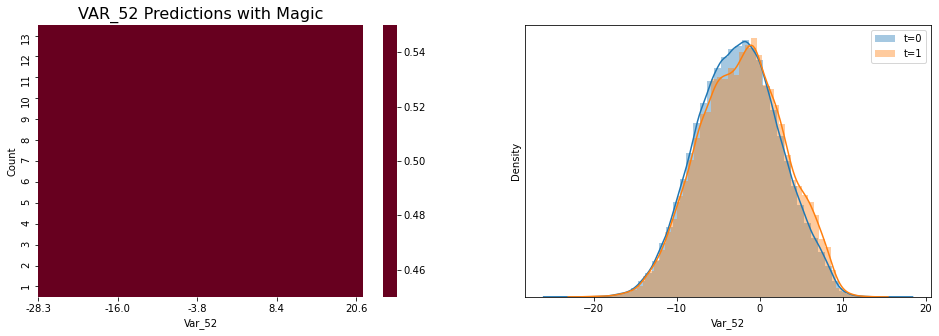

VAR_52 without magic val_auc = 0.5


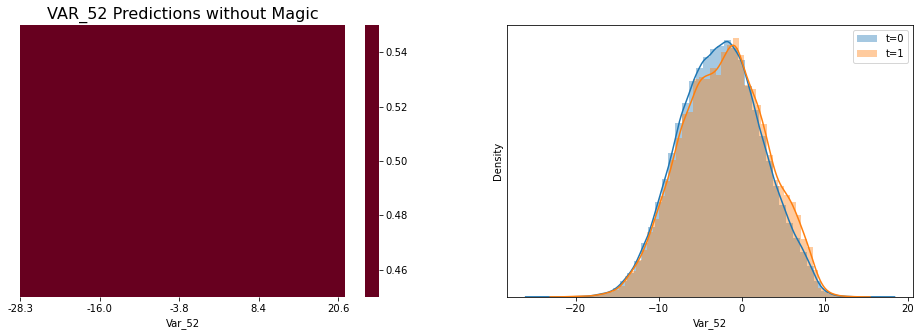

VAR_53 with magic val_auc = 0.55492


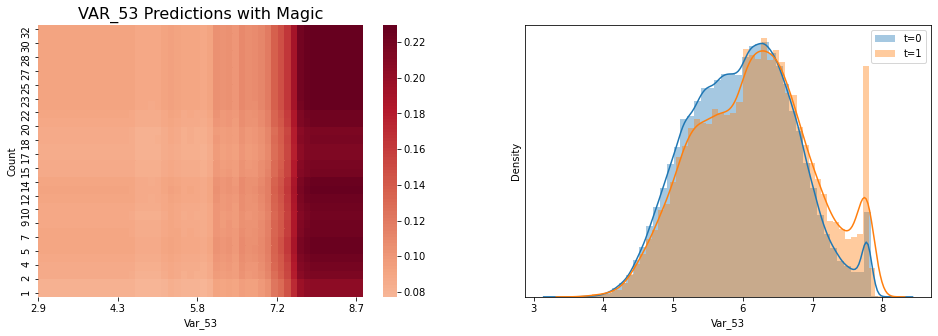

VAR_53 without magic val_auc = 0.55448


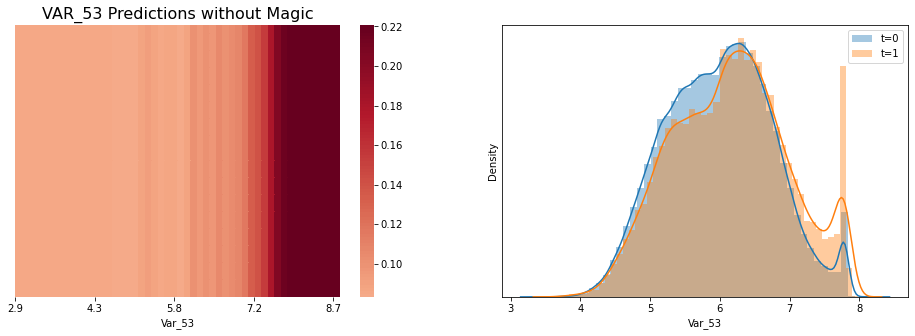

VAR_54 with magic val_auc = 0.5


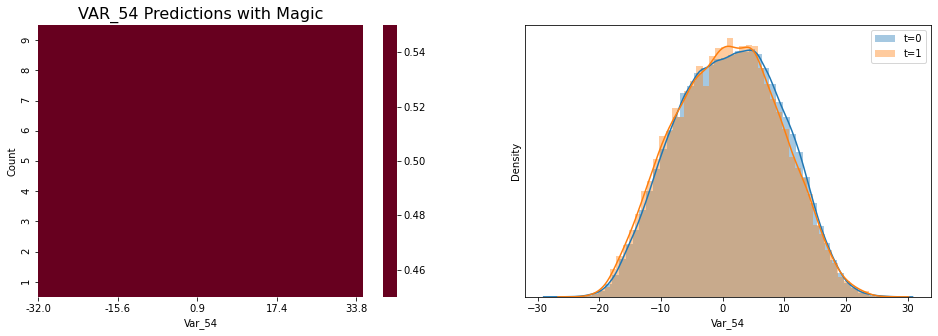

VAR_54 without magic val_auc = 0.5


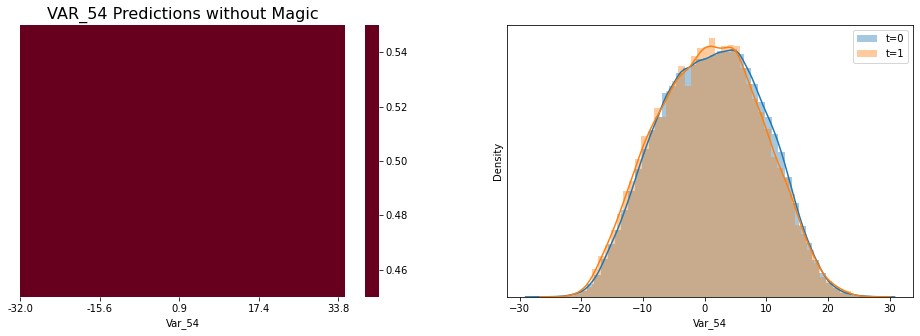

VAR_55 with magic val_auc = 0.5


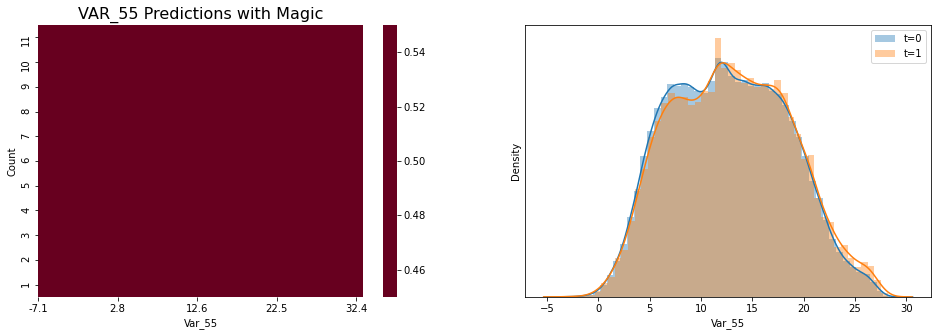

VAR_55 without magic val_auc = 0.5


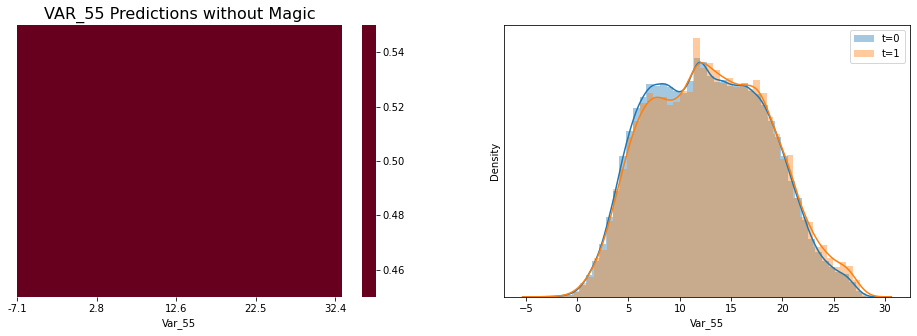

VAR_56 with magic val_auc = 0.5


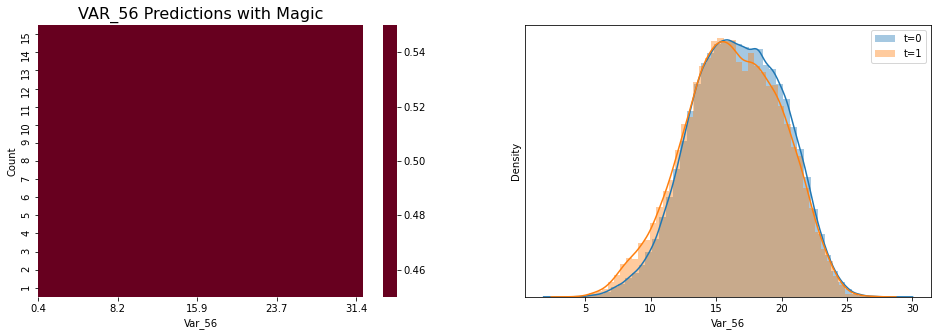

VAR_56 without magic val_auc = 0.5


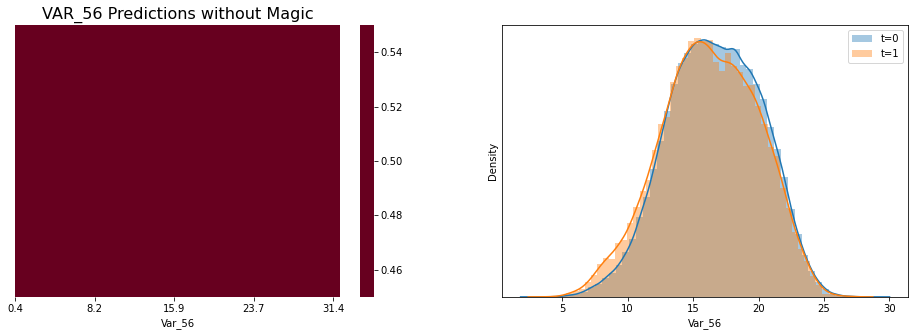

VAR_57 with magic val_auc = 0.5


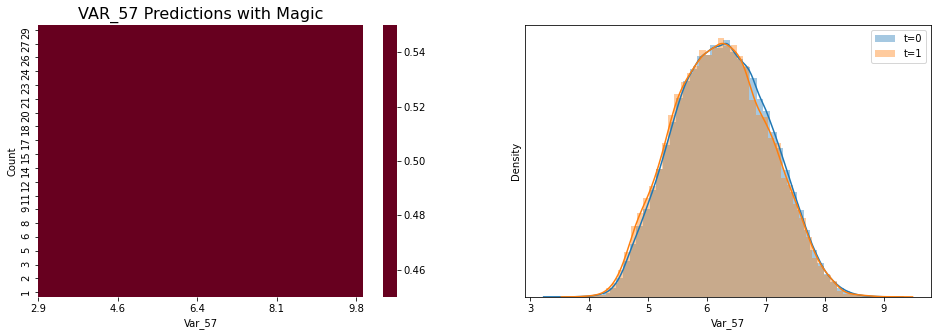

VAR_57 without magic val_auc = 0.5


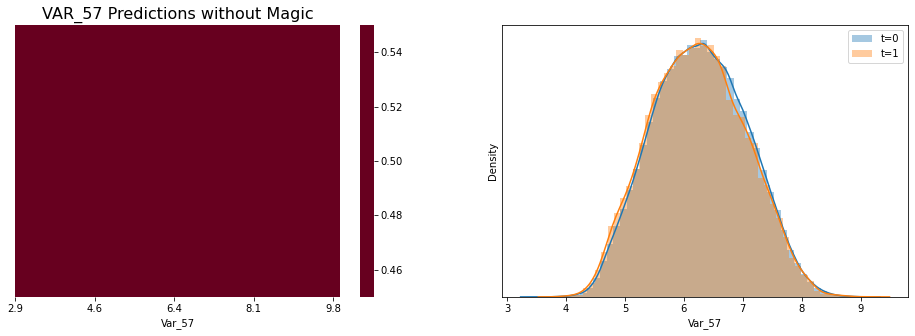

VAR_58 with magic val_auc = 0.5


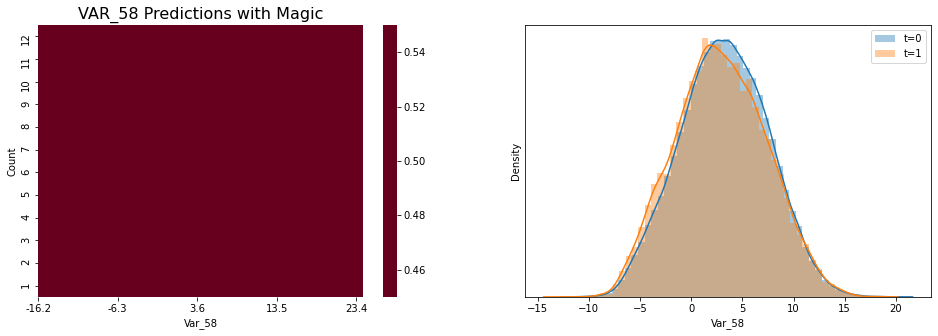

VAR_58 without magic val_auc = 0.5


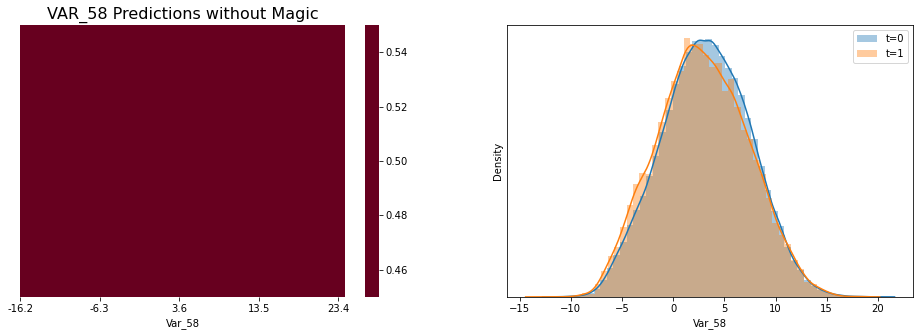

VAR_59 with magic val_auc = 0.5


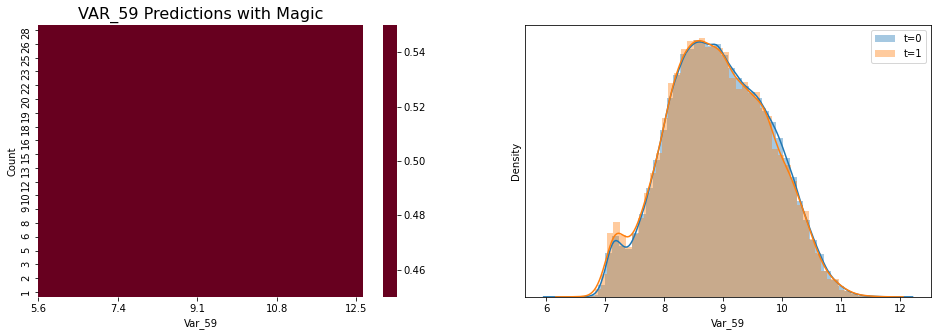

VAR_59 without magic val_auc = 0.5


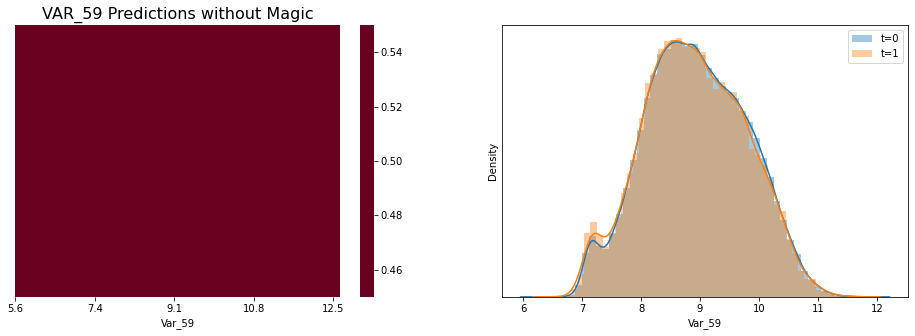

VAR_60 with magic val_auc = 0.5


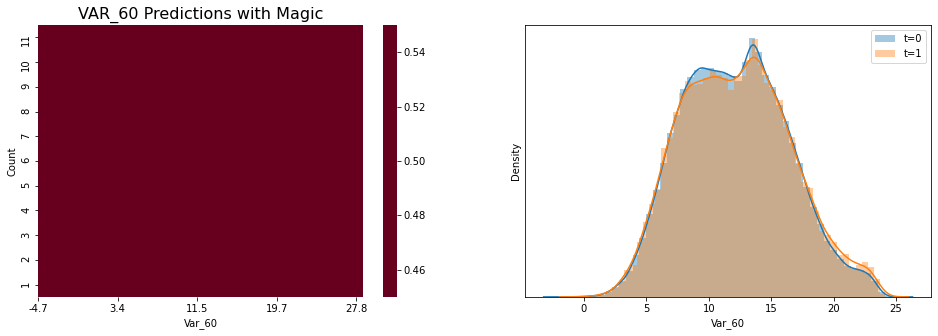

VAR_60 without magic val_auc = 0.5


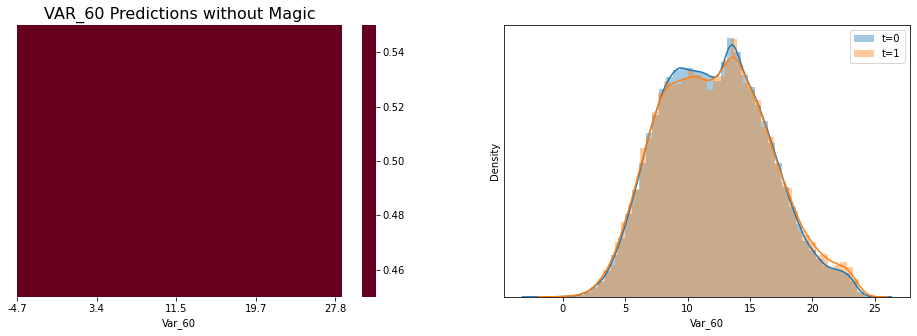

VAR_61 with magic val_auc = 0.5


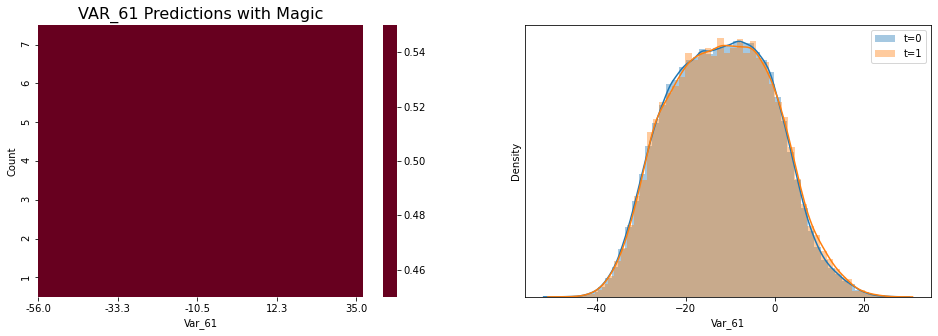

VAR_61 without magic val_auc = 0.5


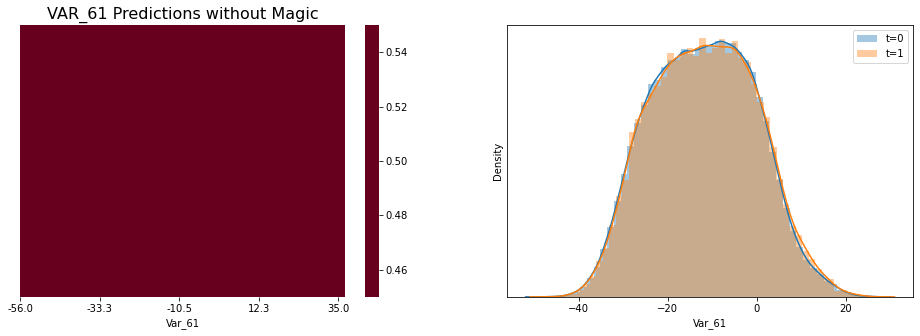

VAR_62 with magic val_auc = 0.5


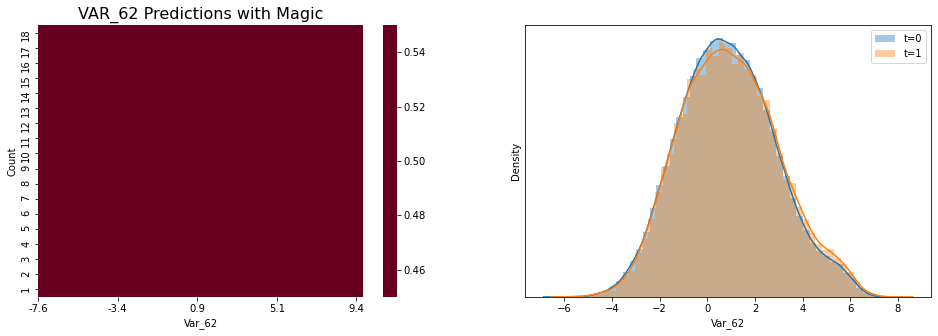

VAR_62 without magic val_auc = 0.5


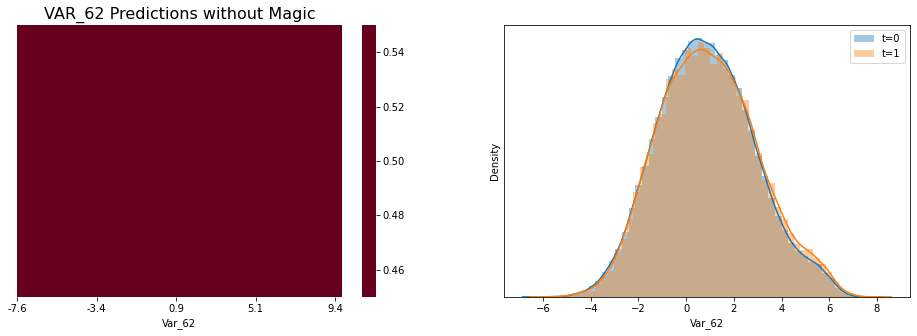

VAR_63 with magic val_auc = 0.5


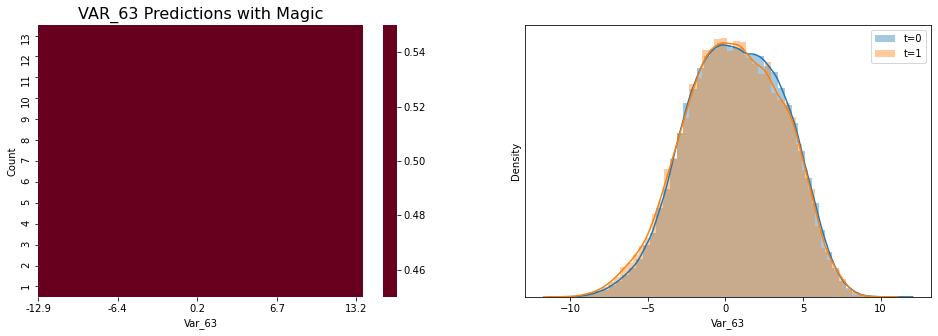

VAR_63 without magic val_auc = 0.5


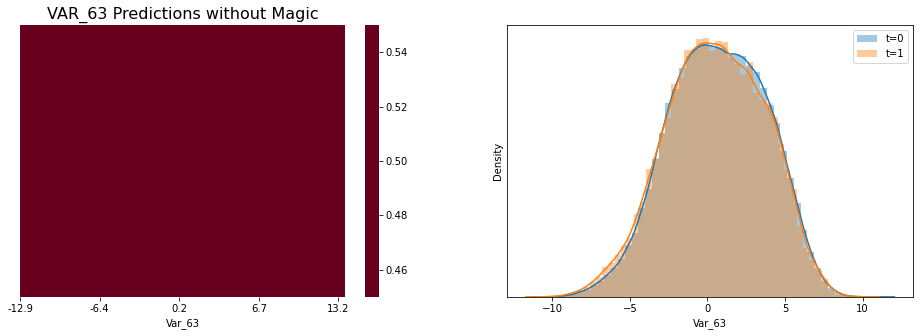

VAR_64 with magic val_auc = 0.5


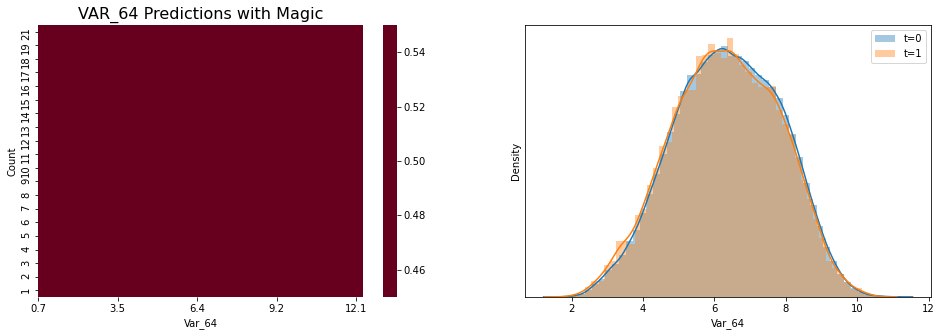

VAR_64 without magic val_auc = 0.5


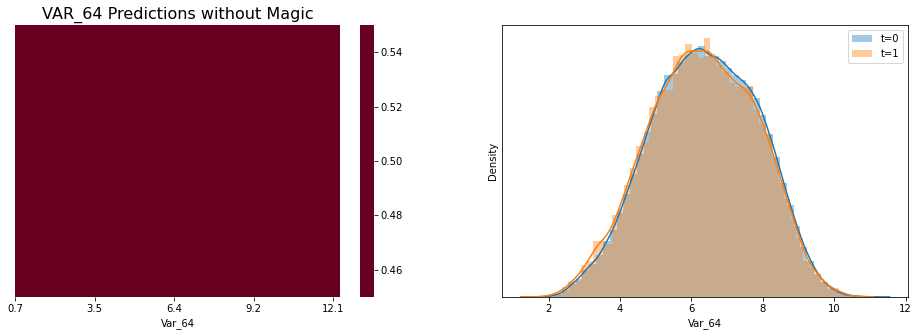

VAR_65 with magic val_auc = 0.5


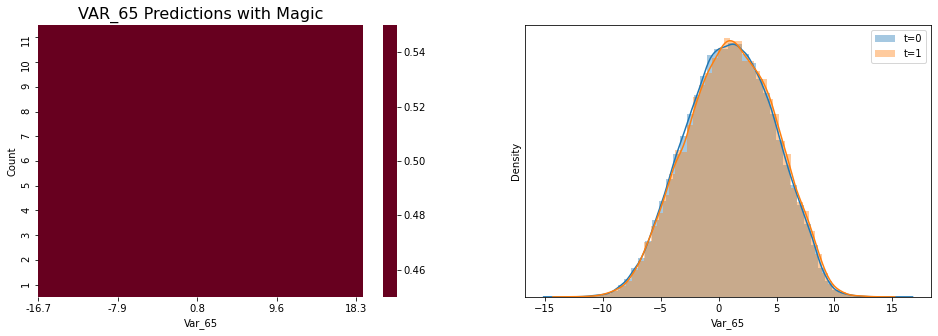

VAR_65 without magic val_auc = 0.5


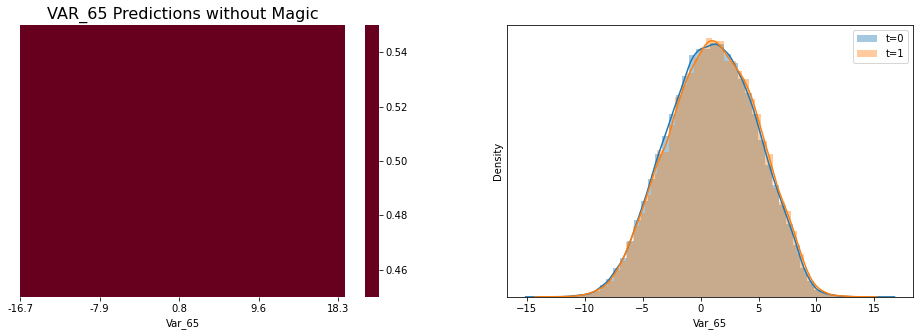

VAR_66 with magic val_auc = 0.5


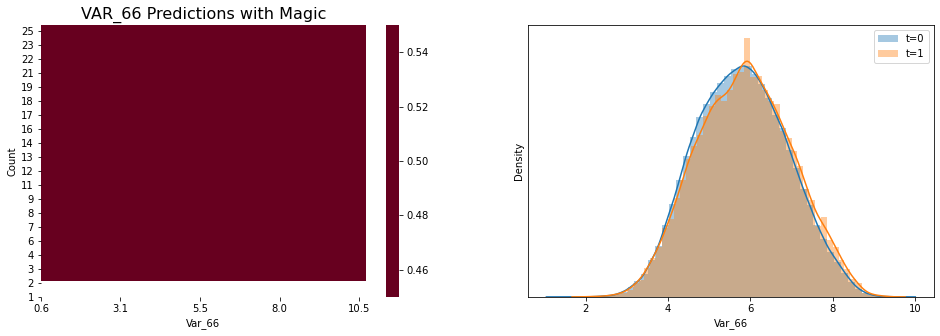

VAR_66 without magic val_auc = 0.5


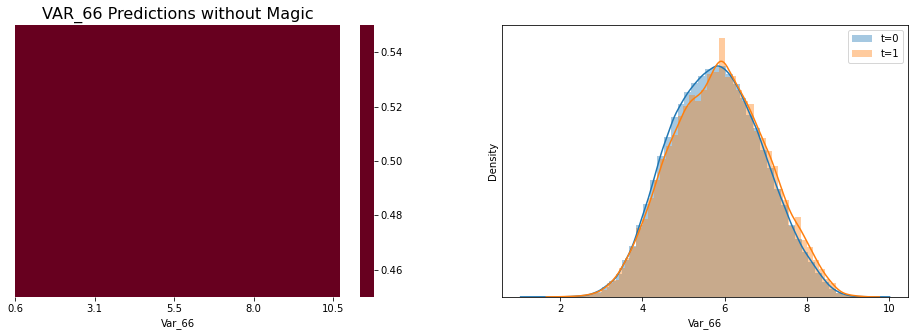

VAR_67 with magic val_auc = 0.5


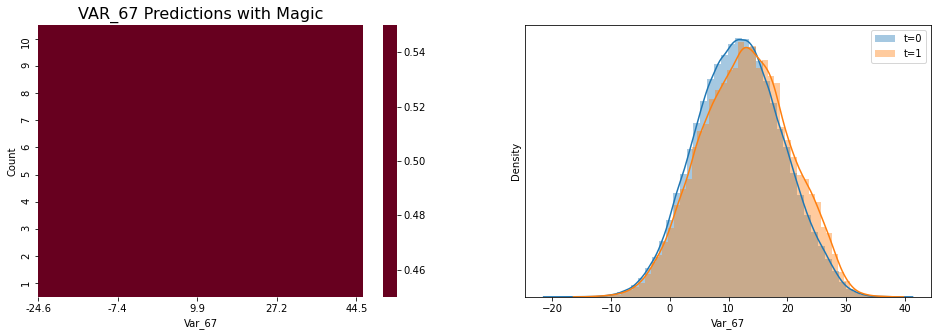

VAR_67 without magic val_auc = 0.5


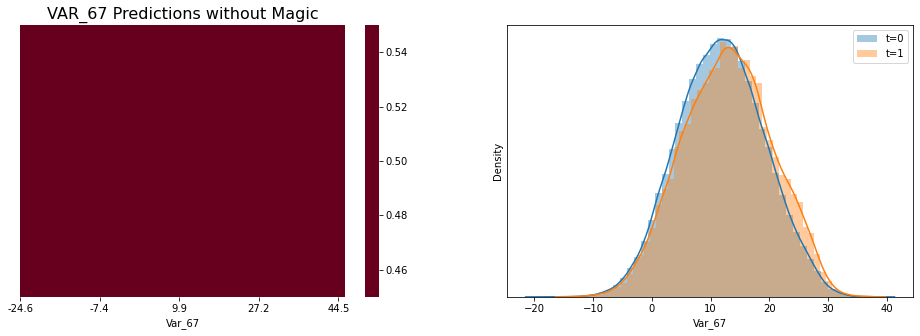

VAR_68 with magic val_auc = 0.5


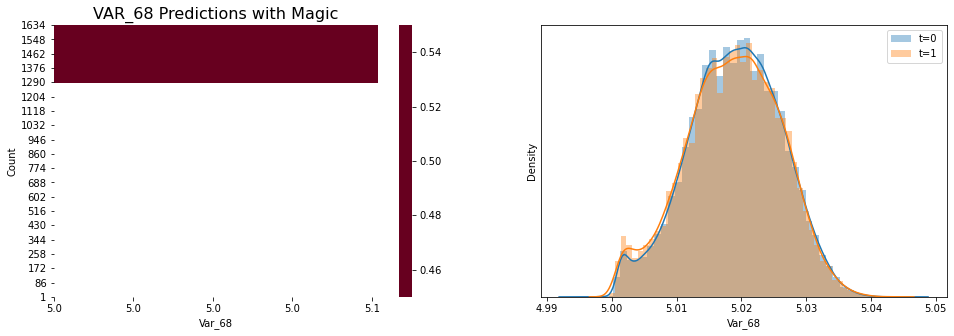

VAR_68 without magic val_auc = 0.5


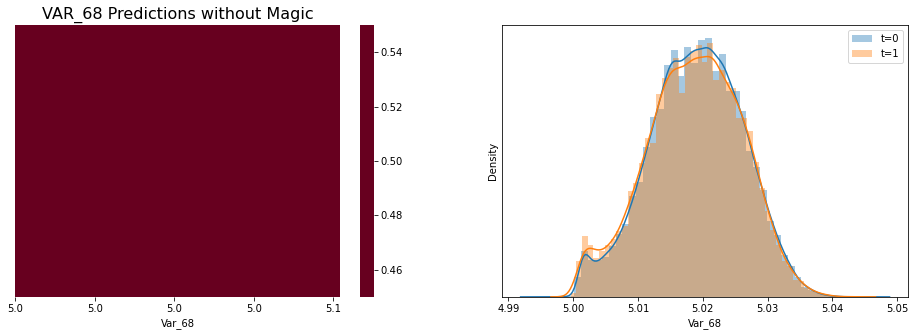

VAR_69 with magic val_auc = 0.5


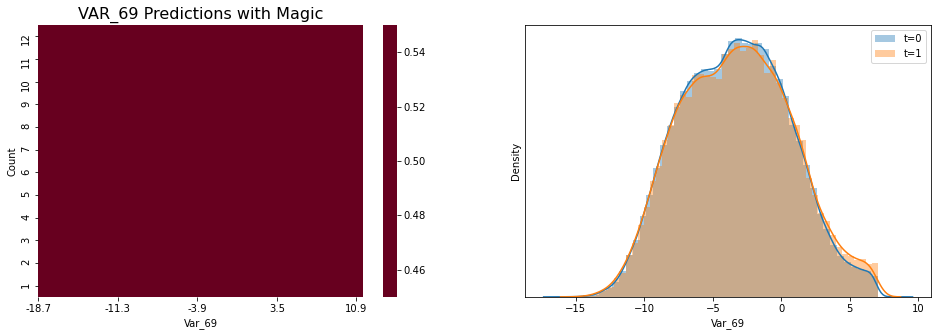

VAR_69 without magic val_auc = 0.5


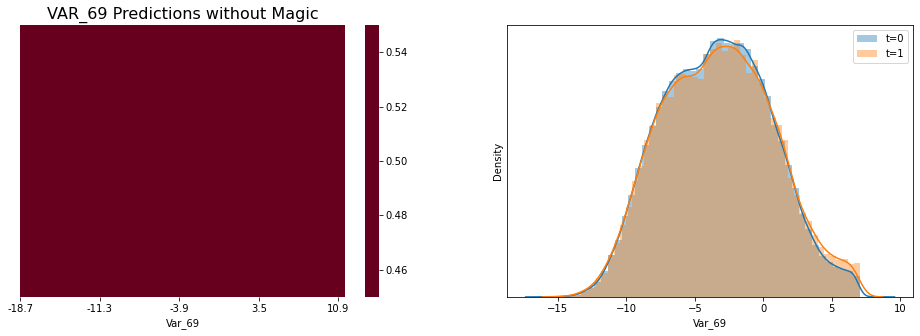

VAR_70 with magic val_auc = 0.5


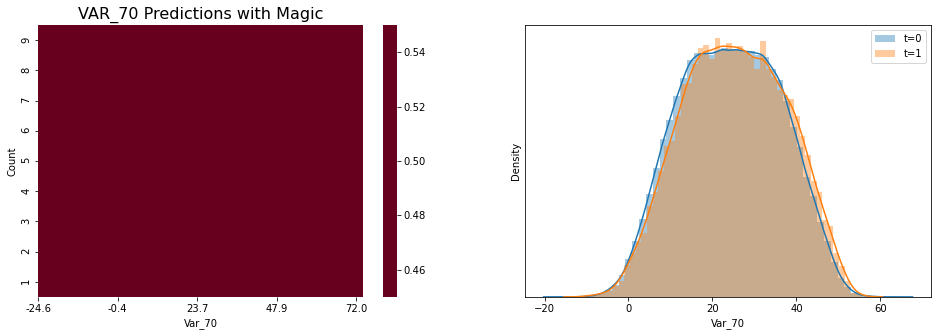

VAR_70 without magic val_auc = 0.5


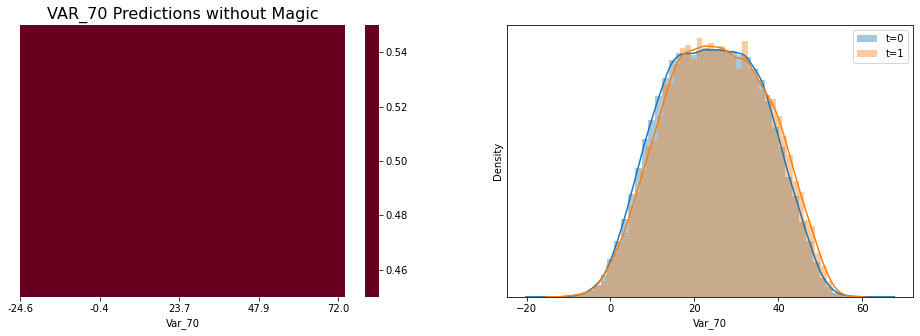

VAR_71 with magic val_auc = 0.5


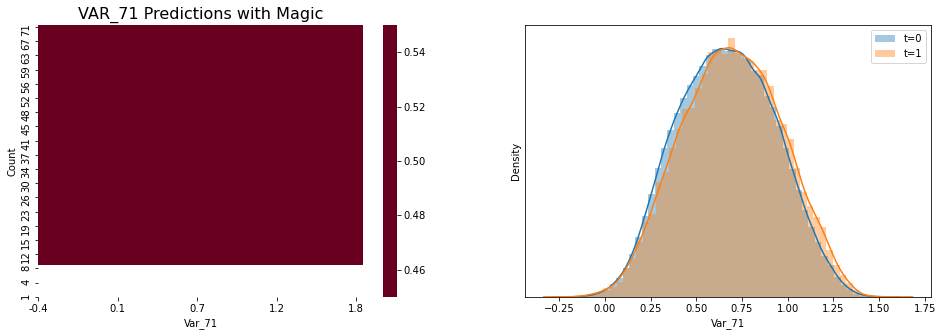

VAR_71 without magic val_auc = 0.5


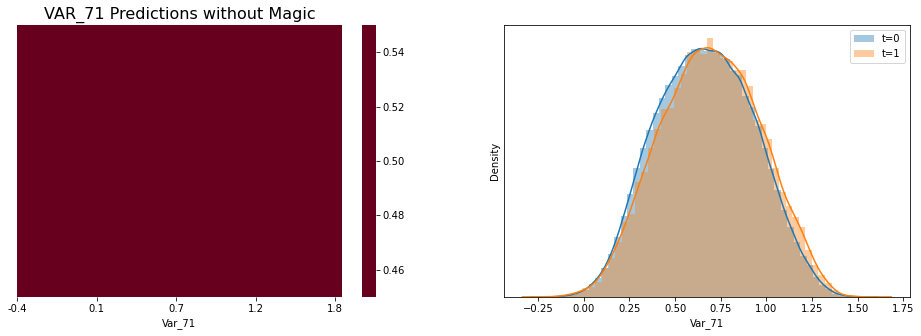

VAR_72 with magic val_auc = 0.5


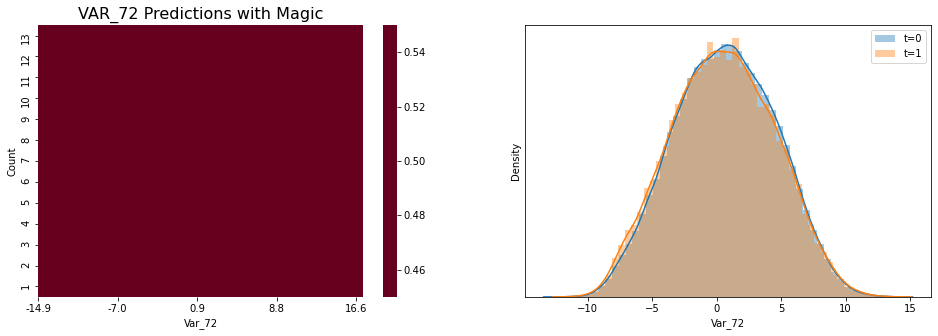

VAR_72 without magic val_auc = 0.5


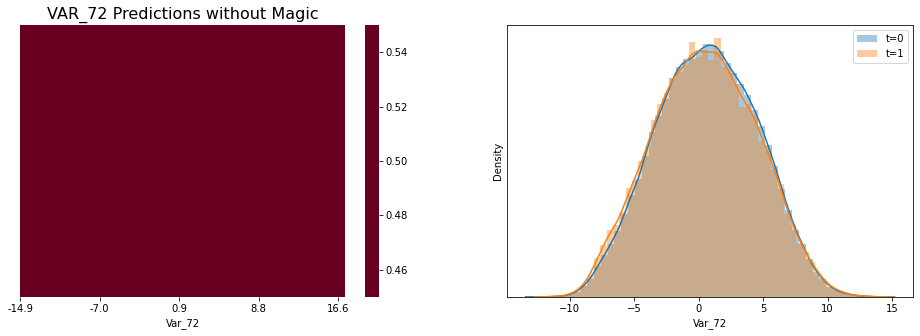

VAR_73 with magic val_auc = 0.5


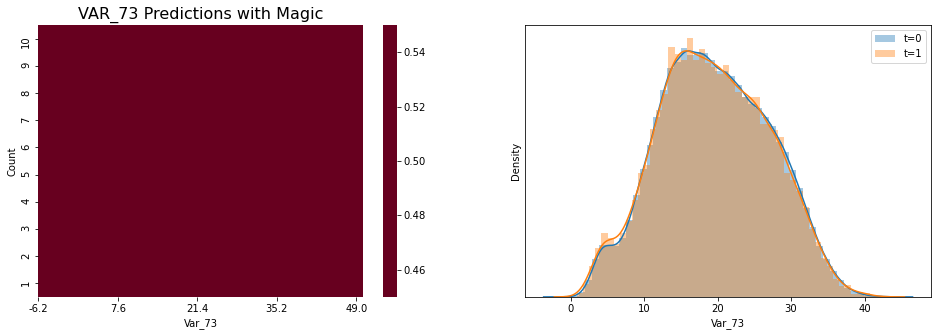

VAR_73 without magic val_auc = 0.5


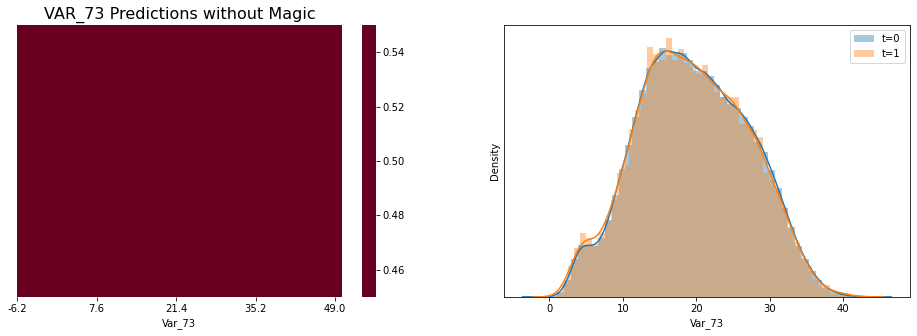

VAR_74 with magic val_auc = 0.5


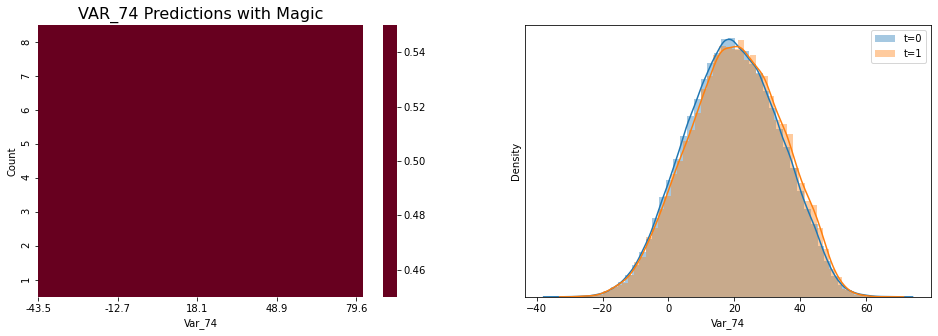

VAR_74 without magic val_auc = 0.5


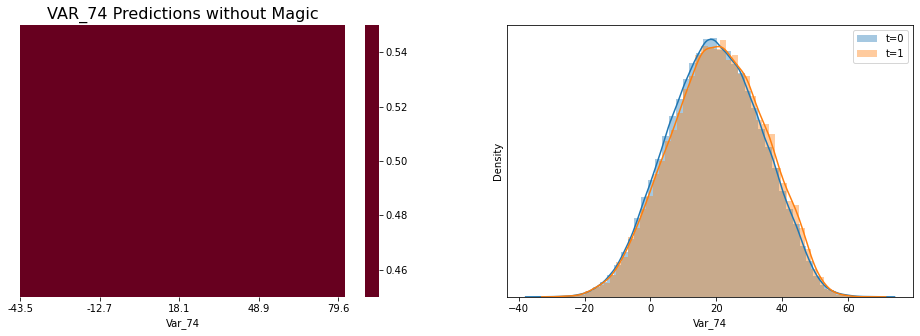

VAR_75 with magic val_auc = 0.5


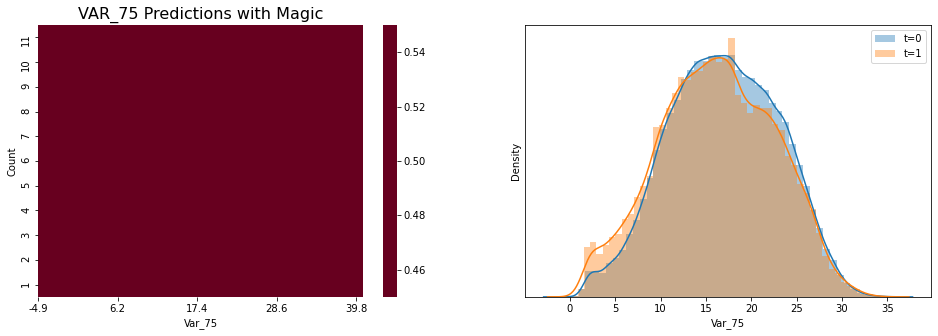

VAR_75 without magic val_auc = 0.5


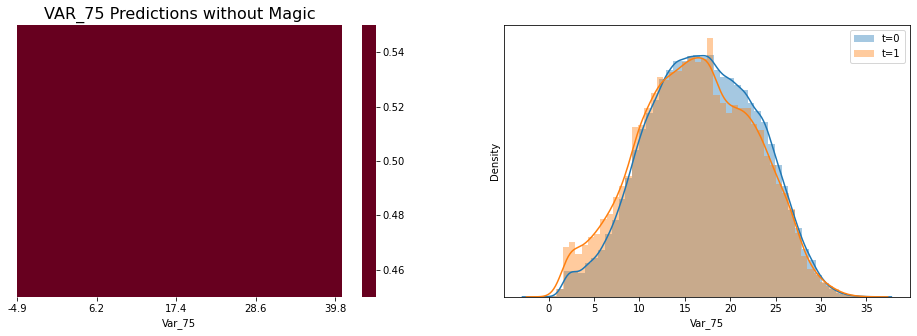

VAR_76 with magic val_auc = 0.50588


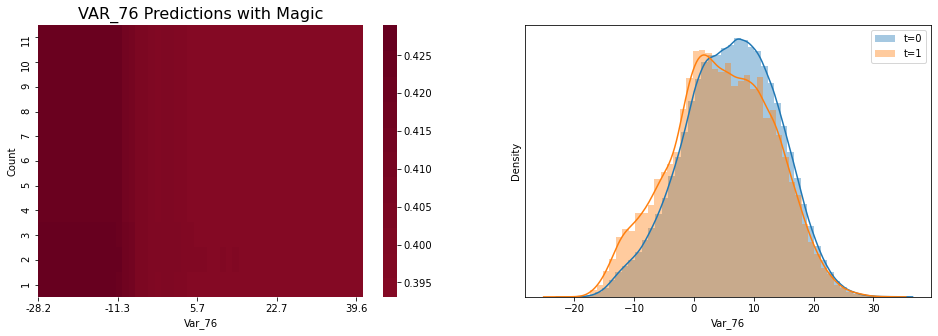

VAR_76 without magic val_auc = 0.50604


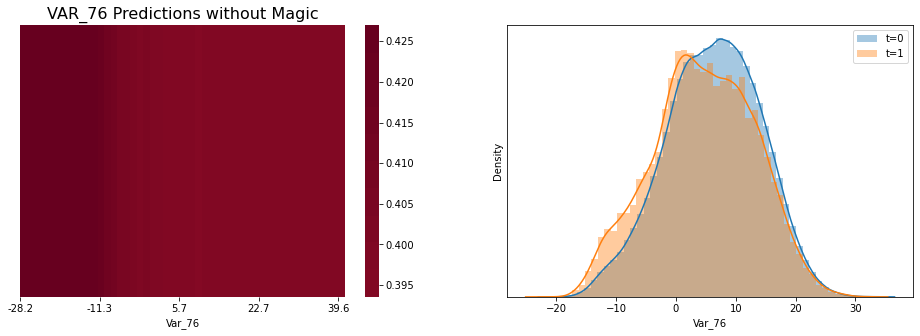

VAR_77 with magic val_auc = 0.5


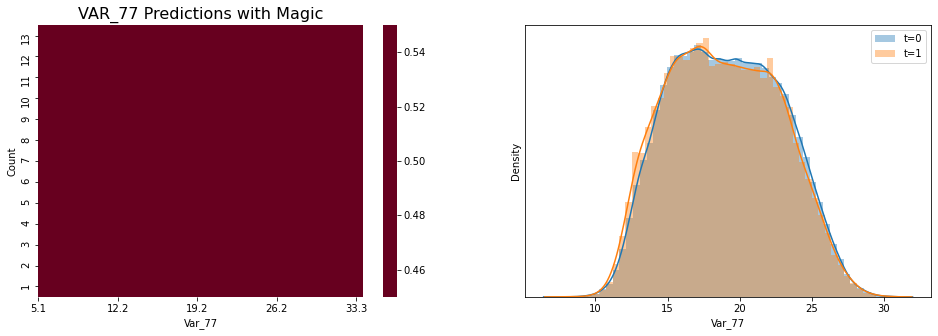

VAR_77 without magic val_auc = 0.5


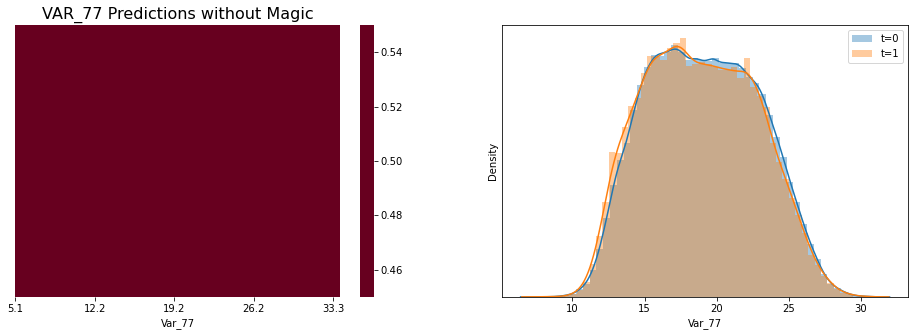

VAR_78 with magic val_auc = 0.51808


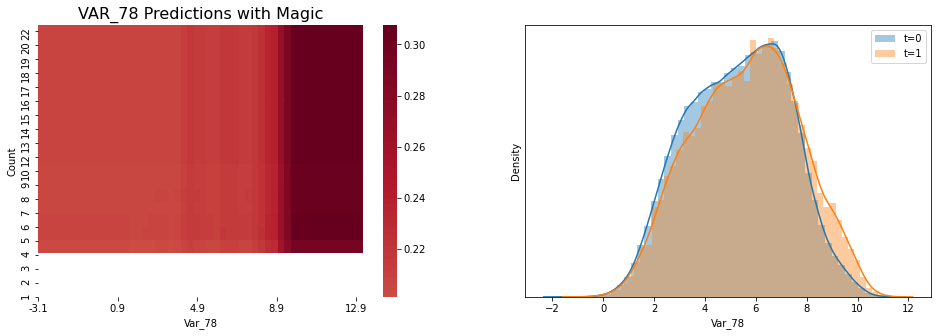

VAR_78 without magic val_auc = 0.5187


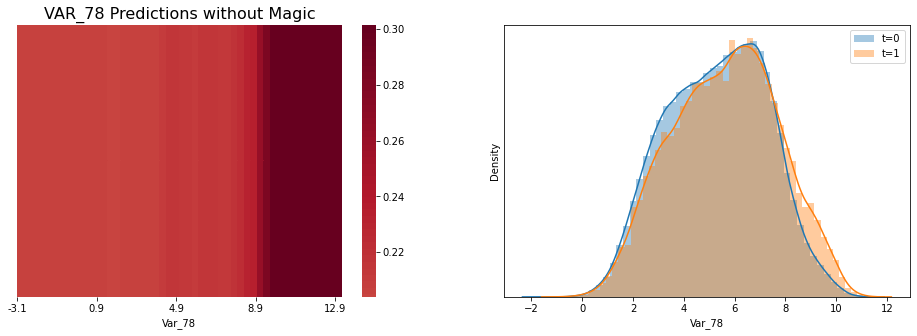

VAR_79 with magic val_auc = 0.5


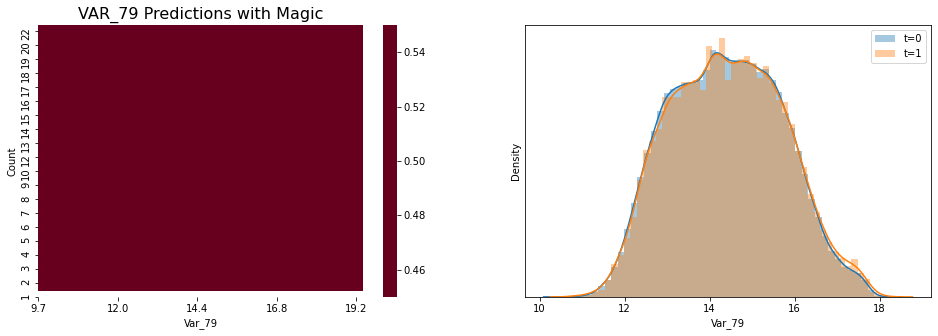

VAR_79 without magic val_auc = 0.5


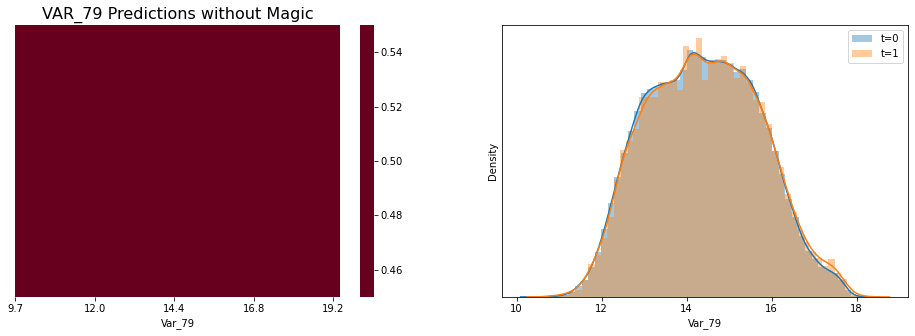

VAR_80 with magic val_auc = 0.54806


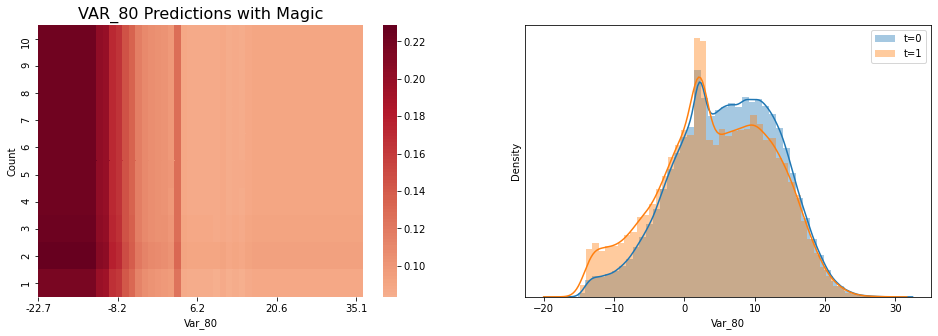

VAR_80 without magic val_auc = 0.55125


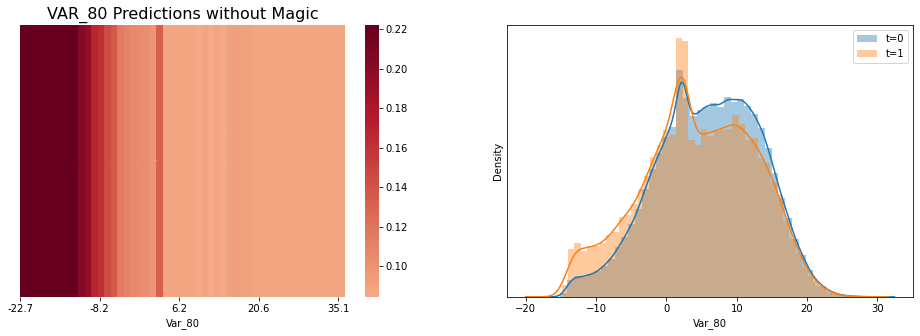

VAR_81 with magic val_auc = 0.56917


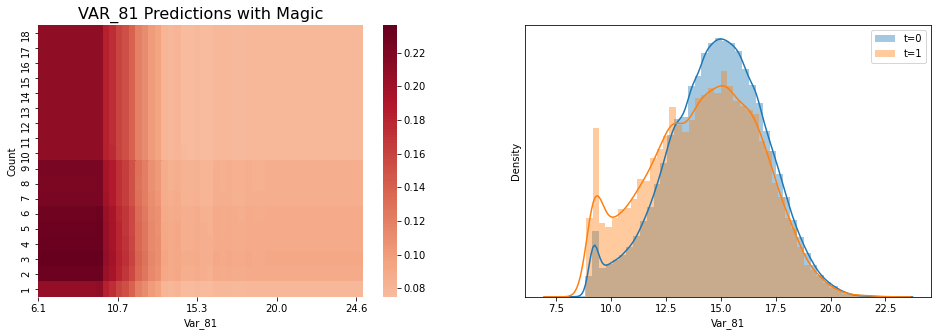

VAR_81 without magic val_auc = 0.56927


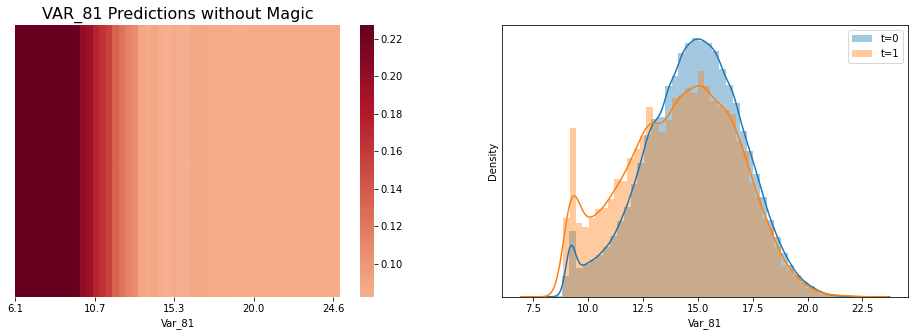

VAR_82 with magic val_auc = 0.5


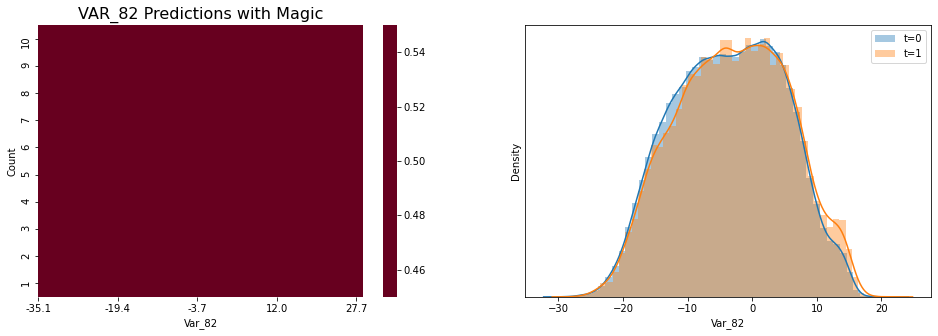

VAR_82 without magic val_auc = 0.5


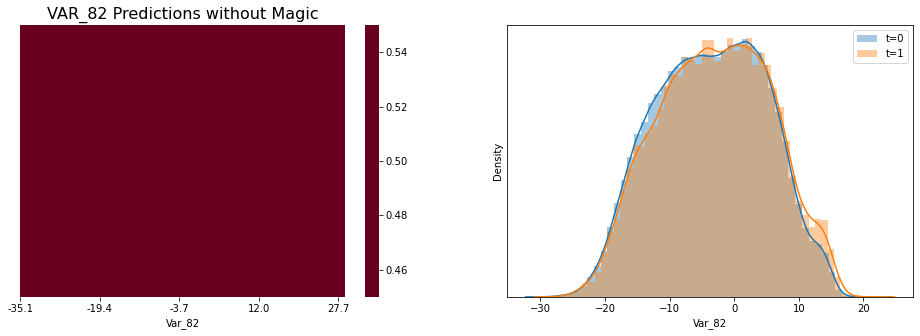

VAR_83 with magic val_auc = 0.5


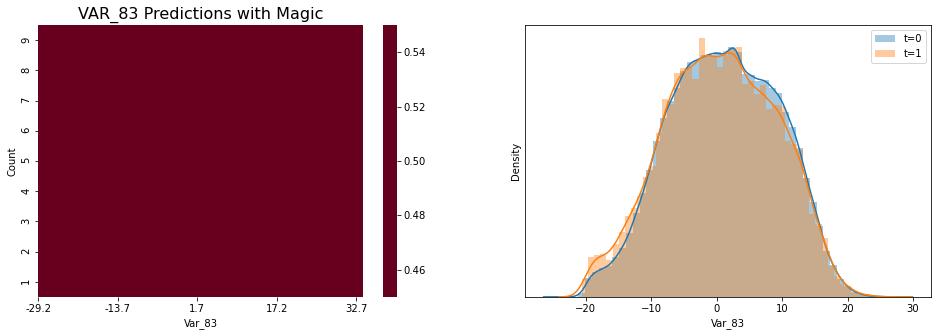

VAR_83 without magic val_auc = 0.5


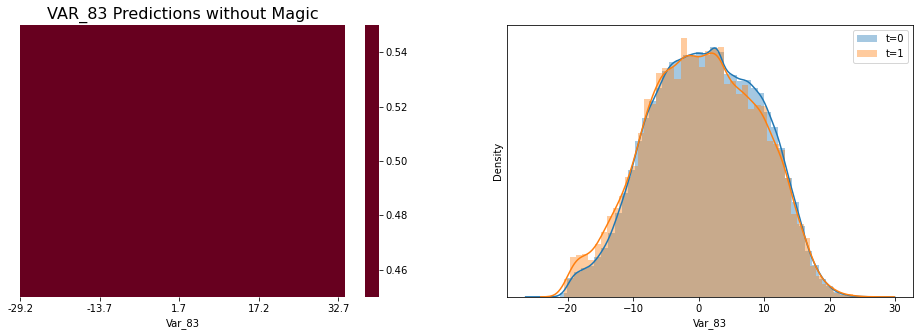

VAR_84 with magic val_auc = 0.5


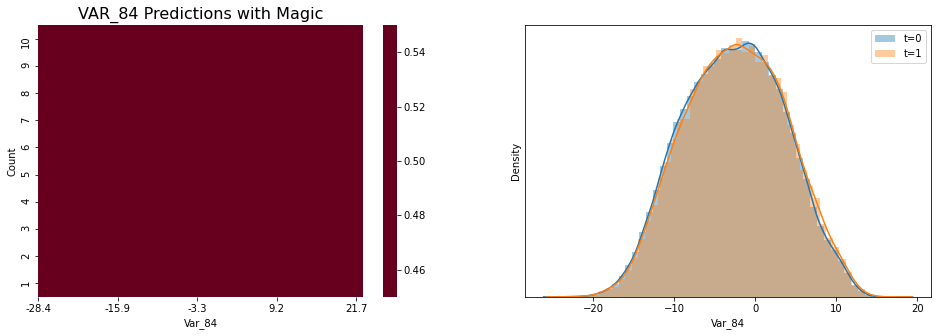

VAR_84 without magic val_auc = 0.5


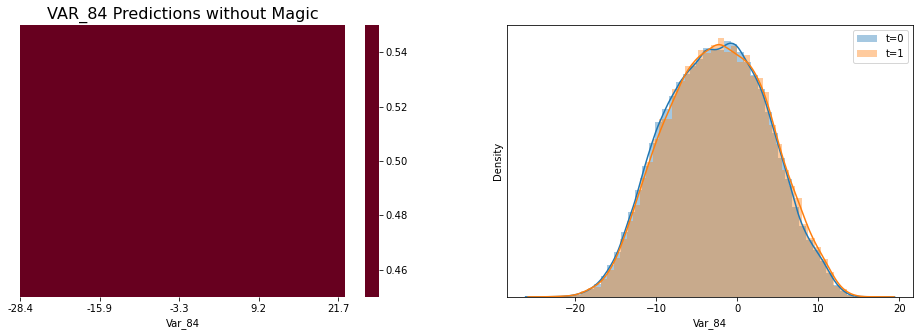

VAR_85 with magic val_auc = 0.5


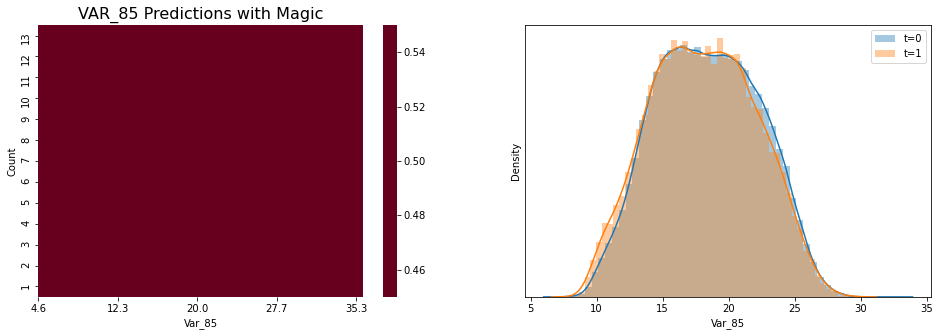

VAR_85 without magic val_auc = 0.5


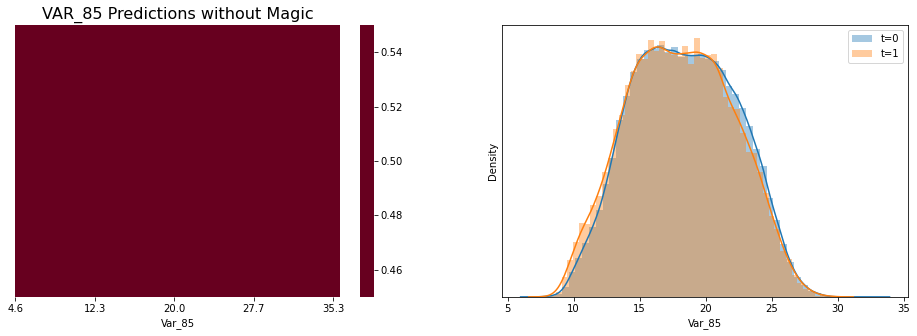

VAR_86 with magic val_auc = 0.5


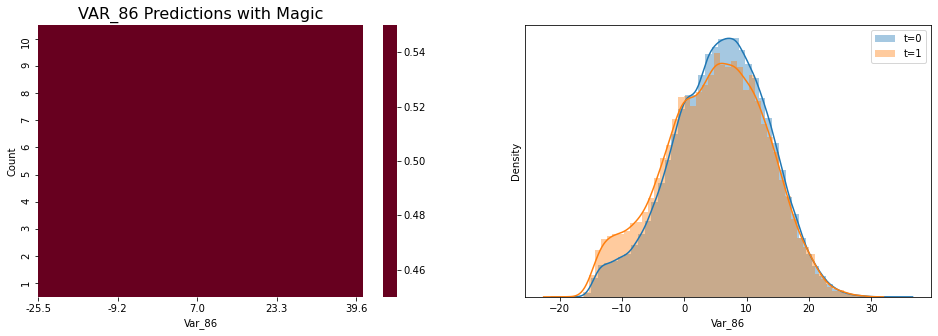

VAR_86 without magic val_auc = 0.5


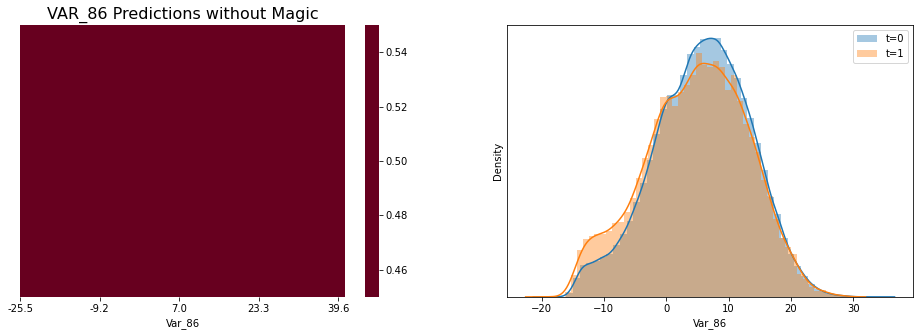

VAR_87 with magic val_auc = 0.5


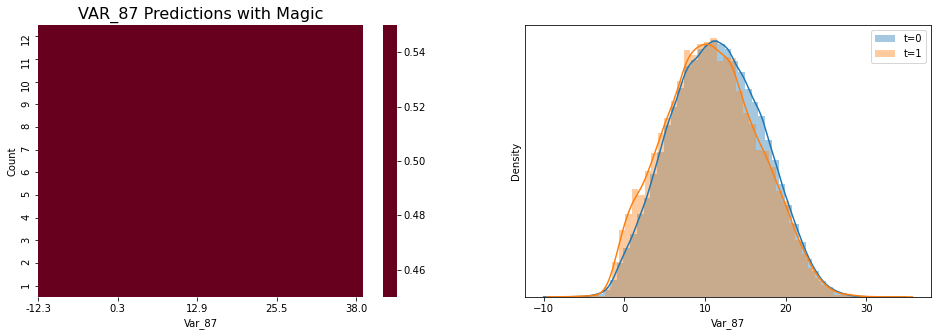

VAR_87 without magic val_auc = 0.5


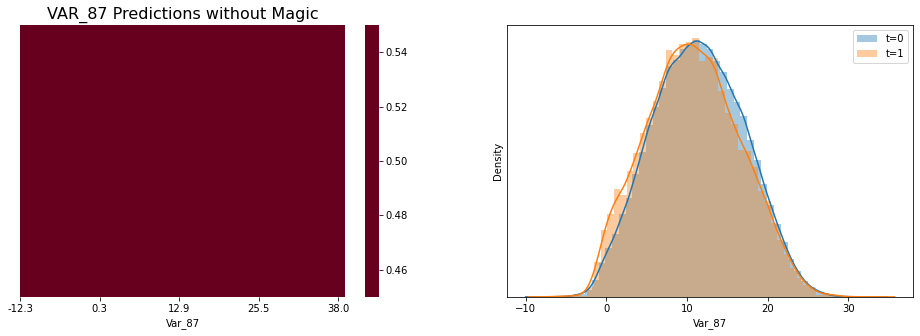

VAR_88 with magic val_auc = 0.5


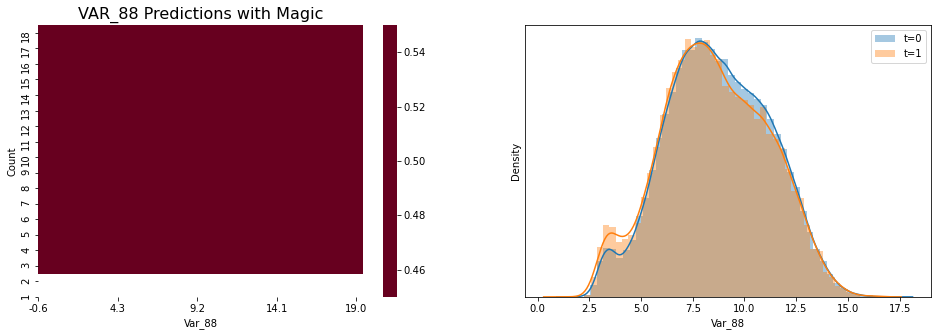

VAR_88 without magic val_auc = 0.5


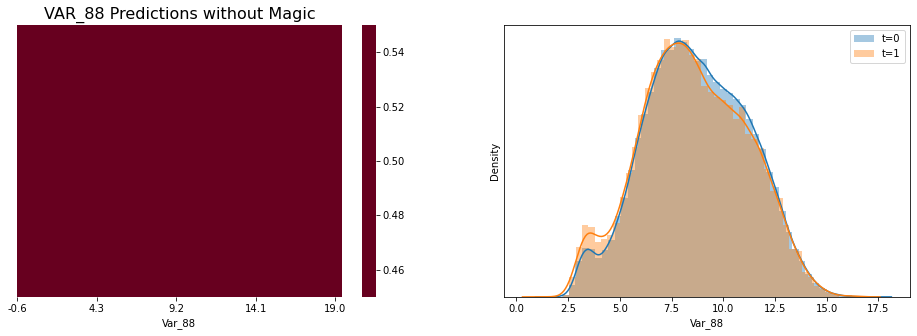

VAR_89 with magic val_auc = 0.5


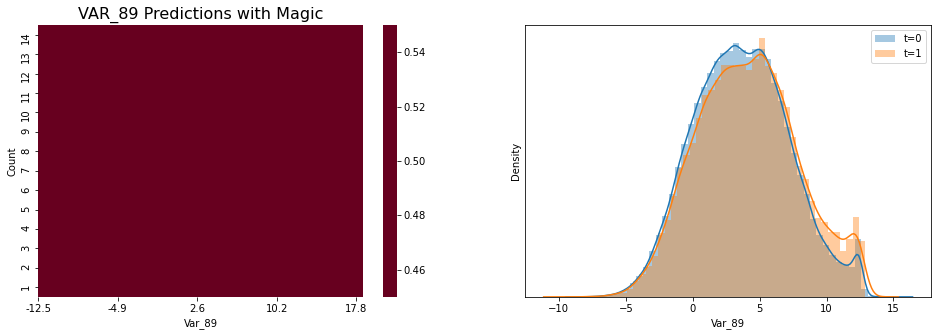

VAR_89 without magic val_auc = 0.5


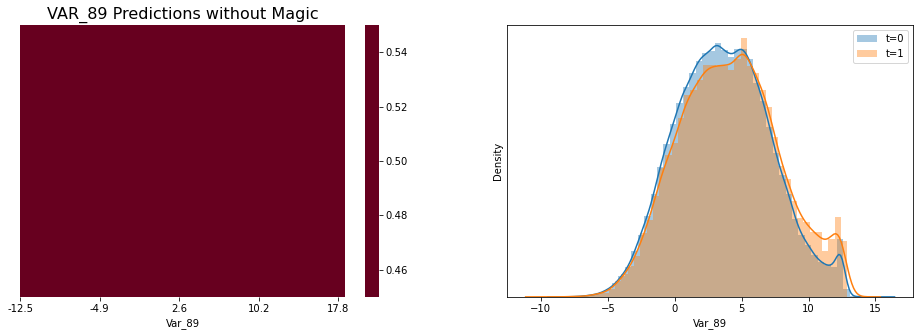

VAR_90 with magic val_auc = 0.5


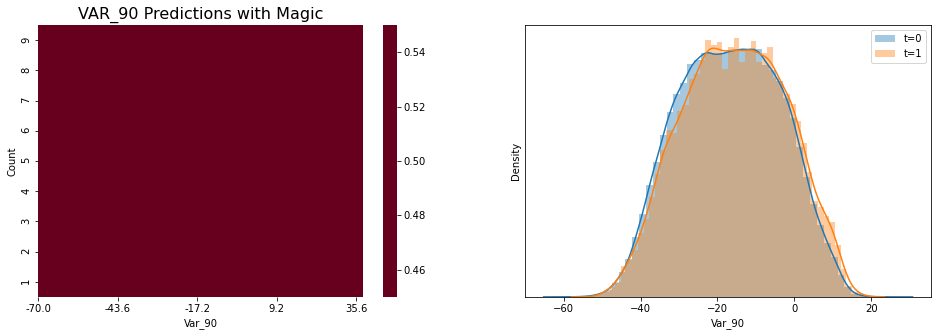

VAR_90 without magic val_auc = 0.5


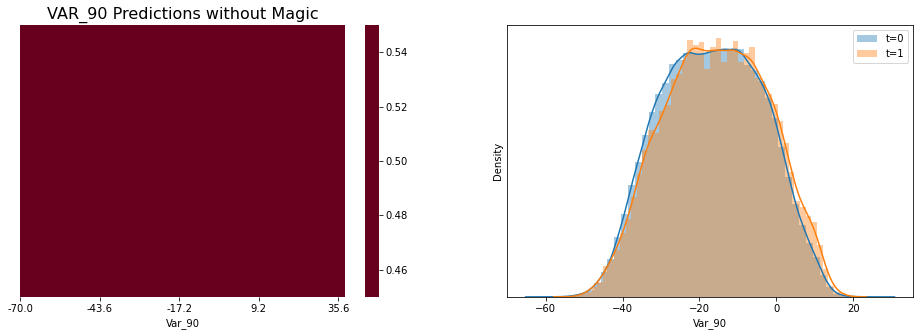

VAR_91 with magic val_auc = 0.5


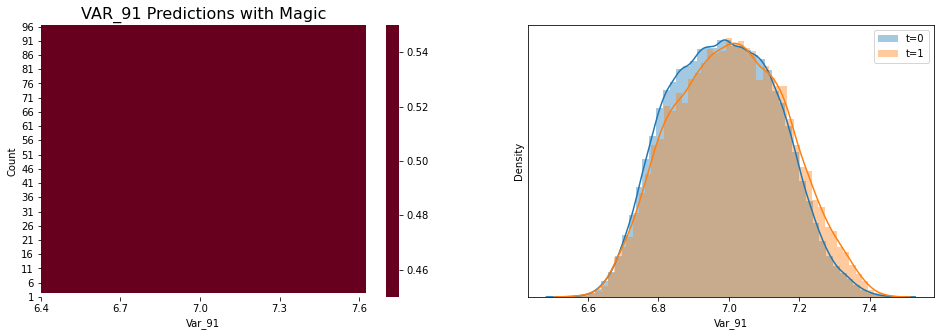

VAR_91 without magic val_auc = 0.5


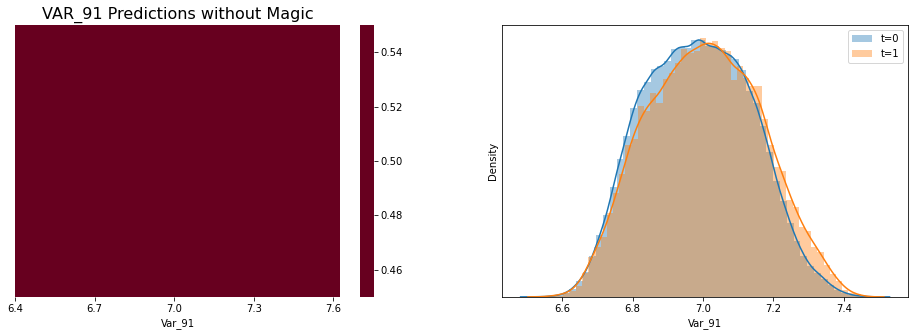

VAR_92 with magic val_auc = 0.5


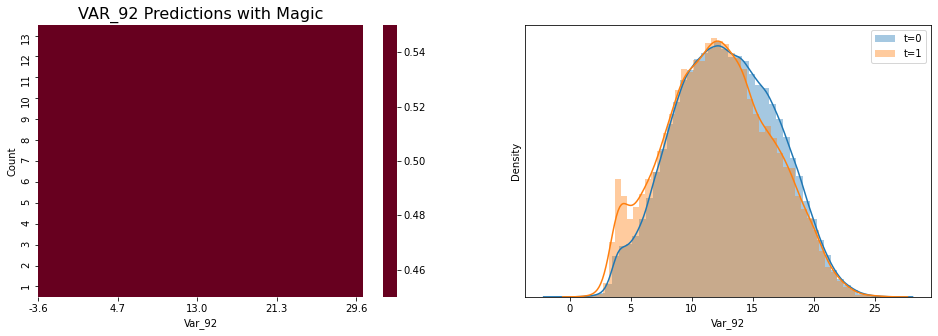

VAR_92 without magic val_auc = 0.5


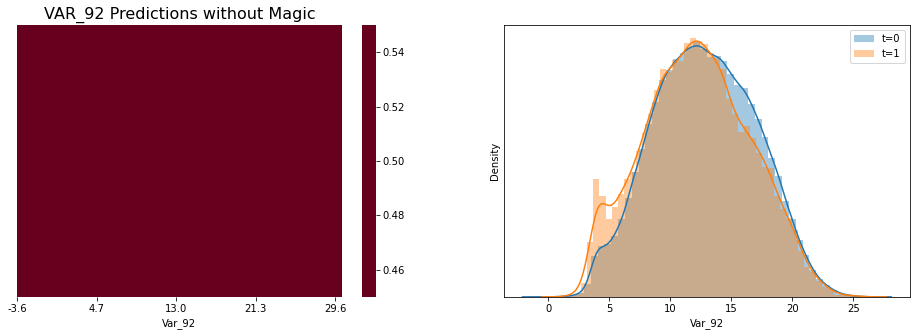

VAR_93 with magic val_auc = 0.5


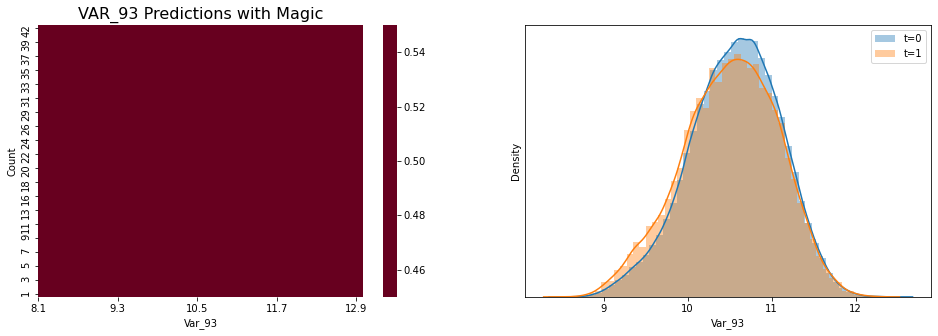

VAR_93 without magic val_auc = 0.5


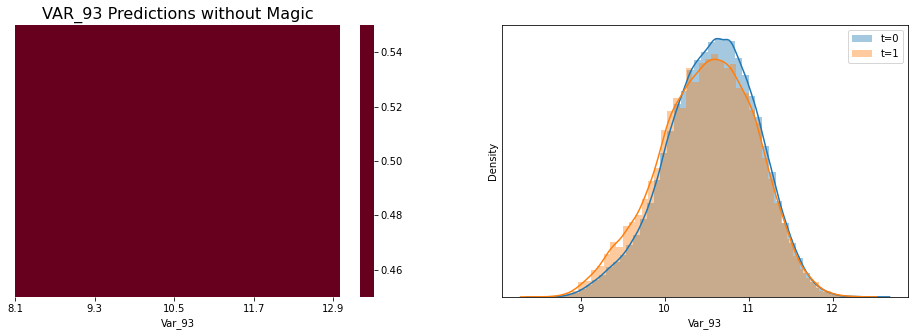

VAR_94 with magic val_auc = 0.50073


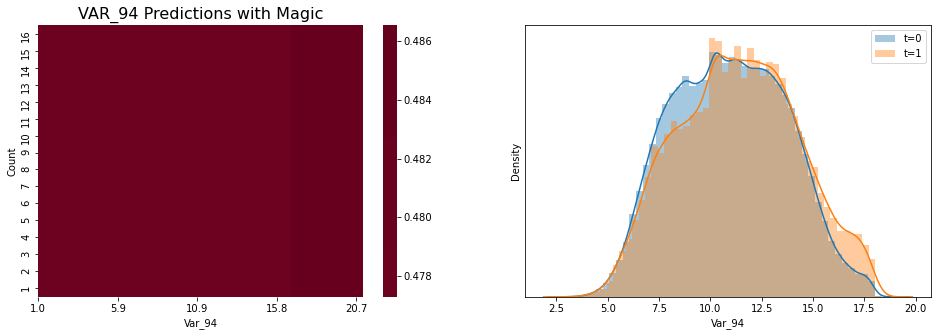

VAR_94 without magic val_auc = 0.50073


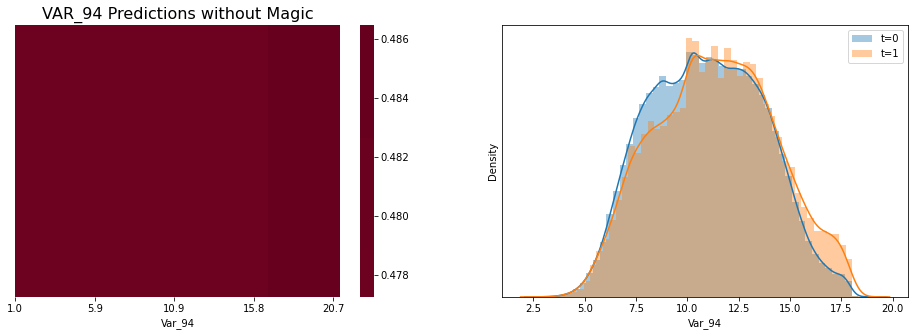

VAR_95 with magic val_auc = 0.5


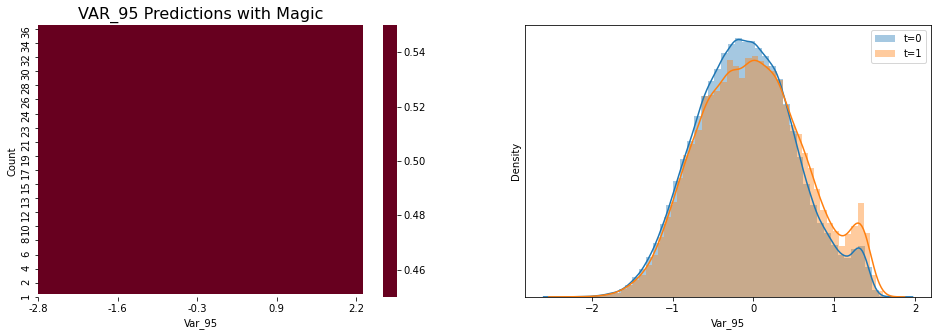

VAR_95 without magic val_auc = 0.5


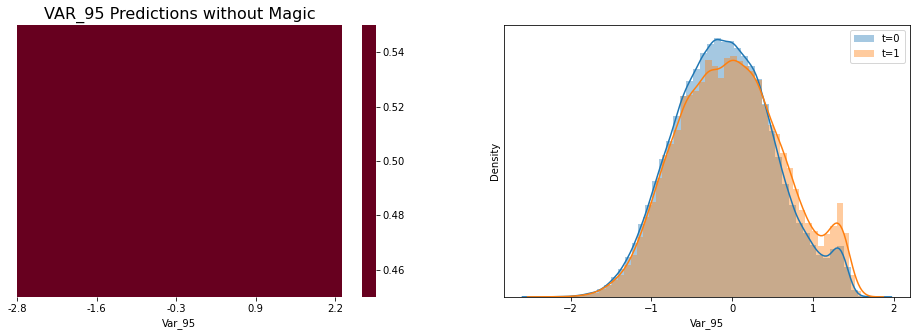

VAR_96 with magic val_auc = 0.5


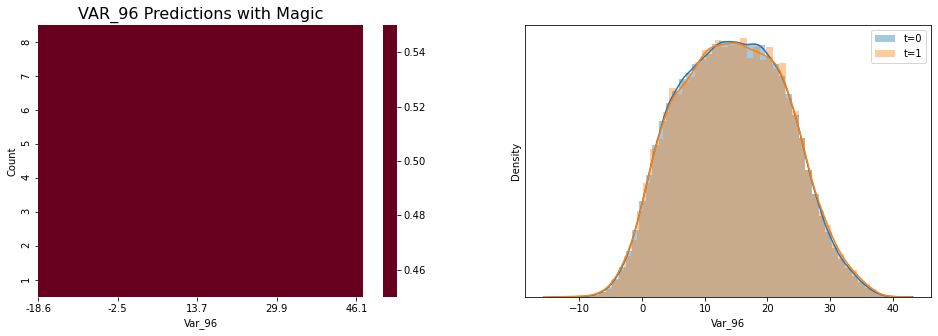

VAR_96 without magic val_auc = 0.5


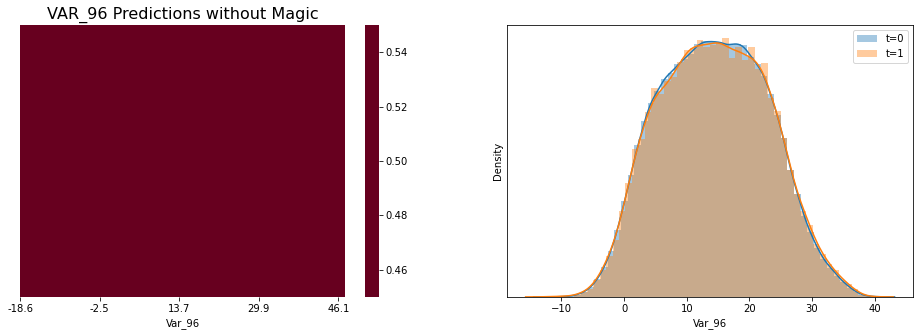

VAR_97 with magic val_auc = 0.5


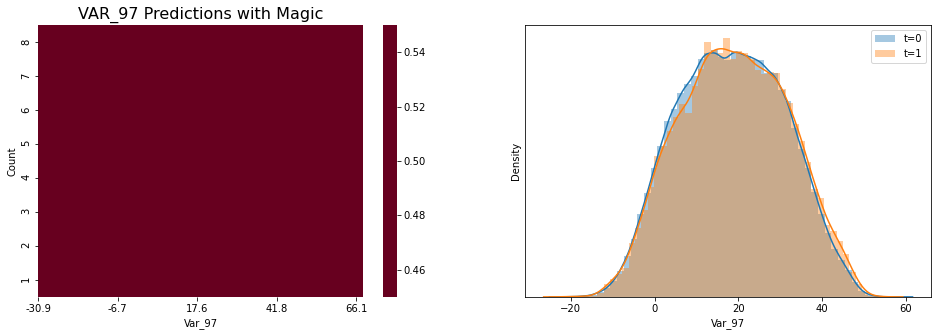

VAR_97 without magic val_auc = 0.5


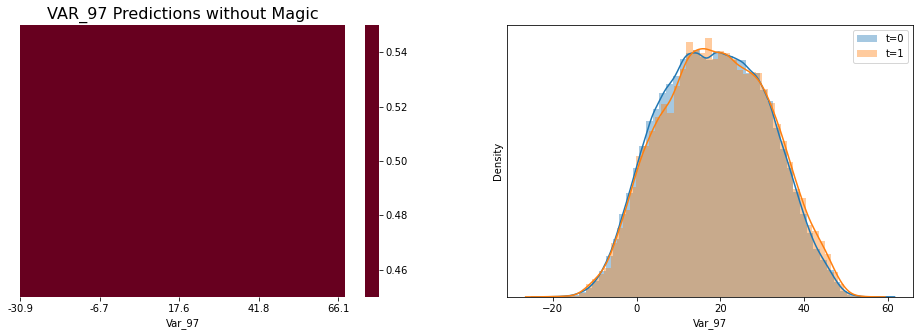

VAR_98 with magic val_auc = 0.5


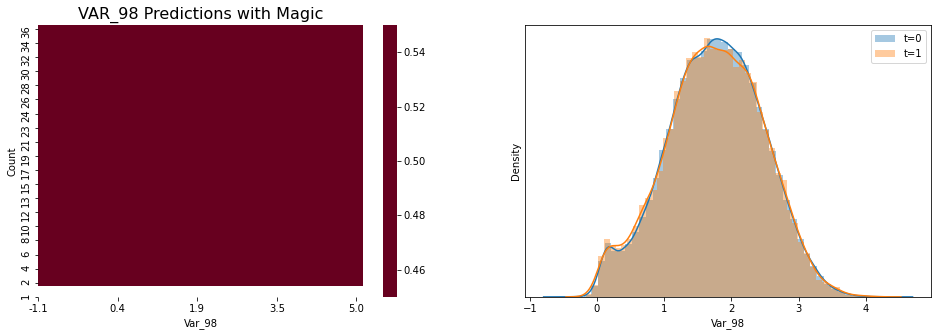

VAR_98 without magic val_auc = 0.5


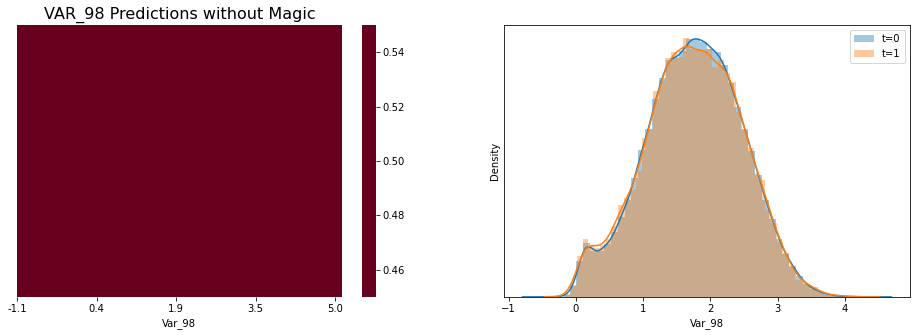

VAR_99 with magic val_auc = 0.52173


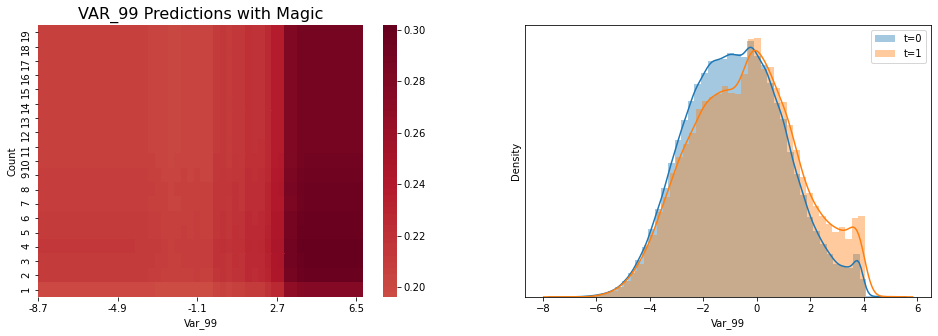

VAR_99 without magic val_auc = 0.52011


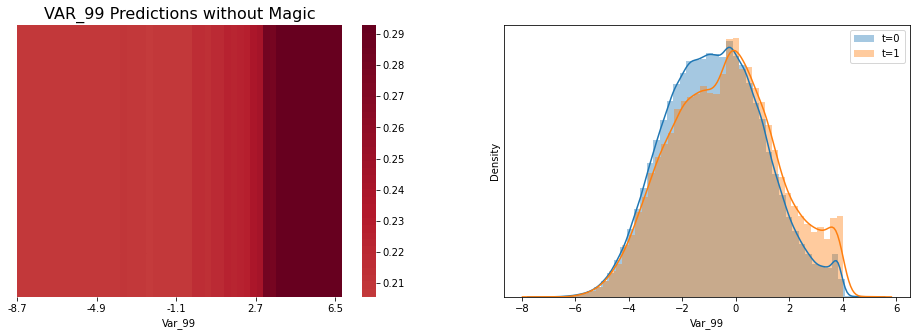

VAR_100 with magic val_auc = 0.5


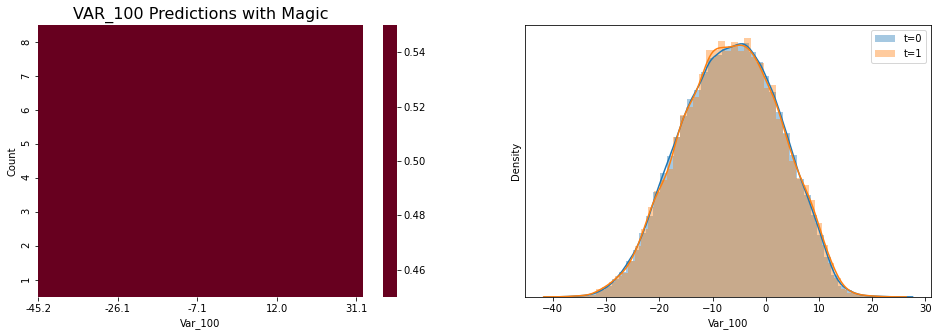

VAR_100 without magic val_auc = 0.5


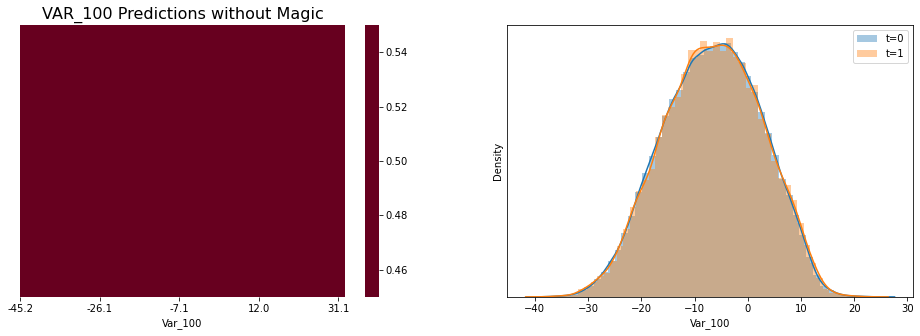

VAR_101 with magic val_auc = 0.5


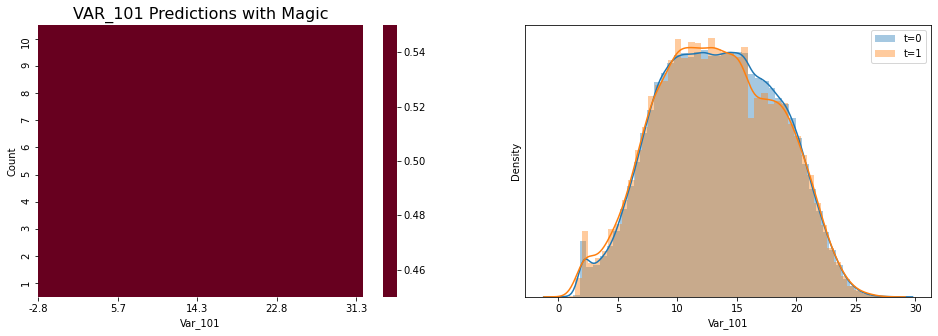

VAR_101 without magic val_auc = 0.5


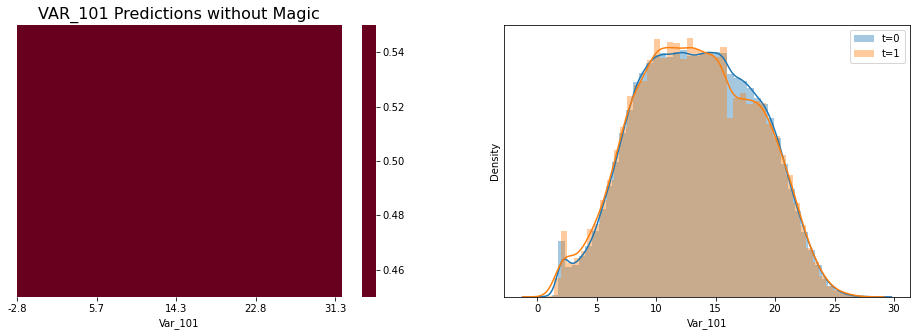

VAR_102 with magic val_auc = 0.5


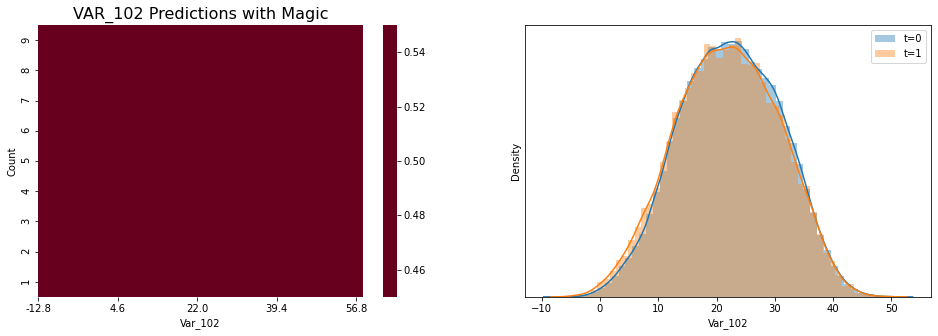

VAR_102 without magic val_auc = 0.5


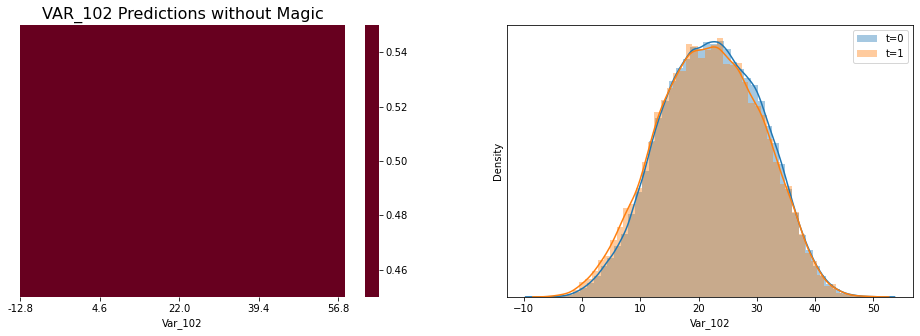

VAR_103 with magic val_auc = 0.5


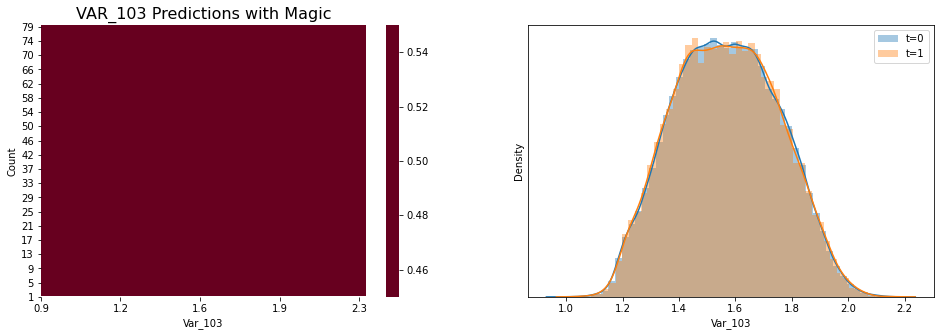

VAR_103 without magic val_auc = 0.5


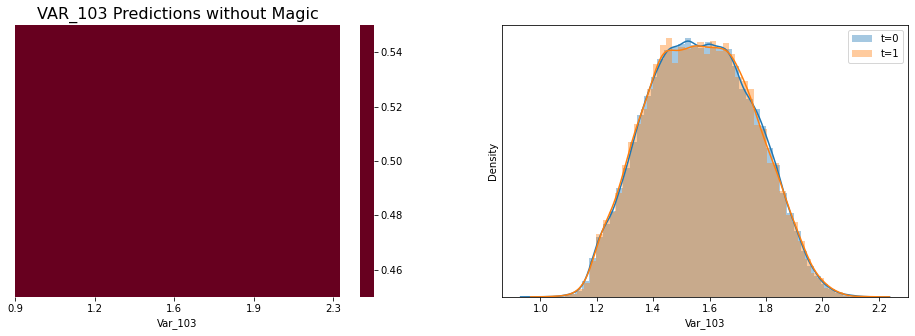

VAR_104 with magic val_auc = 0.5


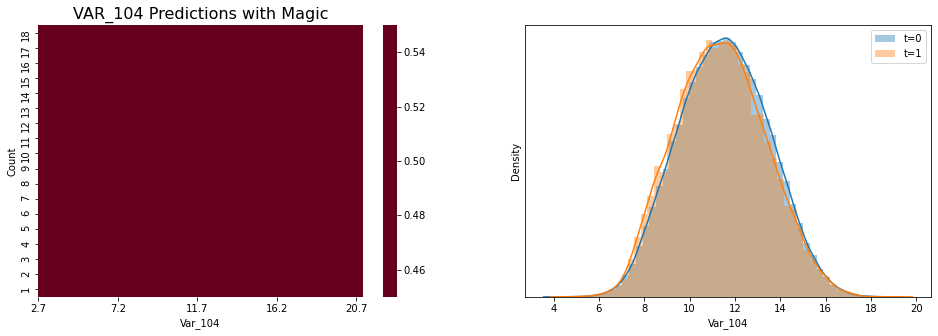

VAR_104 without magic val_auc = 0.5


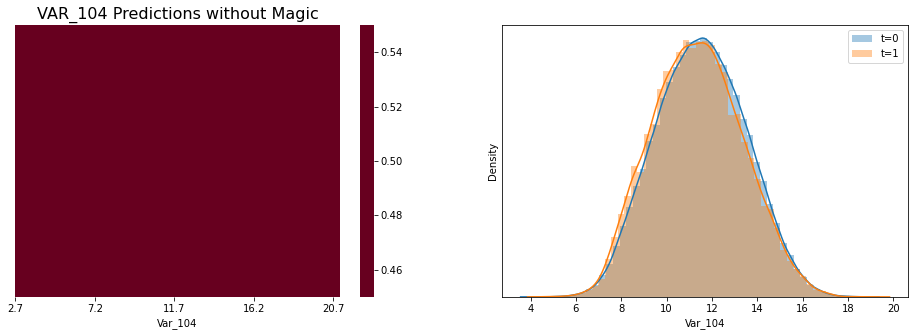

VAR_105 with magic val_auc = 0.5


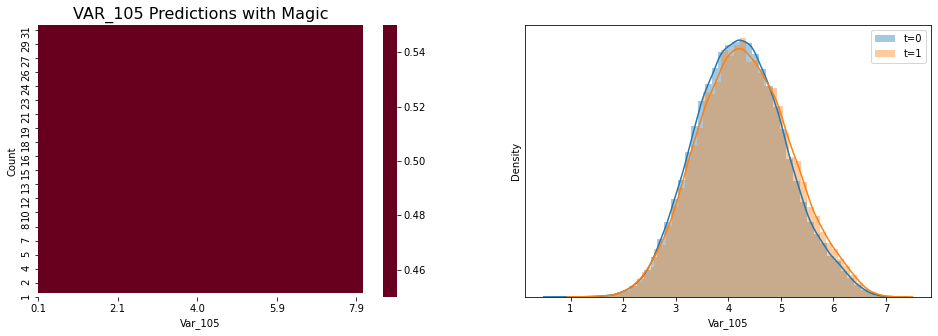

VAR_105 without magic val_auc = 0.5


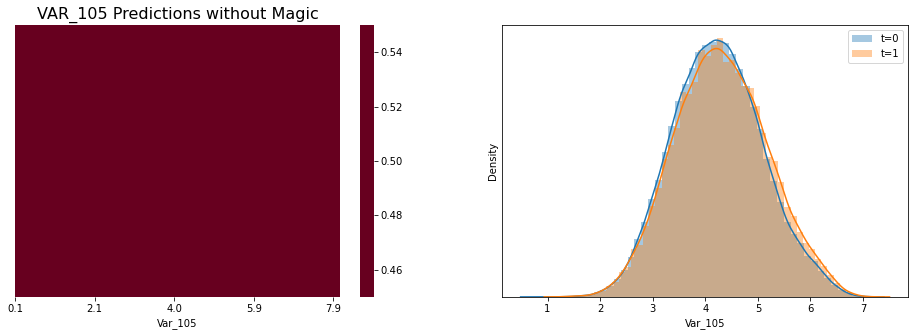

VAR_106 with magic val_auc = 0.5


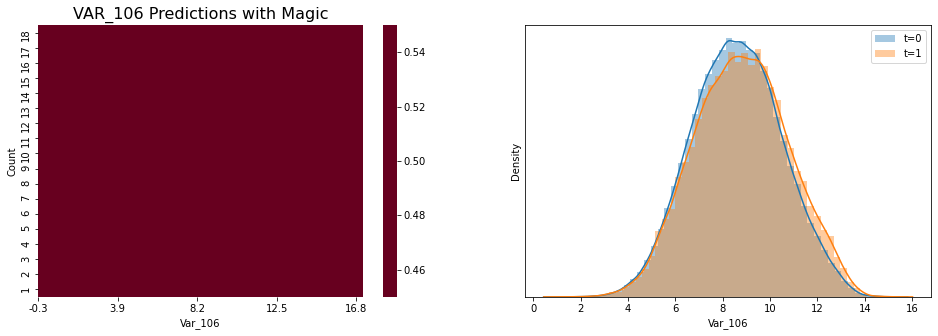

VAR_106 without magic val_auc = 0.5


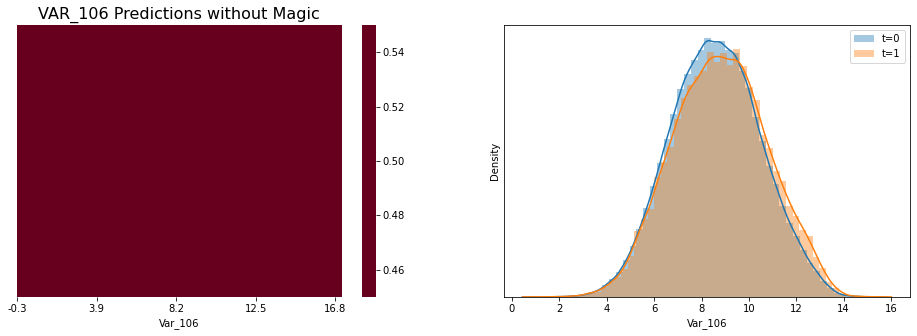

VAR_107 with magic val_auc = 0.5


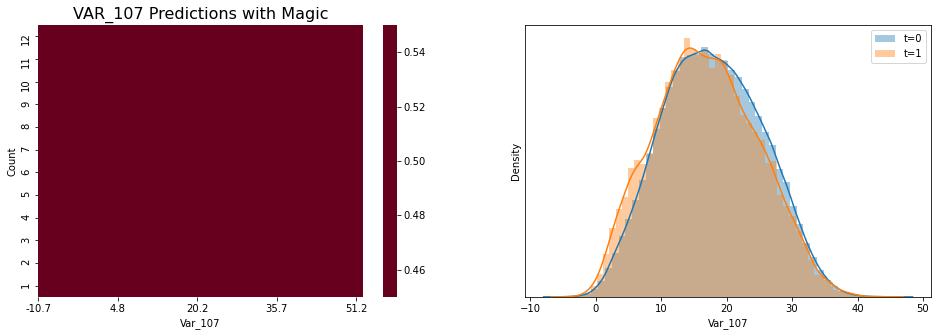

VAR_107 without magic val_auc = 0.5


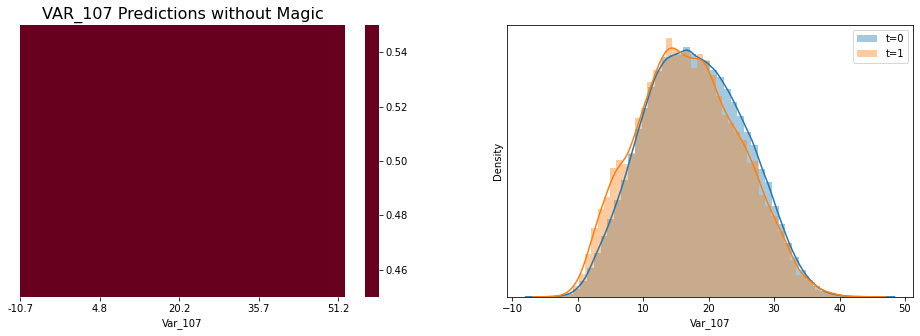

VAR_108 with magic val_auc = 0.49963


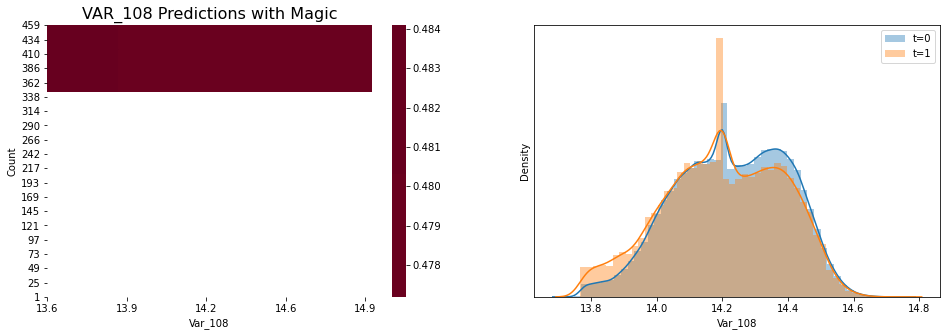

VAR_108 without magic val_auc = 0.49963


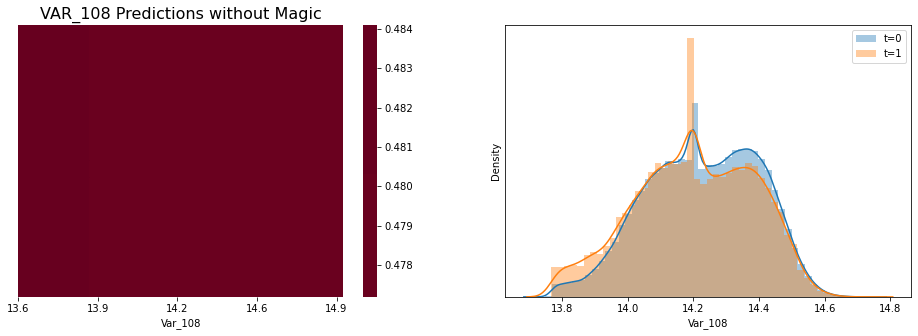

VAR_109 with magic val_auc = 0.54219


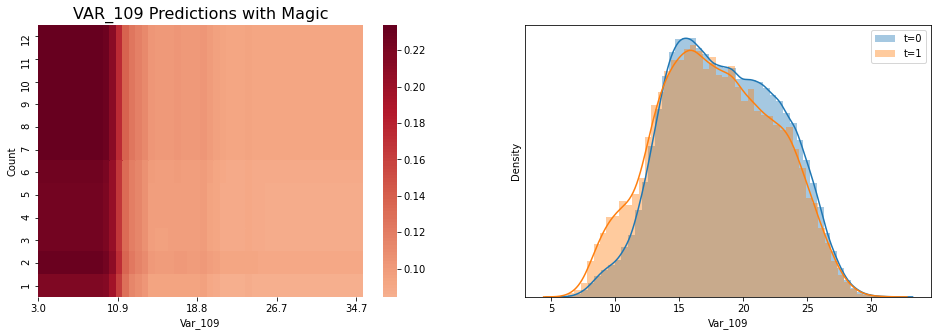

VAR_109 without magic val_auc = 0.53956


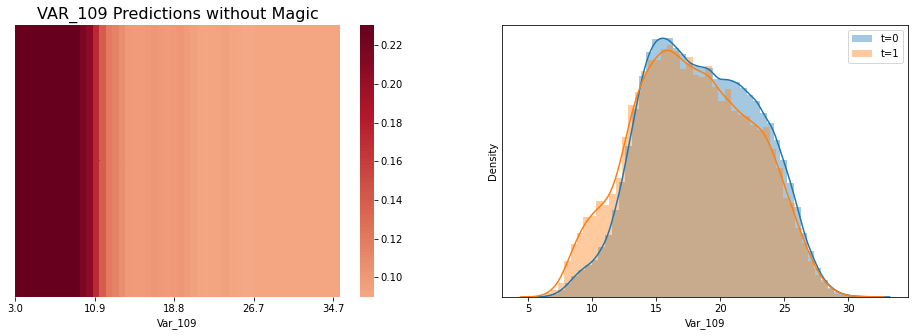

VAR_110 with magic val_auc = 0.5543


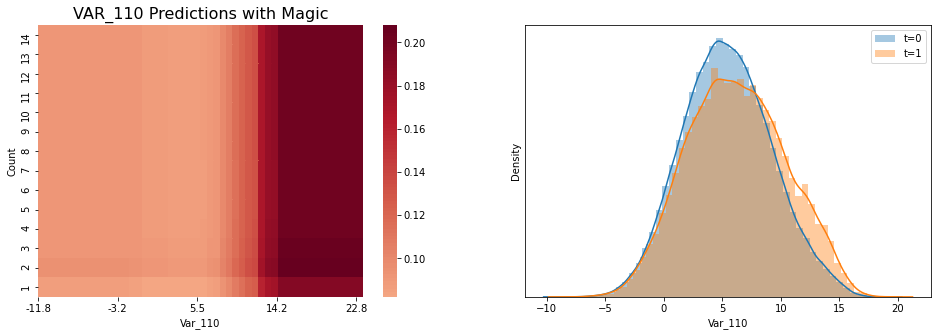

VAR_110 without magic val_auc = 0.55703


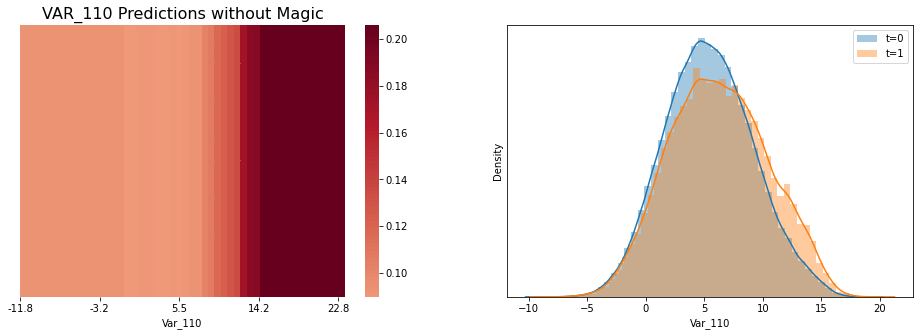

VAR_111 with magic val_auc = 0.5


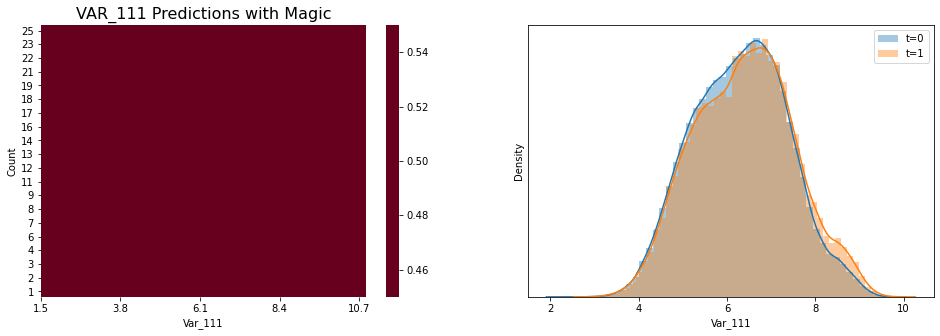

VAR_111 without magic val_auc = 0.5


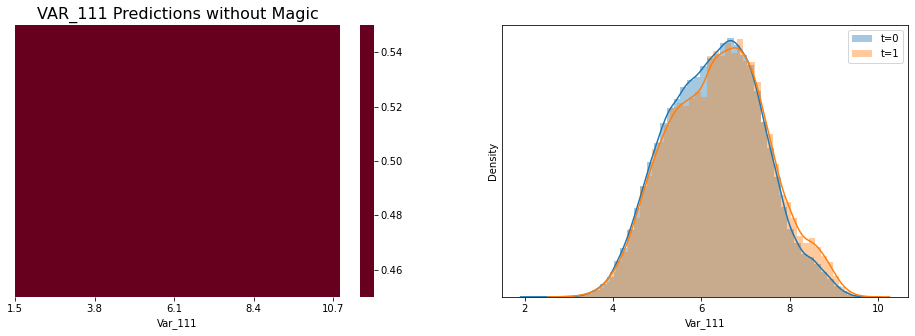

VAR_112 with magic val_auc = 0.5


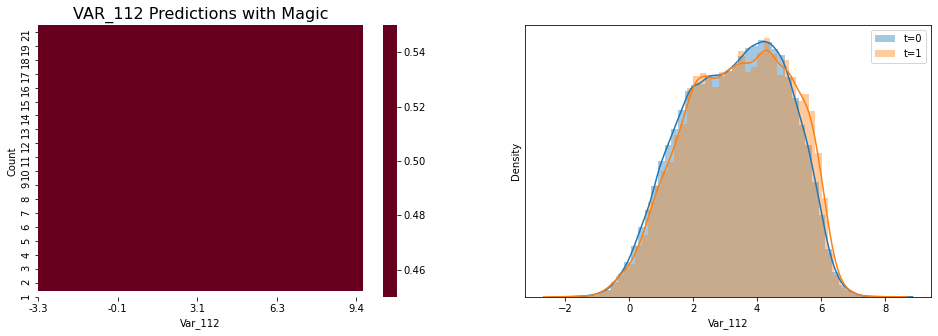

VAR_112 without magic val_auc = 0.5


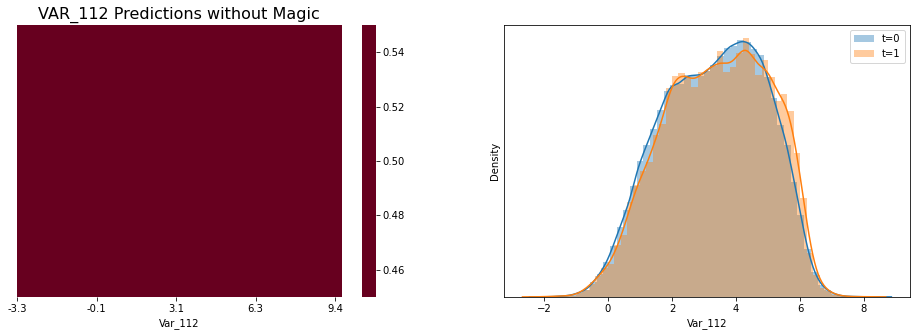

VAR_113 with magic val_auc = 0.5


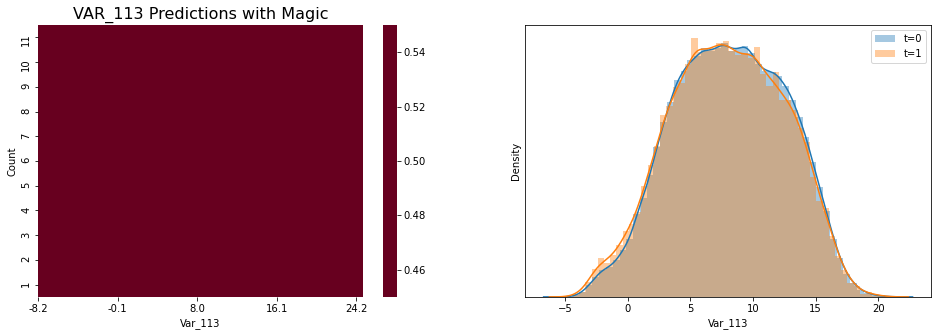

VAR_113 without magic val_auc = 0.5


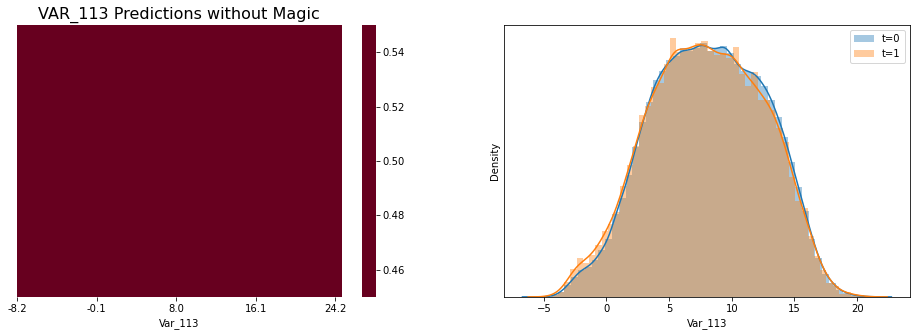

VAR_114 with magic val_auc = 0.5


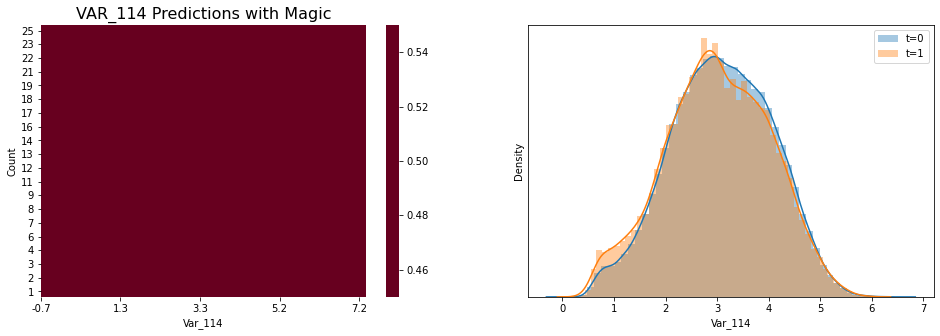

VAR_114 without magic val_auc = 0.5


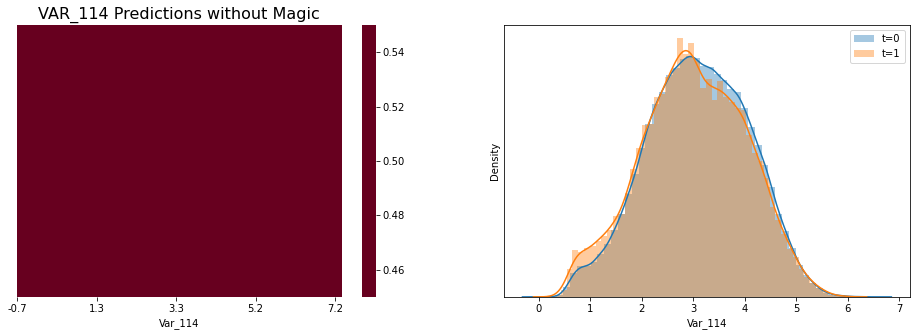

VAR_115 with magic val_auc = 0.5


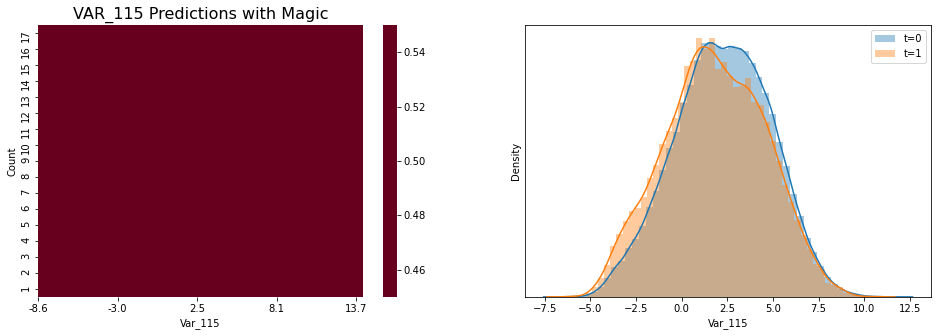

VAR_115 without magic val_auc = 0.5


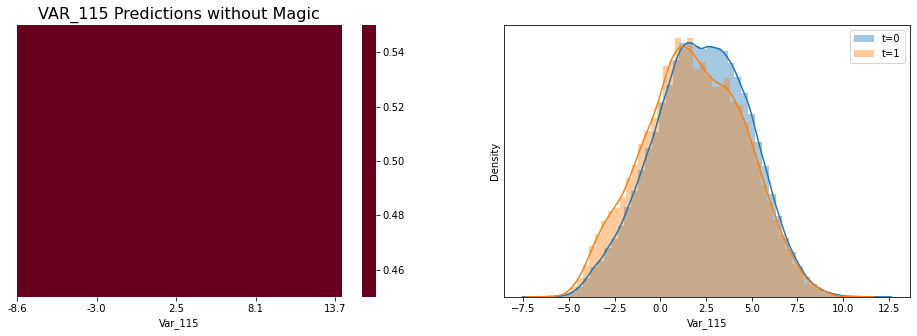

VAR_116 with magic val_auc = 0.5


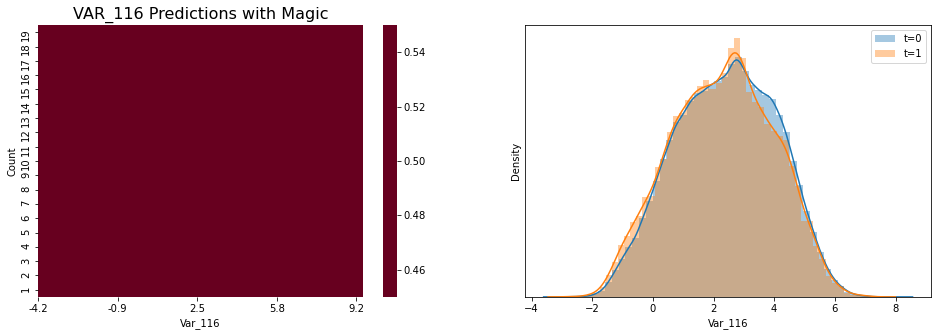

VAR_116 without magic val_auc = 0.5


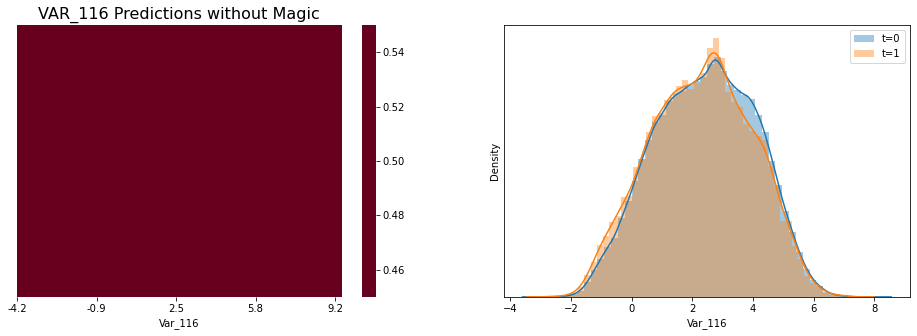

VAR_117 with magic val_auc = 0.5


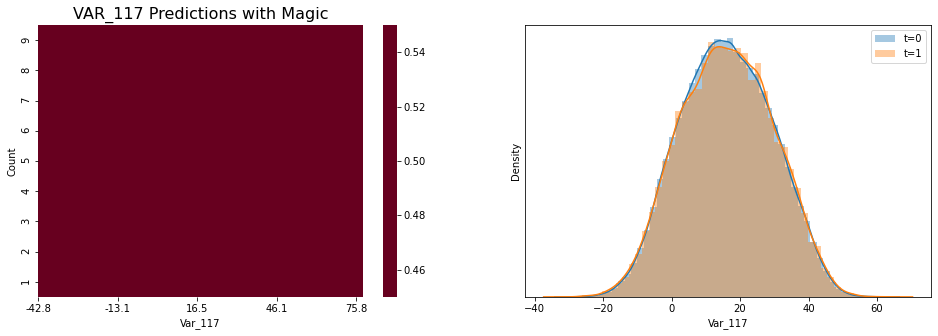

VAR_117 without magic val_auc = 0.5


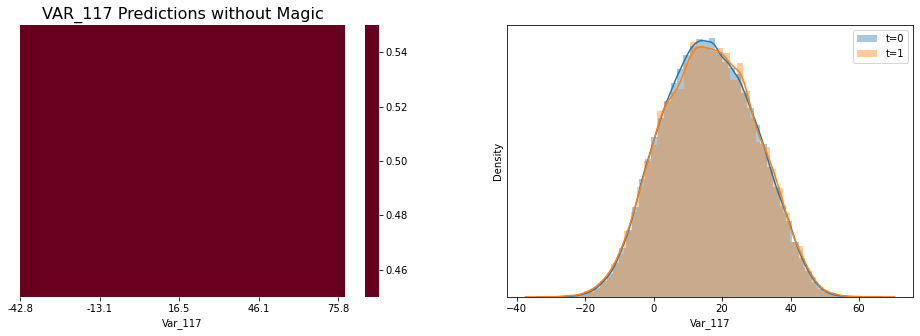

VAR_118 with magic val_auc = 0.5


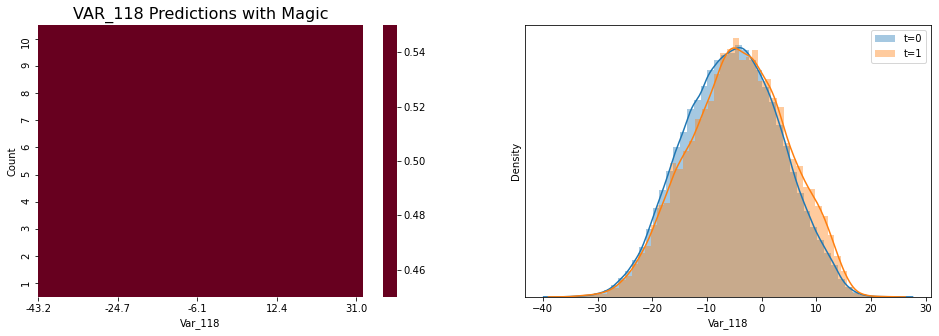

VAR_118 without magic val_auc = 0.5


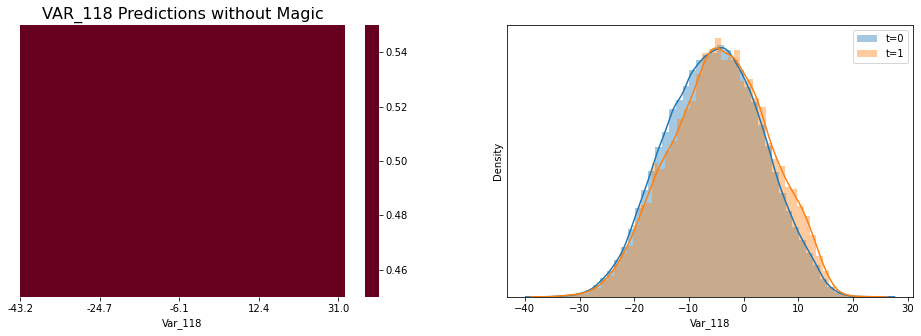

VAR_119 with magic val_auc = 0.5


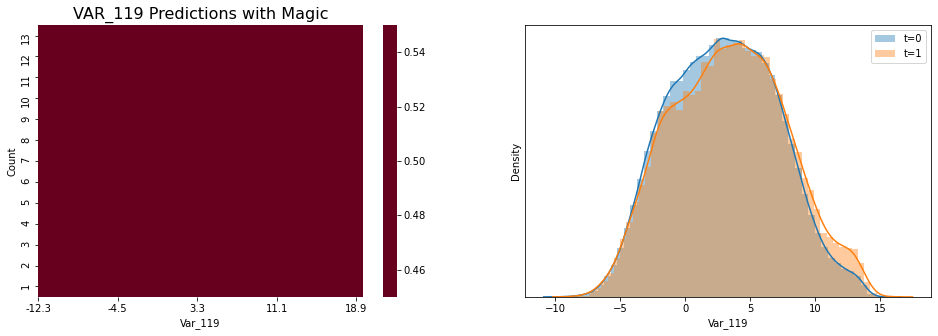

VAR_119 without magic val_auc = 0.5


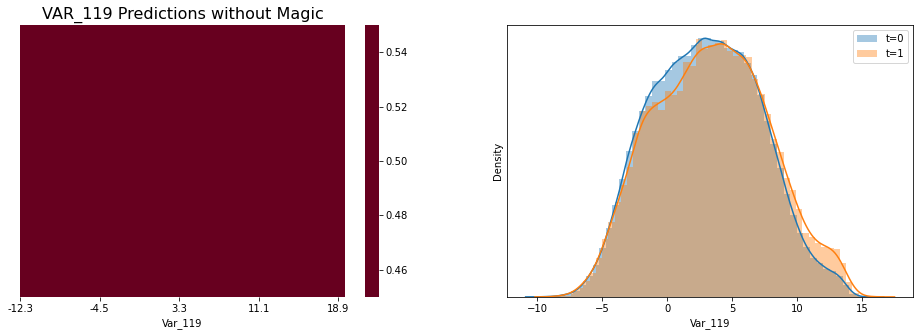

VAR_120 with magic val_auc = 0.5


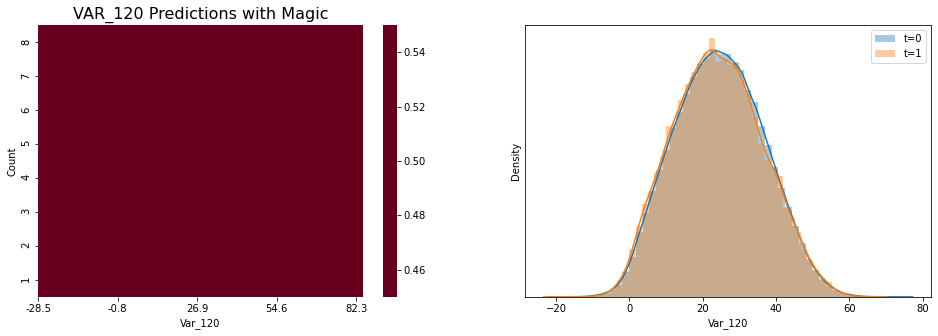

VAR_120 without magic val_auc = 0.5


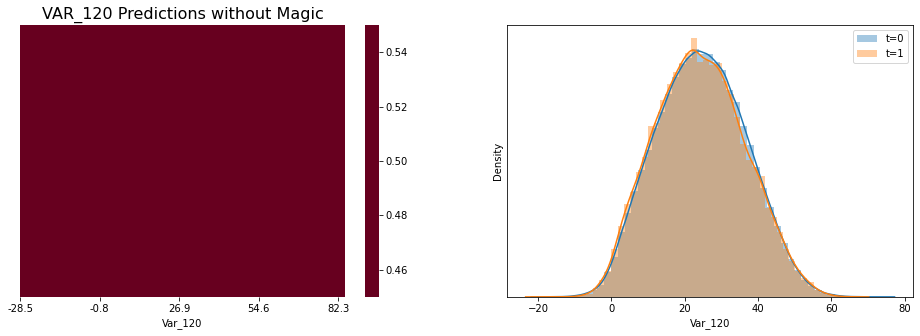

VAR_121 with magic val_auc = 0.5


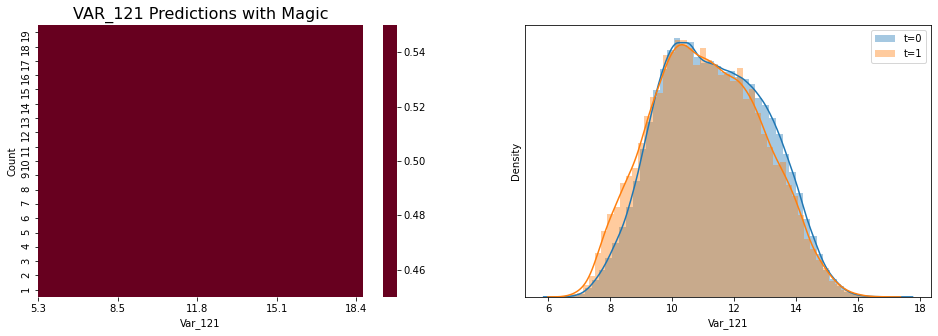

VAR_121 without magic val_auc = 0.5


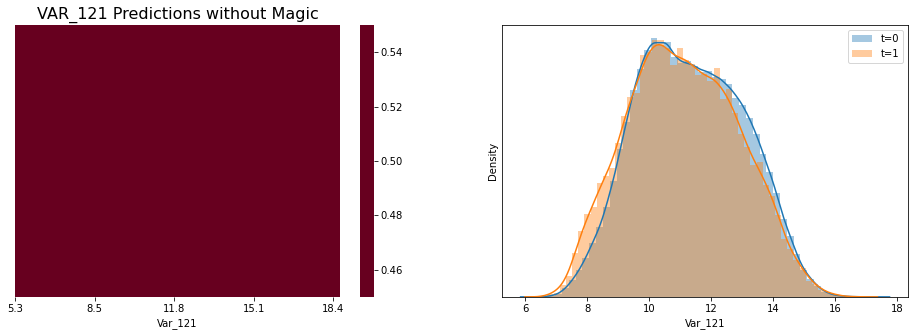

VAR_122 with magic val_auc = 0.5


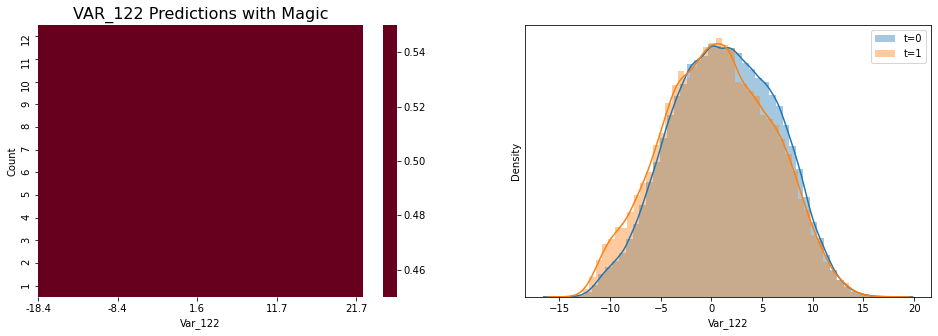

VAR_122 without magic val_auc = 0.5


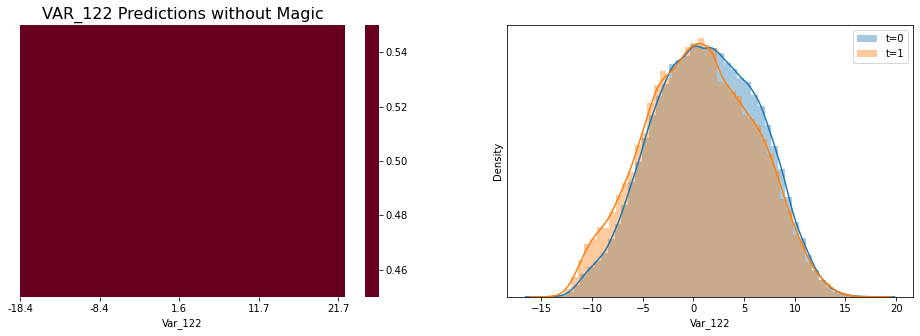

VAR_123 with magic val_auc = 0.5


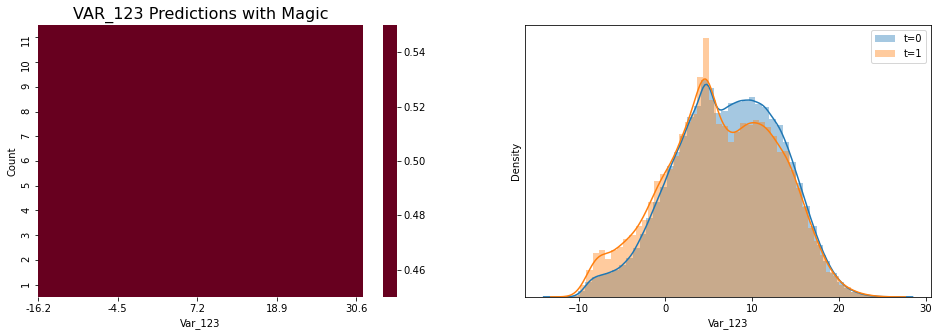

VAR_123 without magic val_auc = 0.5


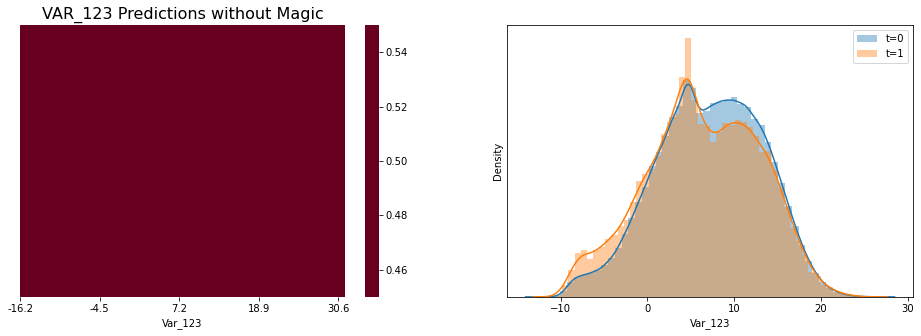

VAR_124 with magic val_auc = 0.5


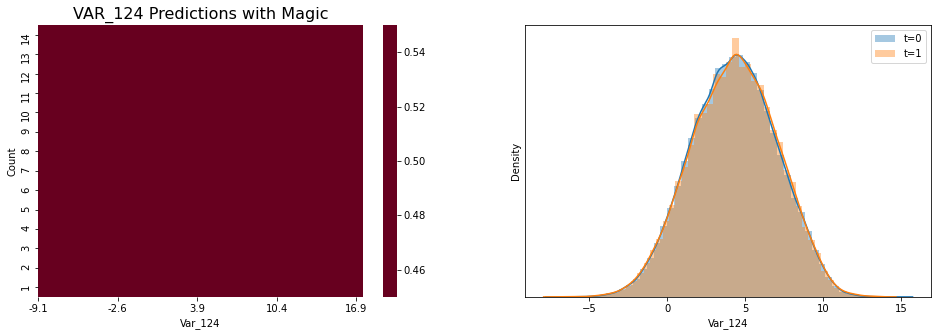

VAR_124 without magic val_auc = 0.5


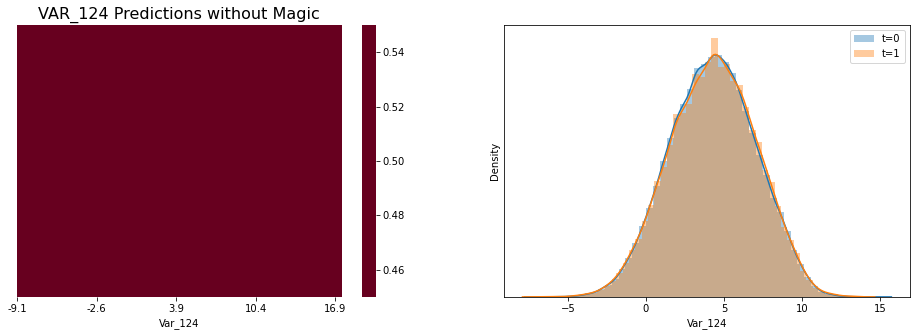

VAR_125 with magic val_auc = 0.5


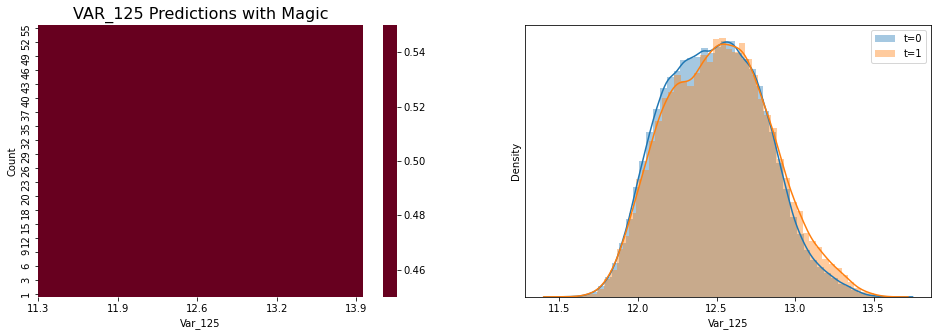

VAR_125 without magic val_auc = 0.5


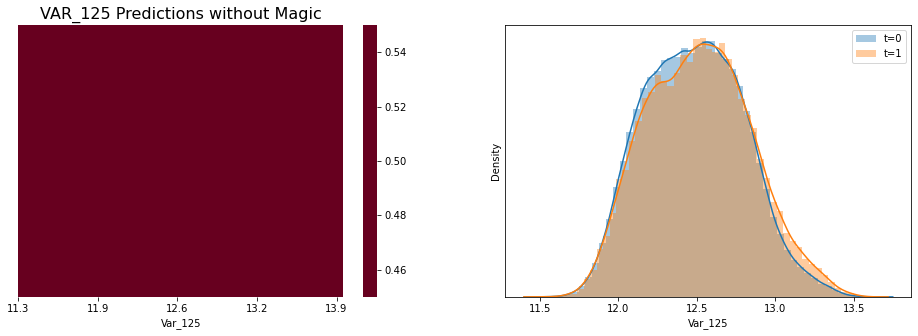

VAR_126 with magic val_auc = 0.5


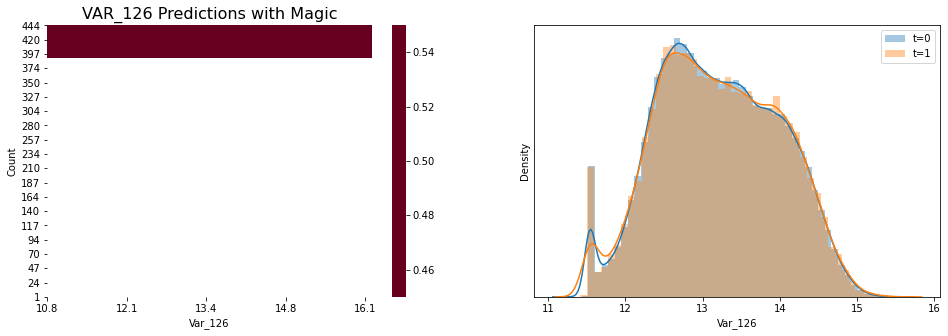

VAR_126 without magic val_auc = 0.5


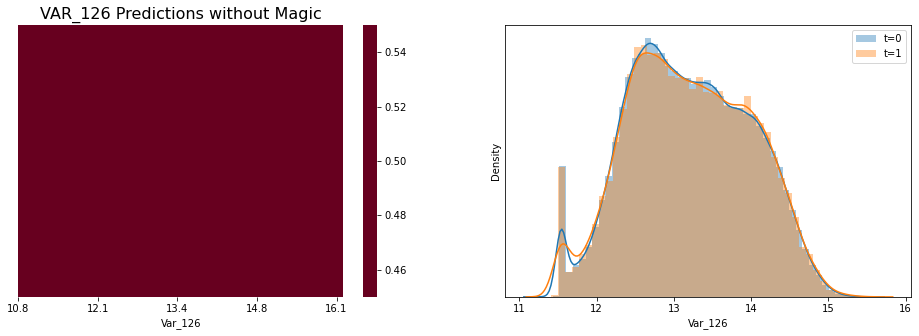

VAR_127 with magic val_auc = 0.5


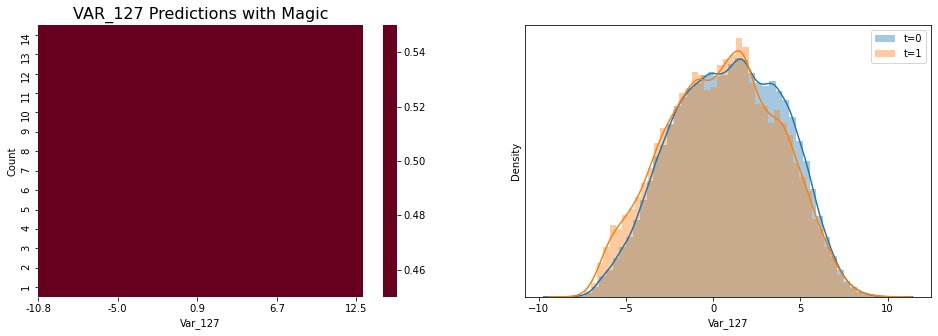

VAR_127 without magic val_auc = 0.5


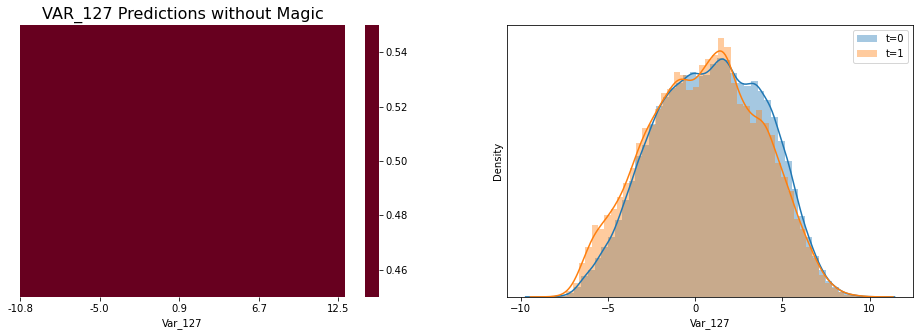

VAR_128 with magic val_auc = 0.5


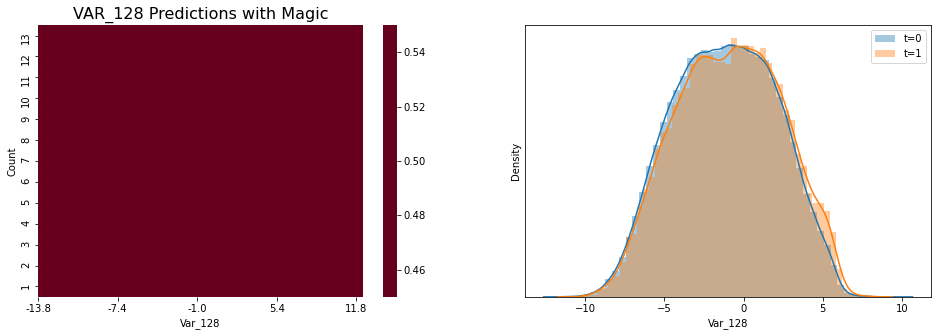

VAR_128 without magic val_auc = 0.5


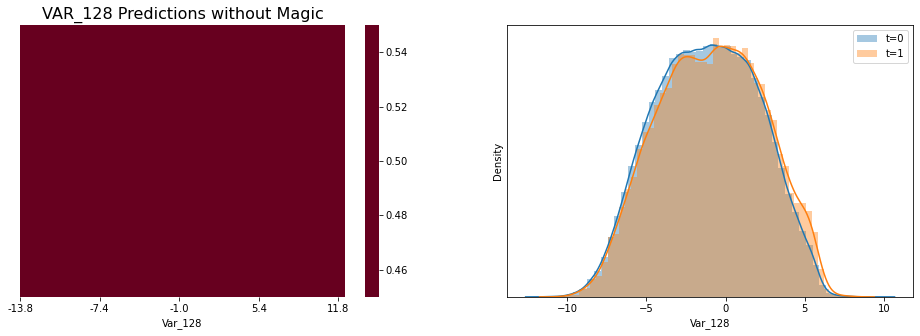

VAR_129 with magic val_auc = 0.5


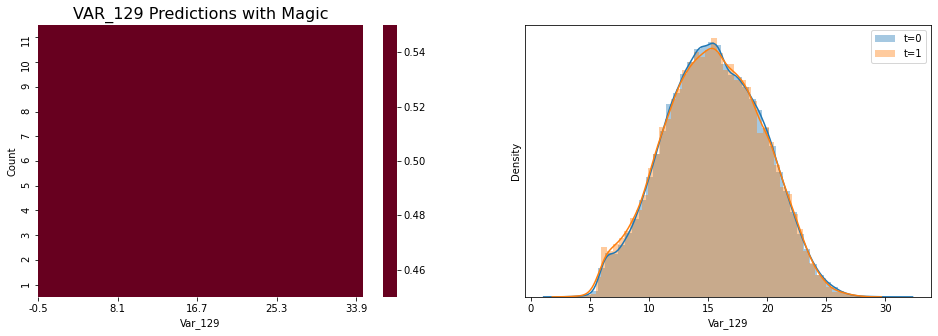

VAR_129 without magic val_auc = 0.5


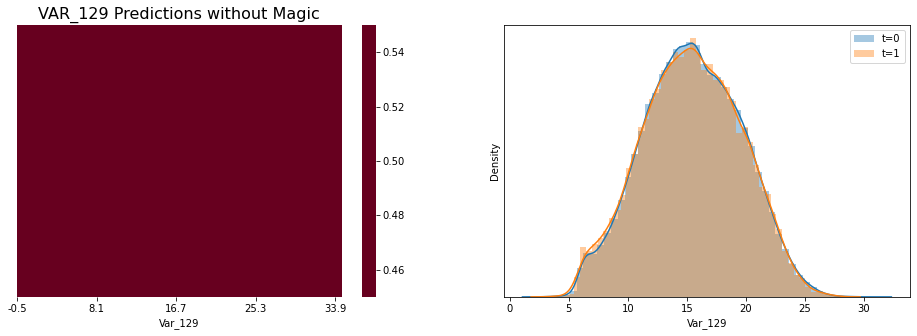

VAR_130 with magic val_auc = 0.5


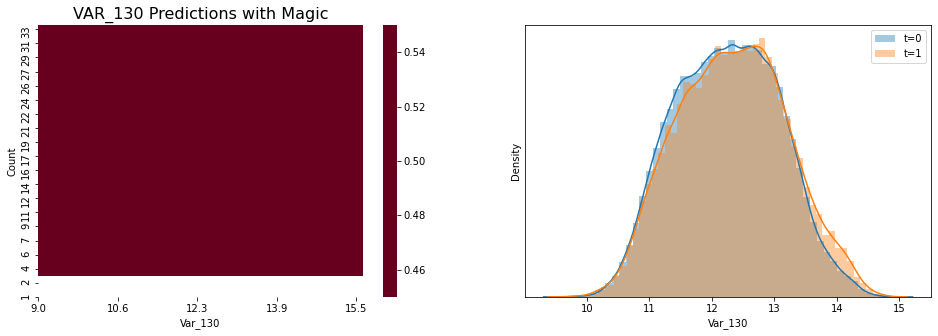

VAR_130 without magic val_auc = 0.5


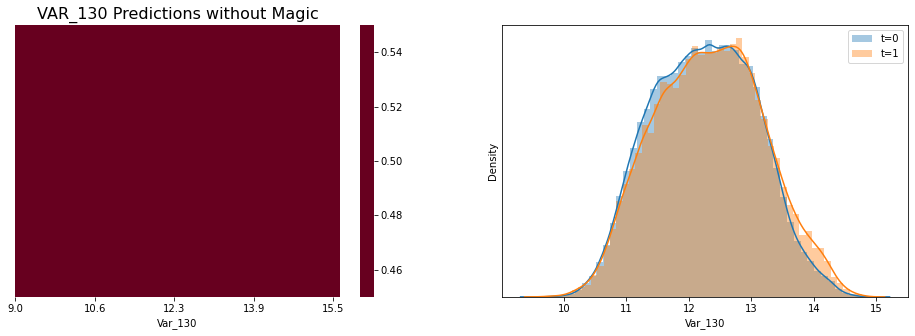

VAR_131 with magic val_auc = 0.5


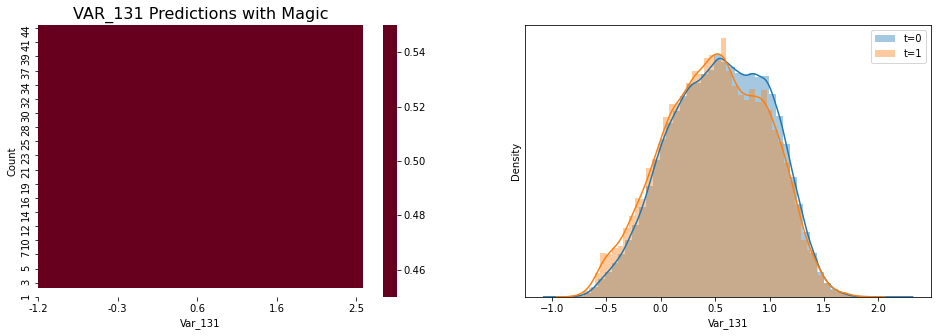

VAR_131 without magic val_auc = 0.5


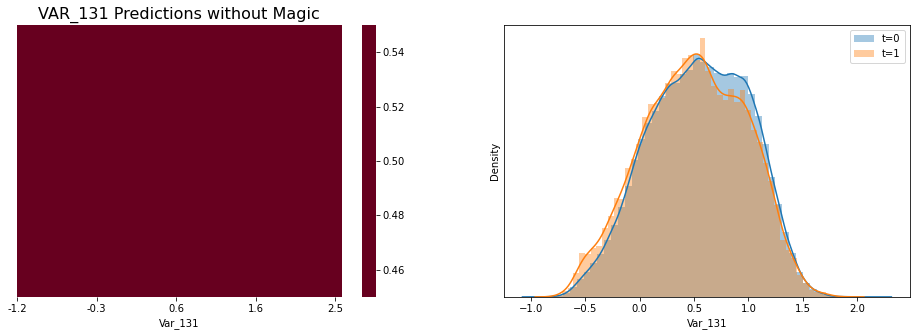

VAR_132 with magic val_auc = 0.5


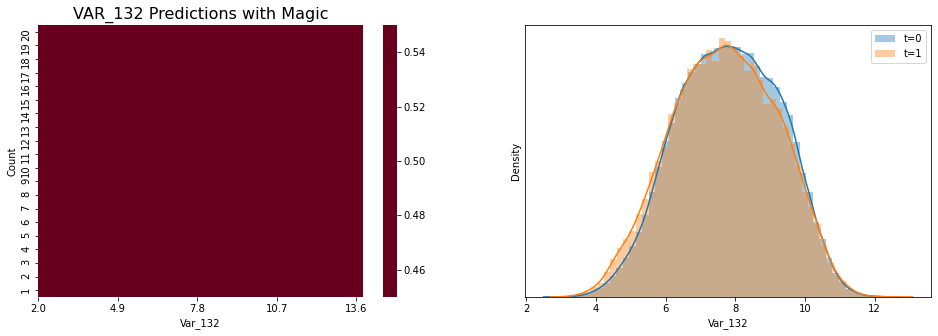

VAR_132 without magic val_auc = 0.5


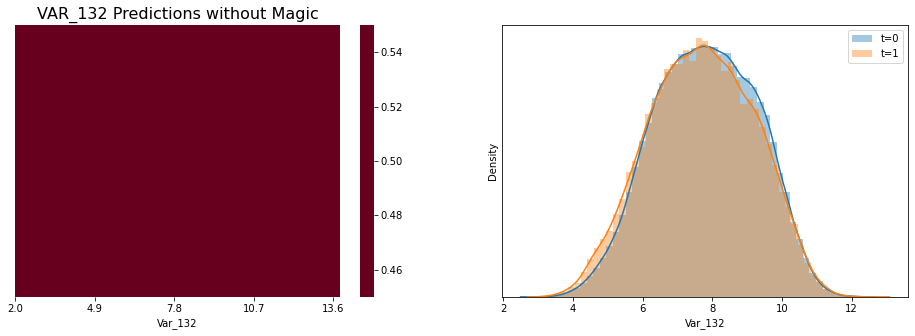

VAR_133 with magic val_auc = 0.5


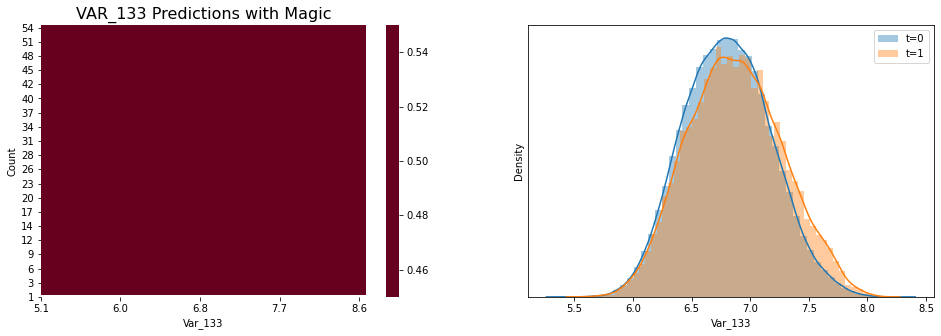

VAR_133 without magic val_auc = 0.5


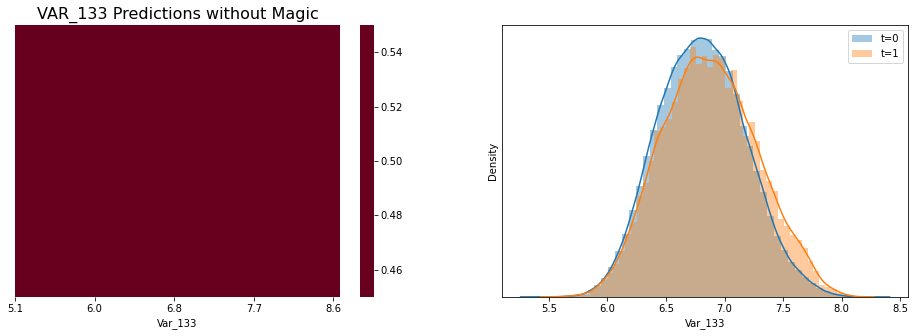

VAR_134 with magic val_auc = 0.5


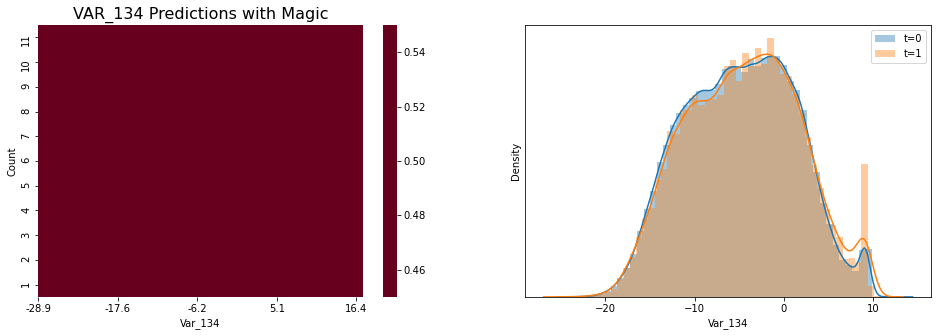

VAR_134 without magic val_auc = 0.5


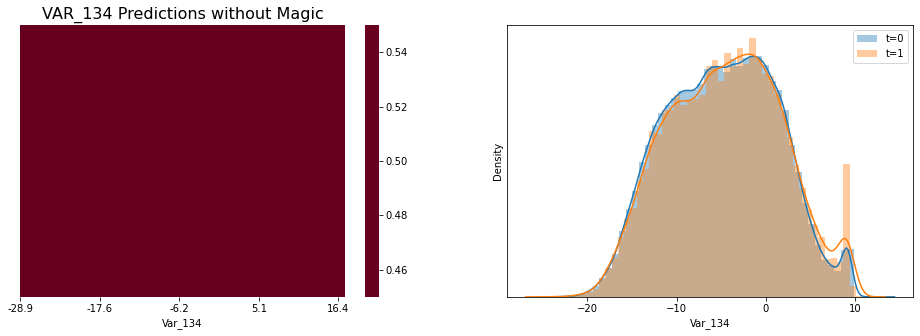

VAR_135 with magic val_auc = 0.5


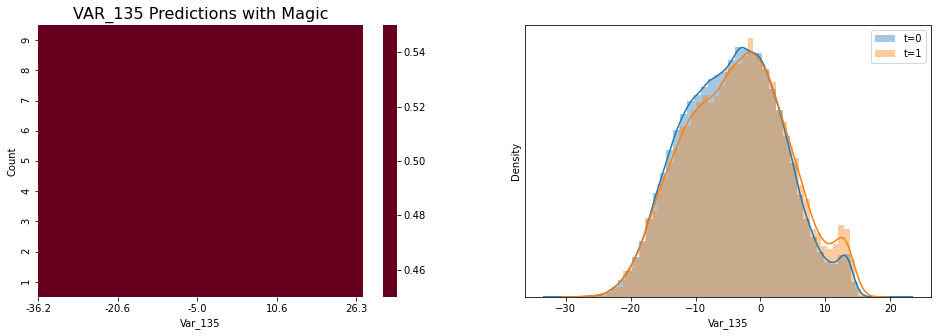

VAR_135 without magic val_auc = 0.5


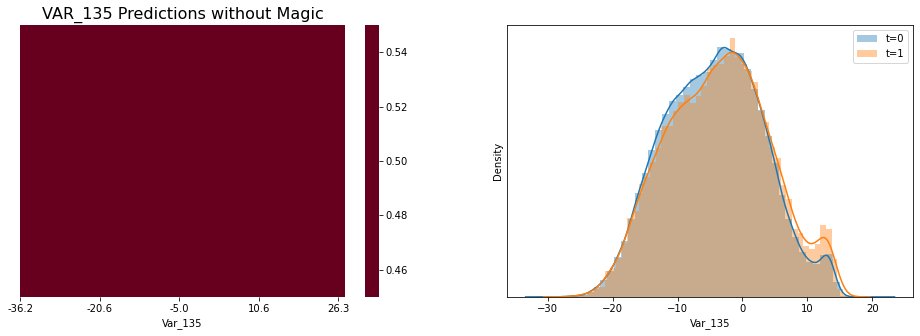

VAR_136 with magic val_auc = 0.5


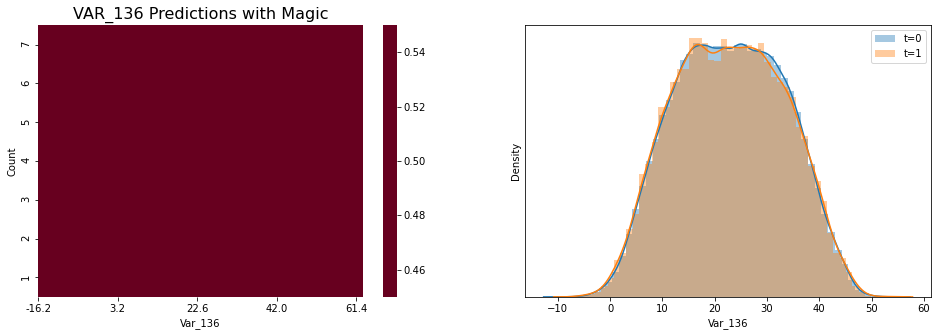

VAR_136 without magic val_auc = 0.5


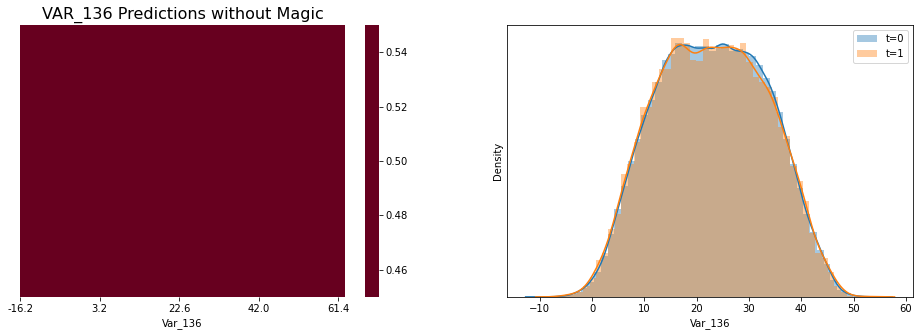

VAR_137 with magic val_auc = 0.5


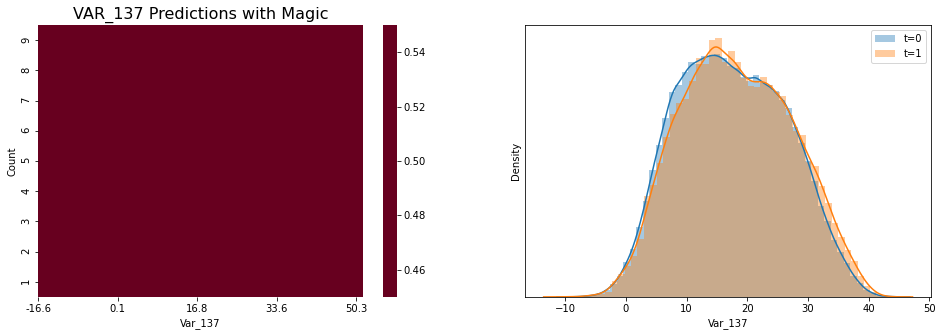

VAR_137 without magic val_auc = 0.5


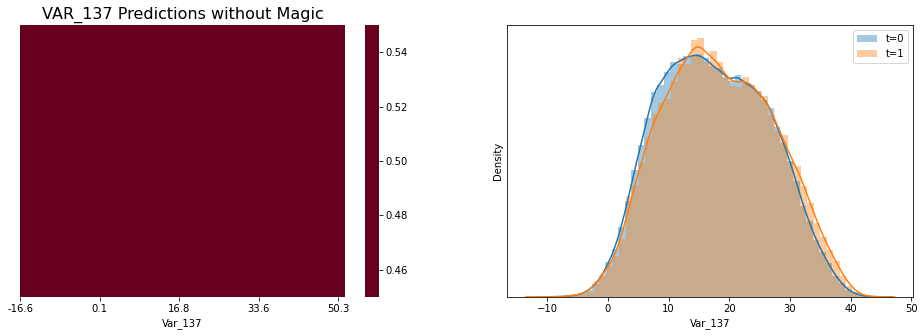

VAR_138 with magic val_auc = 0.5


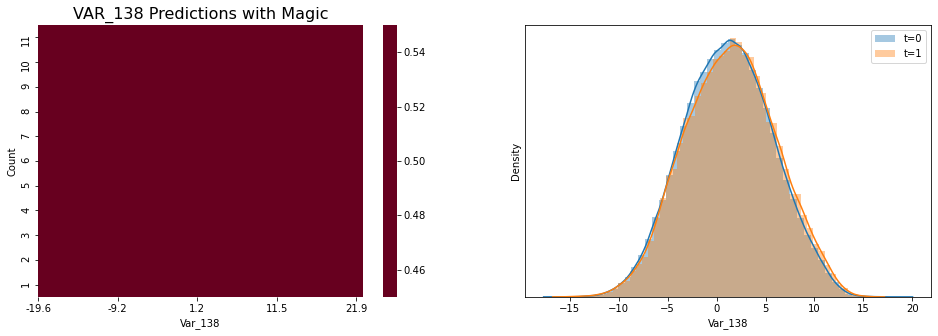

VAR_138 without magic val_auc = 0.5


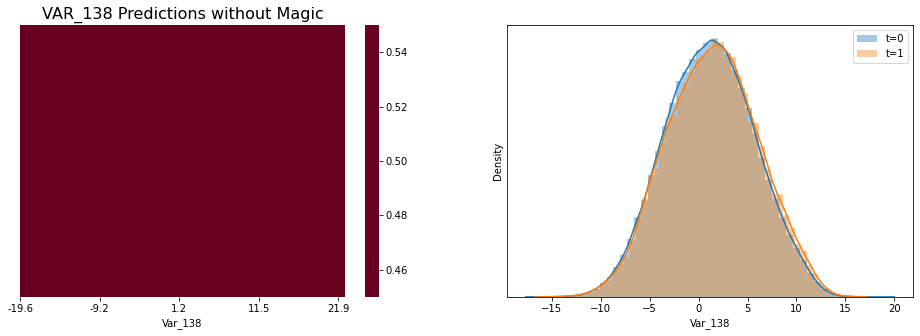

VAR_139 with magic val_auc = 0.56457


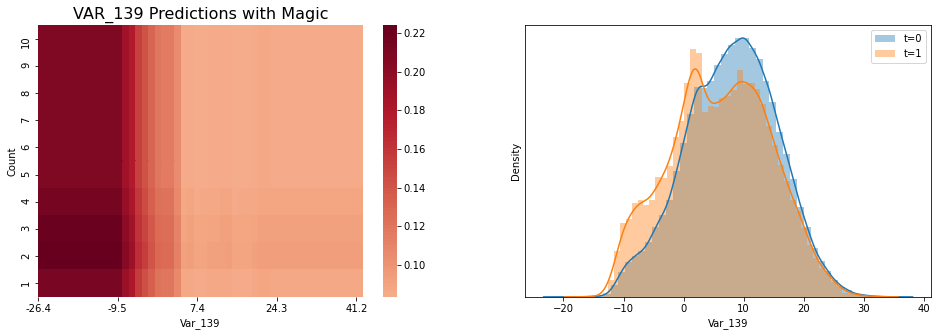

VAR_139 without magic val_auc = 0.56495


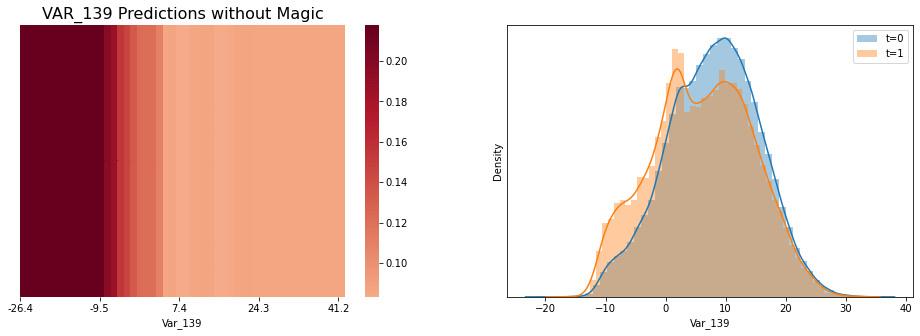

VAR_140 with magic val_auc = 0.5


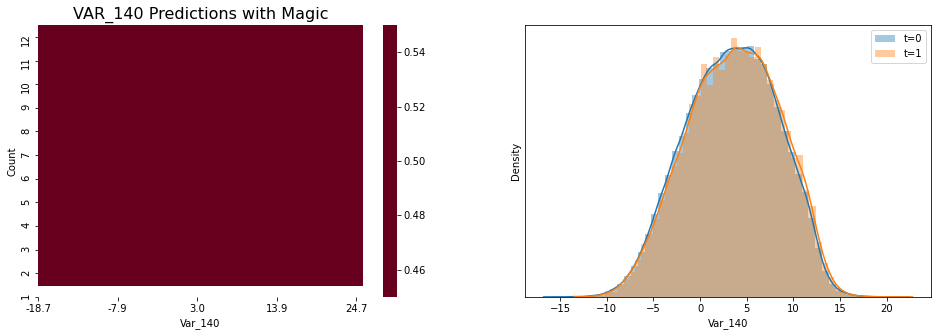

VAR_140 without magic val_auc = 0.5


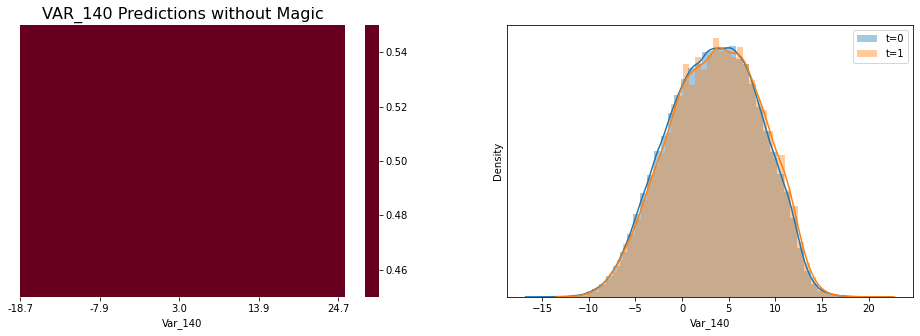

VAR_141 with magic val_auc = 0.5


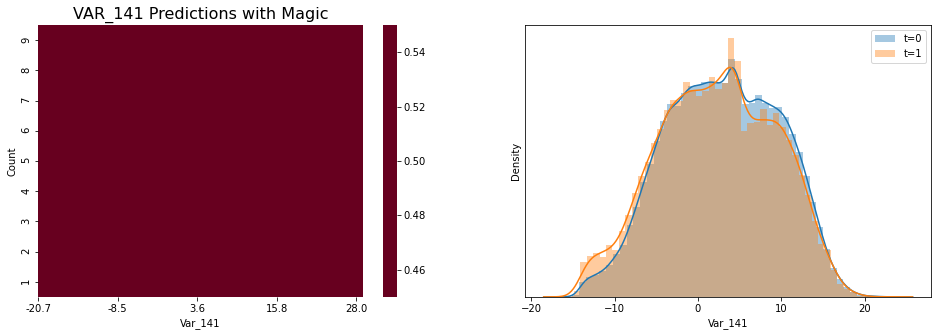

VAR_141 without magic val_auc = 0.5


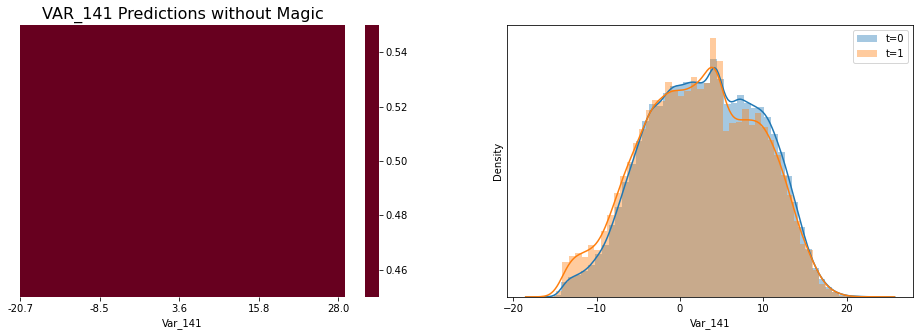

VAR_142 with magic val_auc = 0.5


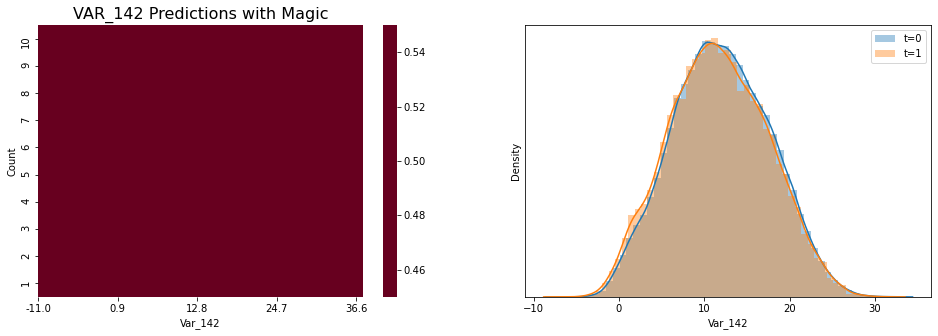

VAR_142 without magic val_auc = 0.5


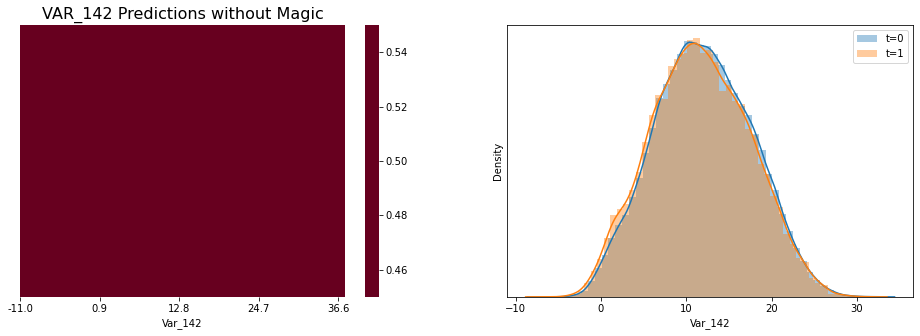

VAR_143 with magic val_auc = 0.5


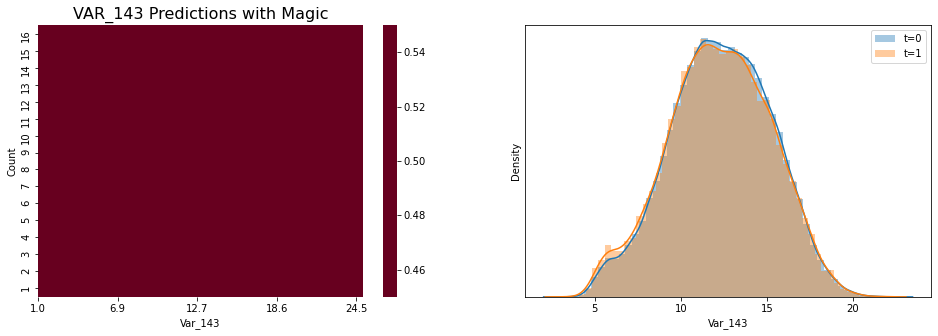

VAR_143 without magic val_auc = 0.5


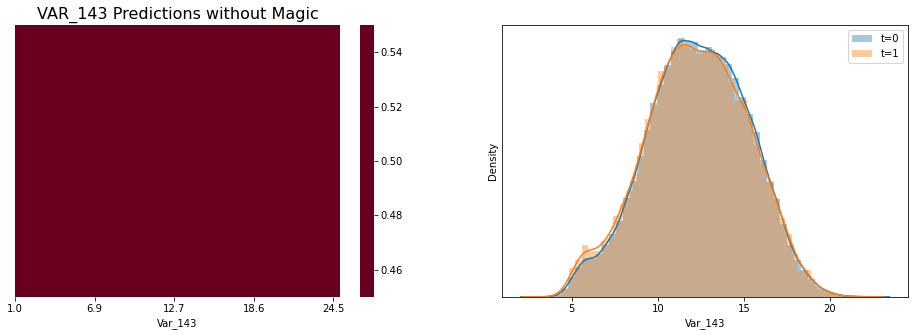

VAR_144 with magic val_auc = 0.5


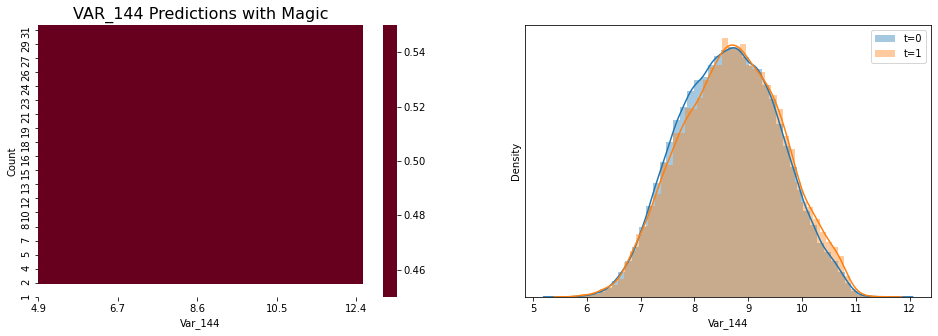

VAR_144 without magic val_auc = 0.5


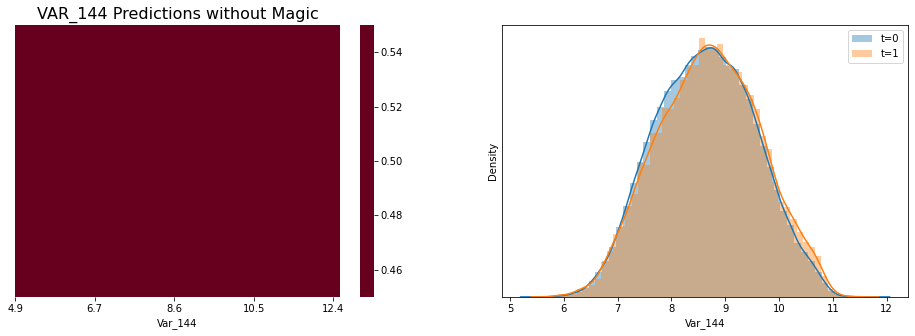

VAR_145 with magic val_auc = 0.5


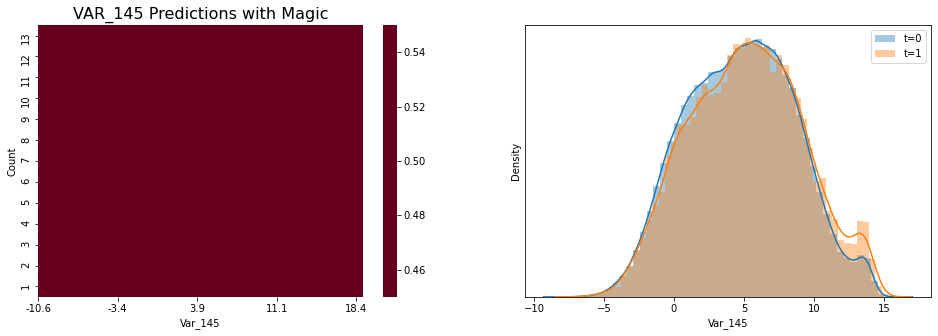

VAR_145 without magic val_auc = 0.5


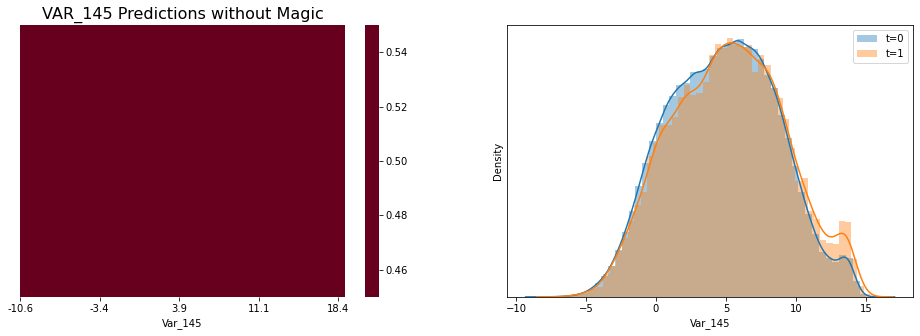

VAR_146 with magic val_auc = 0.55348


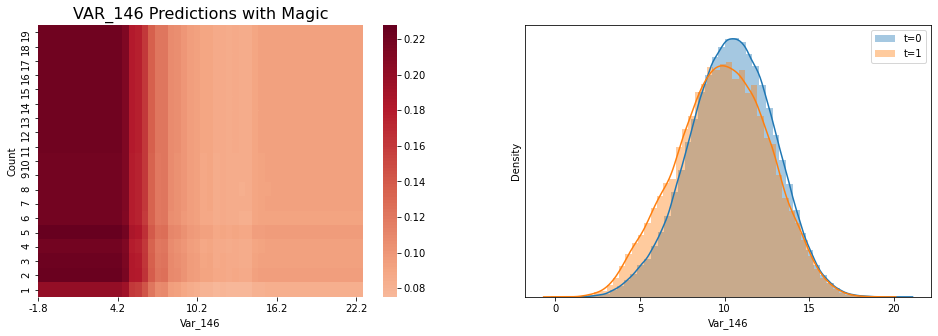

VAR_146 without magic val_auc = 0.55549


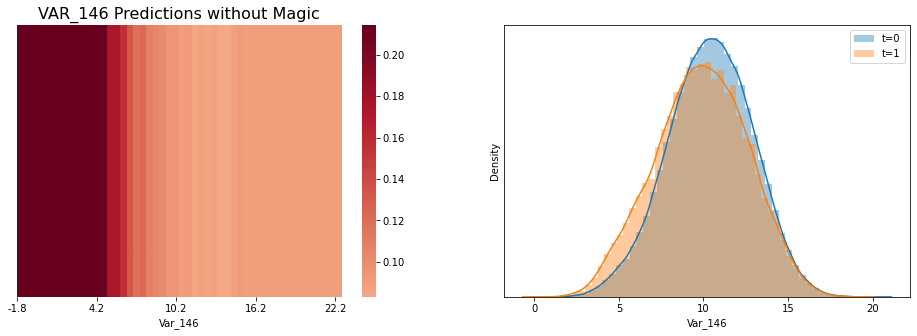

VAR_147 with magic val_auc = 0.5


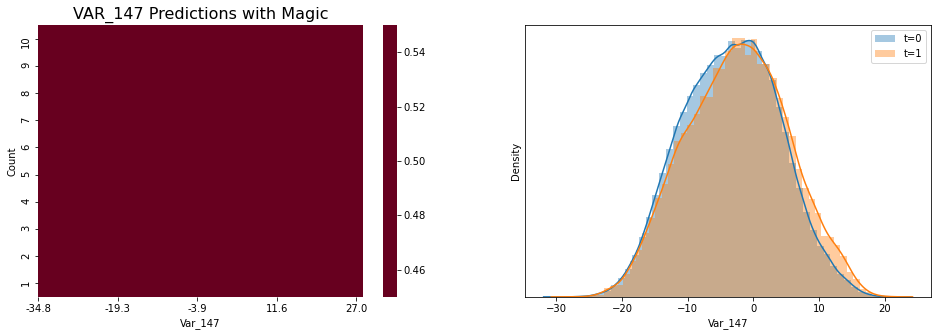

VAR_147 without magic val_auc = 0.5


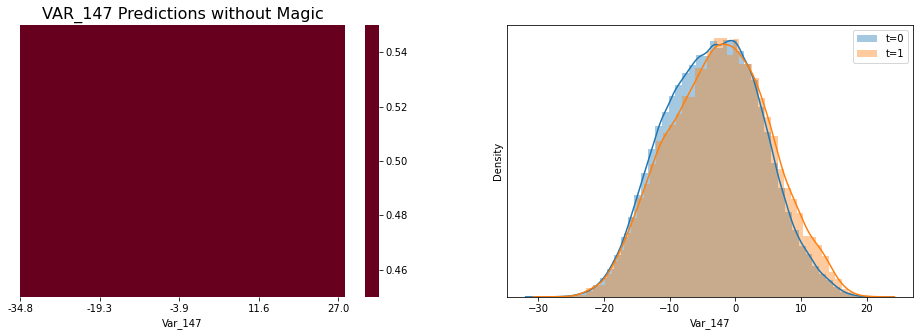

VAR_148 with magic val_auc = 0.5


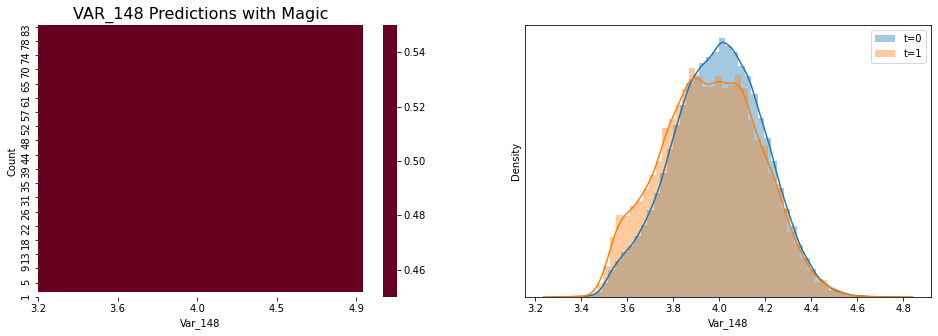

VAR_148 without magic val_auc = 0.5


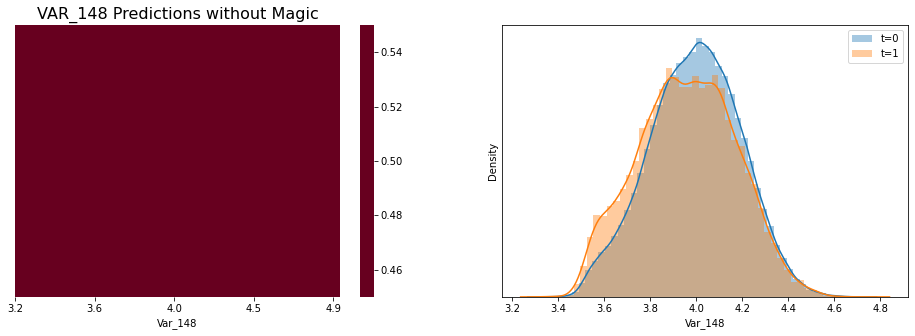

VAR_149 with magic val_auc = 0.5


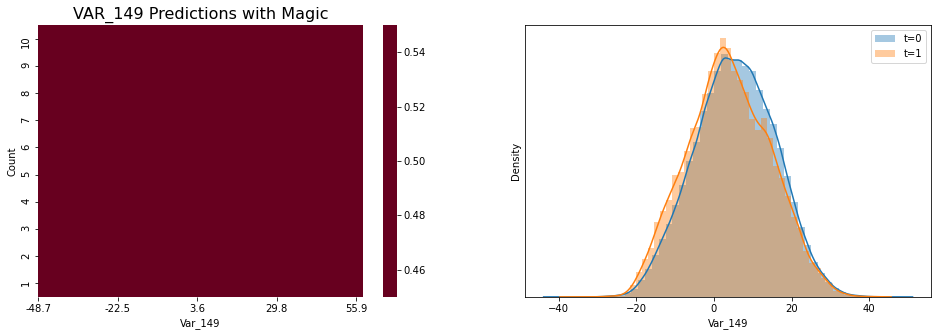

VAR_149 without magic val_auc = 0.5


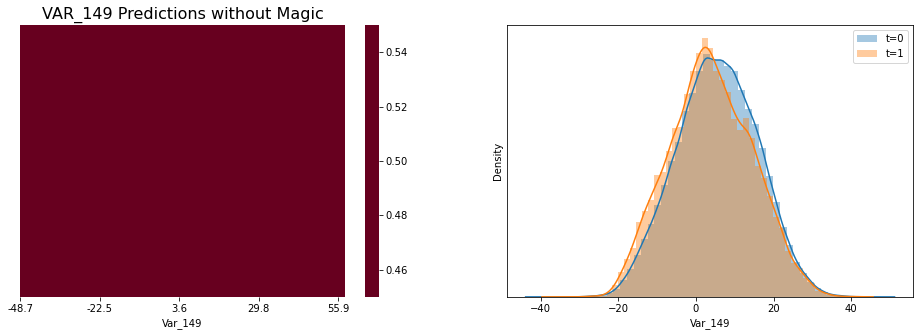

VAR_150 with magic val_auc = 0.5


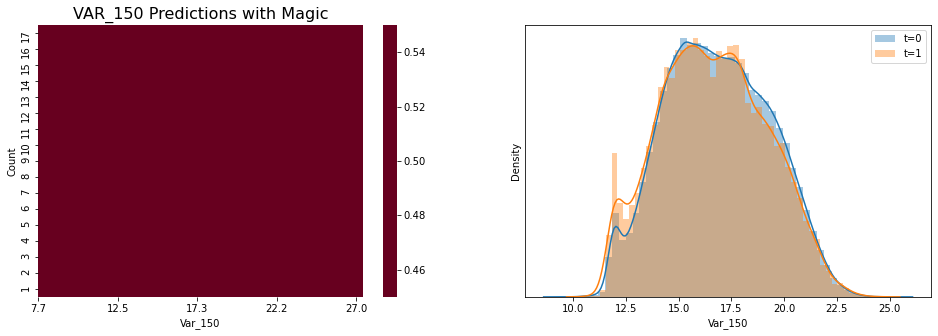

VAR_150 without magic val_auc = 0.5


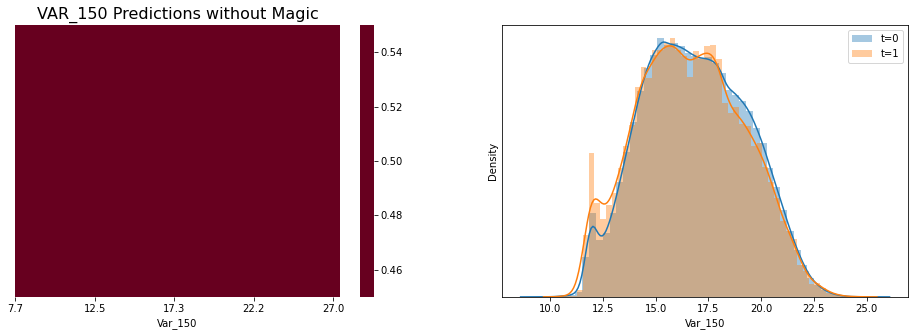

VAR_151 with magic val_auc = 0.5


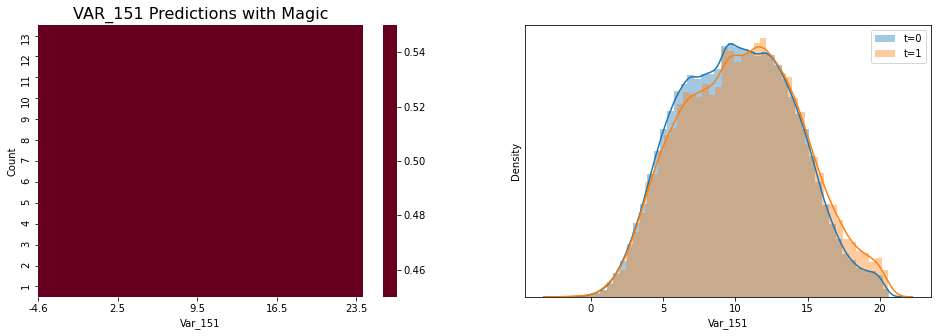

VAR_151 without magic val_auc = 0.5


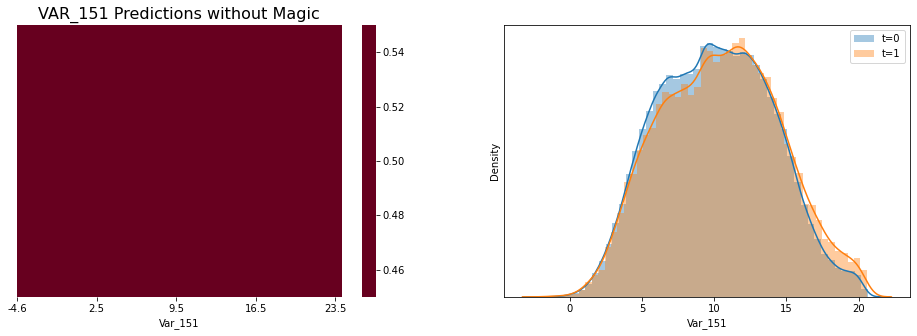

VAR_152 with magic val_auc = 0.5


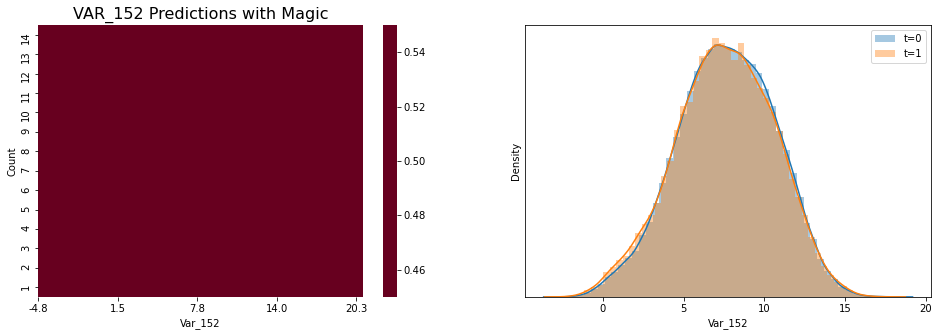

VAR_152 without magic val_auc = 0.5


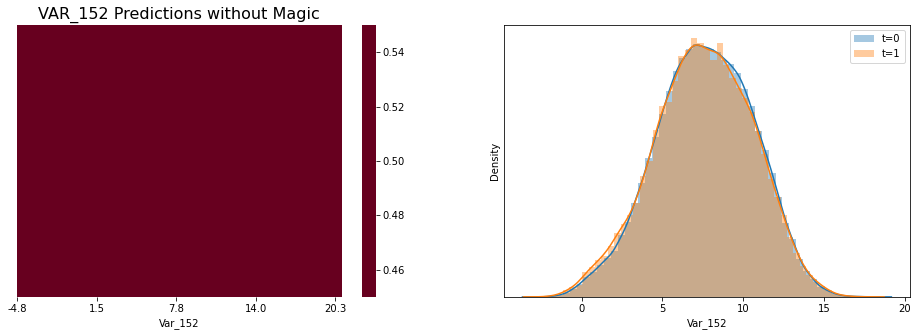

VAR_153 with magic val_auc = 0.5


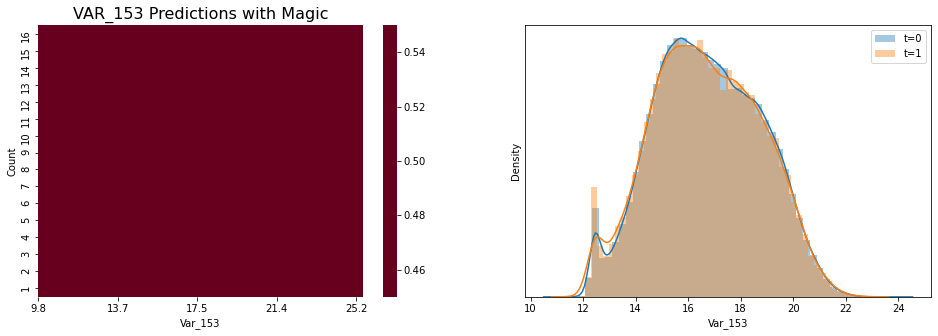

VAR_153 without magic val_auc = 0.5


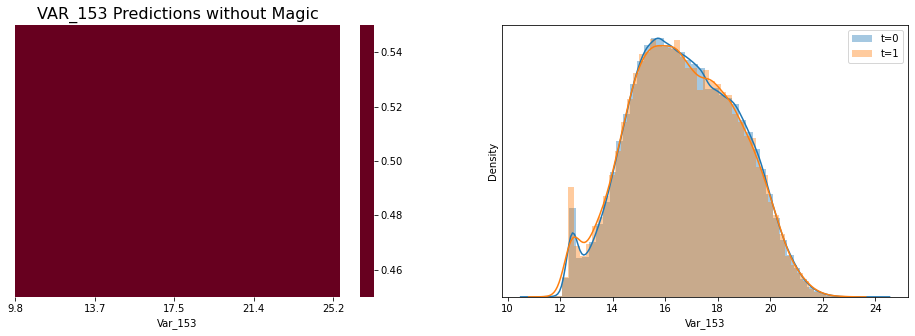

VAR_154 with magic val_auc = 0.5


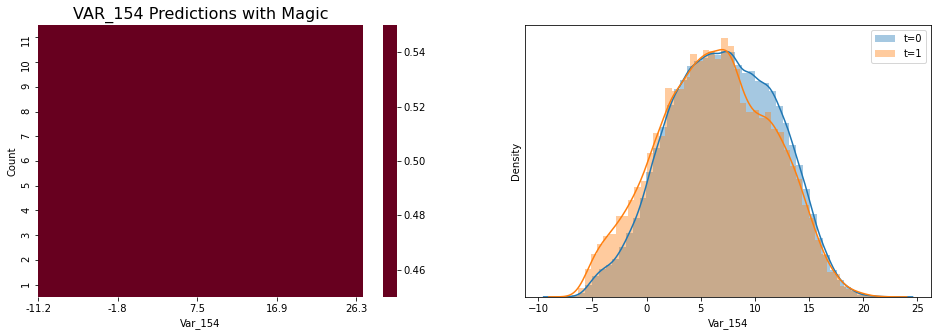

VAR_154 without magic val_auc = 0.5


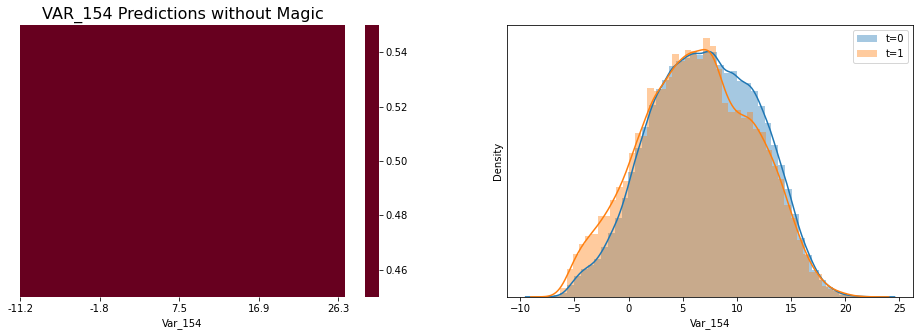

VAR_155 with magic val_auc = 0.5


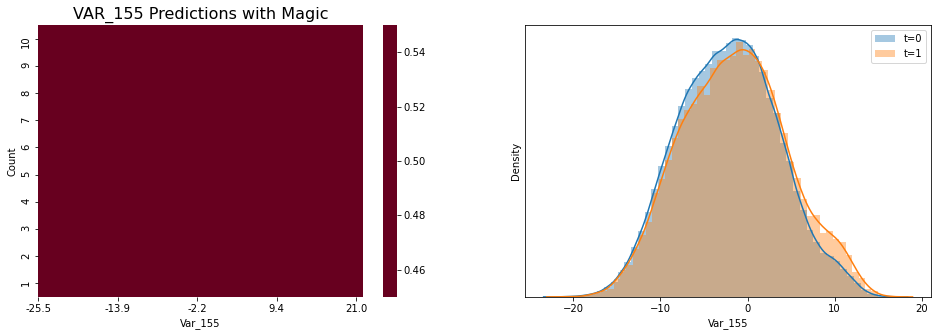

VAR_155 without magic val_auc = 0.5


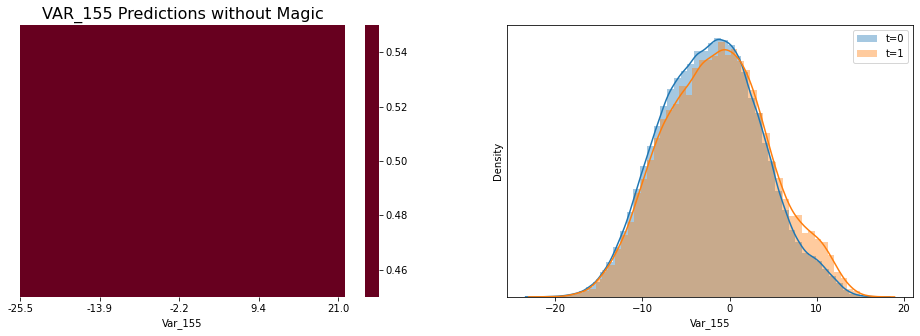

VAR_156 with magic val_auc = 0.5


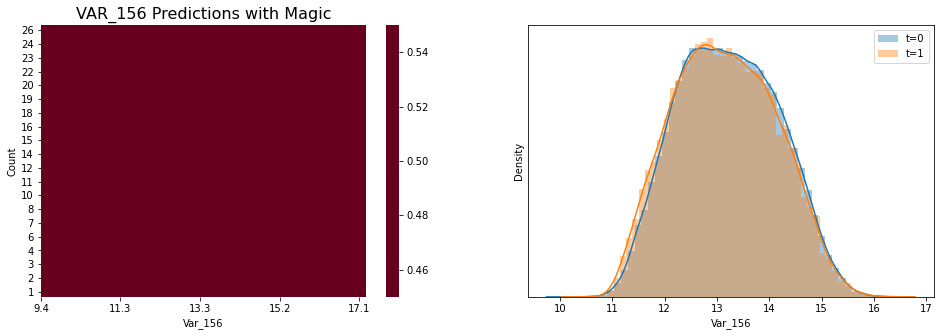

VAR_156 without magic val_auc = 0.5


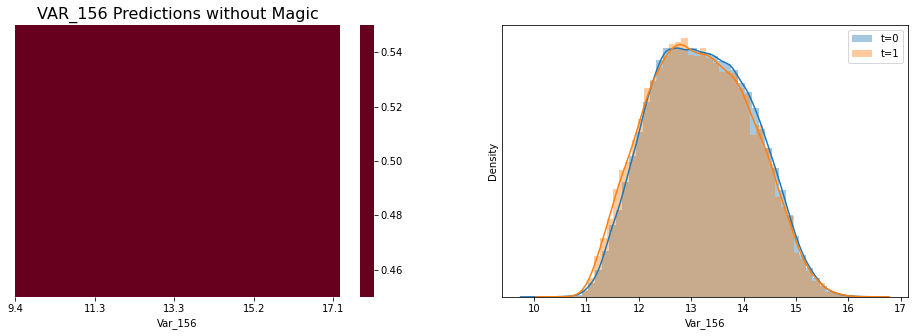

VAR_157 with magic val_auc = 0.5


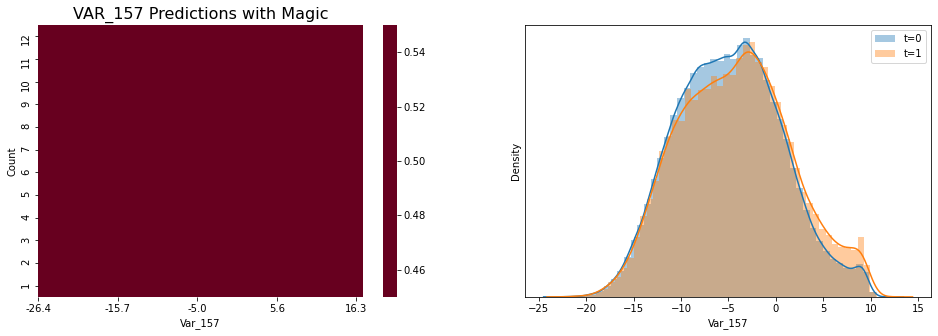

VAR_157 without magic val_auc = 0.5


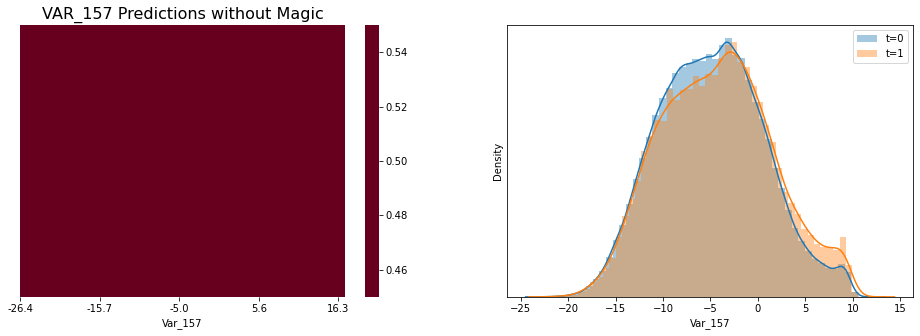

VAR_158 with magic val_auc = 0.5


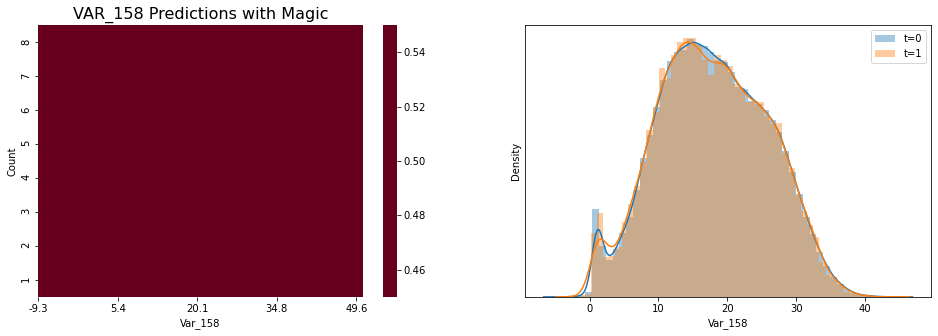

VAR_158 without magic val_auc = 0.5


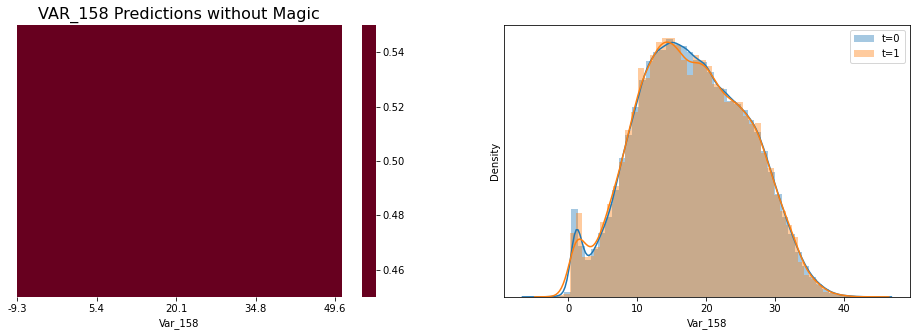

VAR_159 with magic val_auc = 0.5


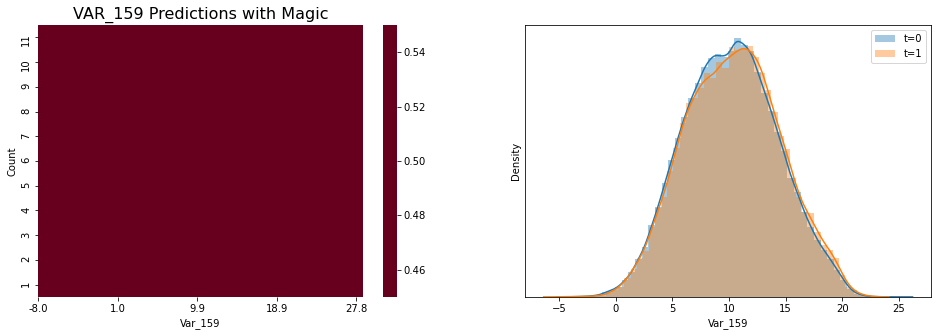

VAR_159 without magic val_auc = 0.5


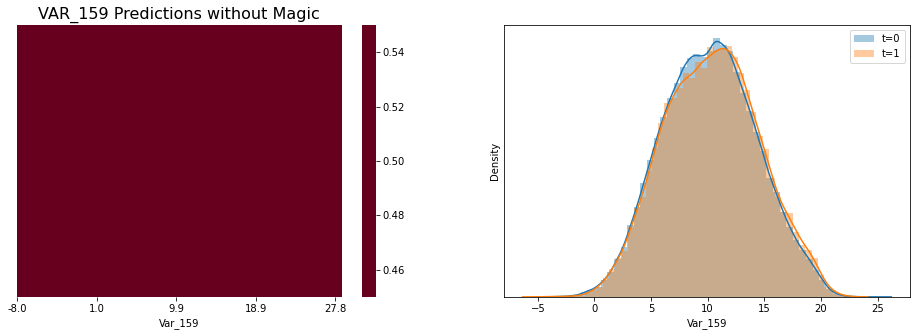

VAR_160 with magic val_auc = 0.5


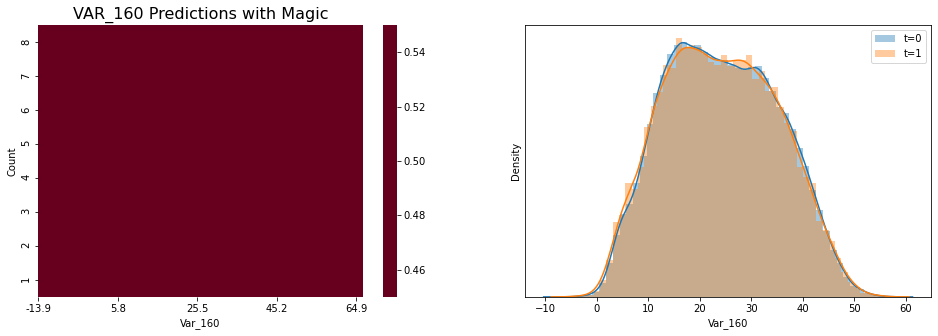

VAR_160 without magic val_auc = 0.5


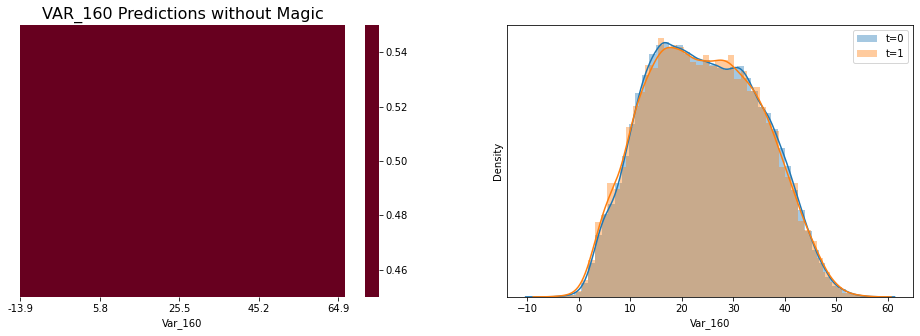

VAR_161 with magic val_auc = 0.5


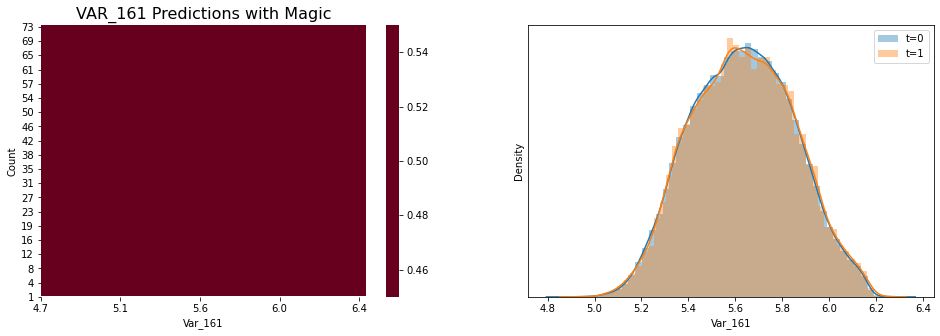

VAR_161 without magic val_auc = 0.5


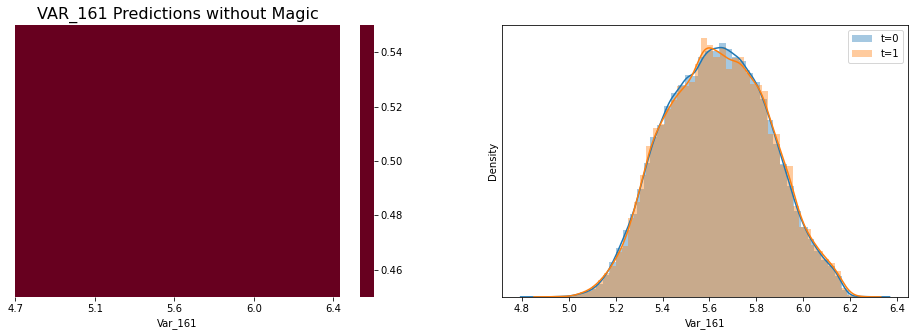

VAR_162 with magic val_auc = 0.5


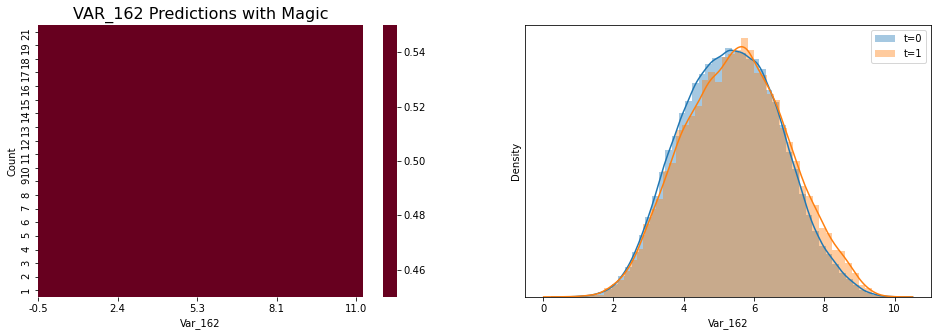

VAR_162 without magic val_auc = 0.5


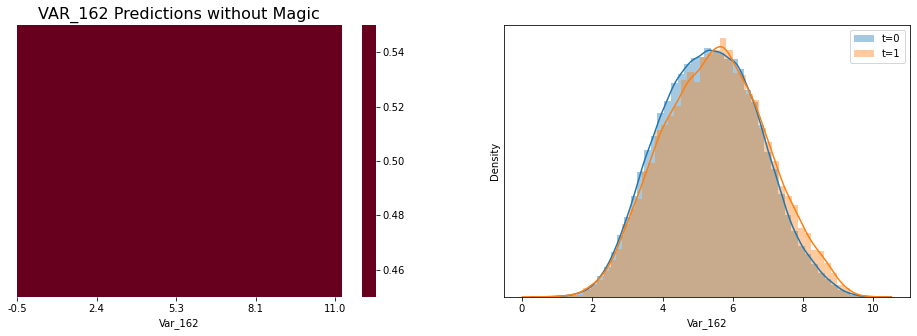

VAR_163 with magic val_auc = 0.5


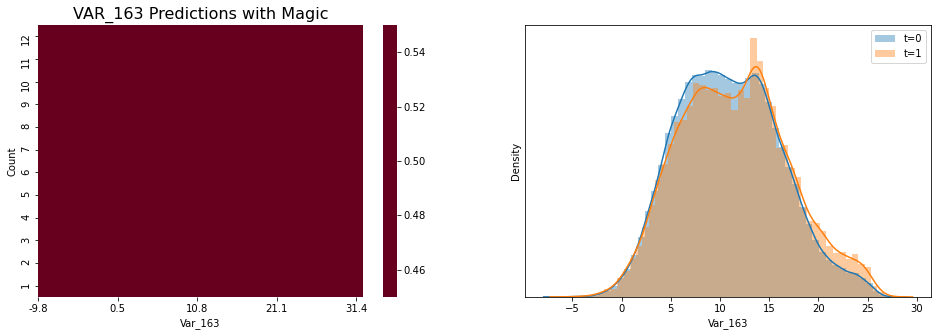

VAR_163 without magic val_auc = 0.5


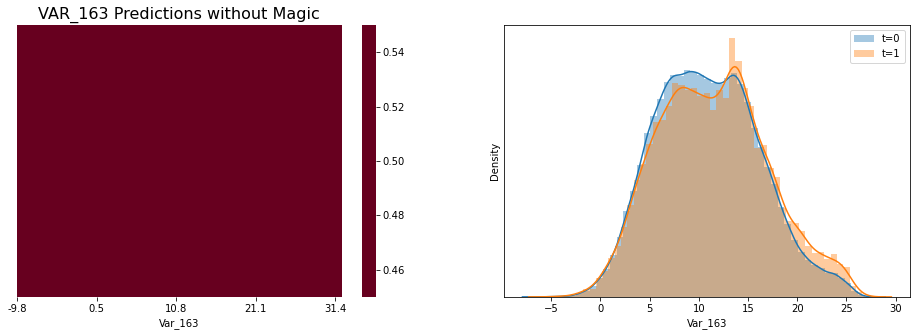

VAR_164 with magic val_auc = 0.51638


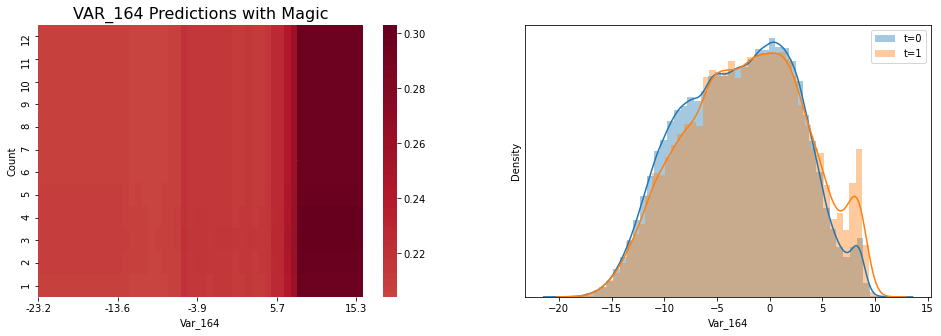

VAR_164 without magic val_auc = 0.51381


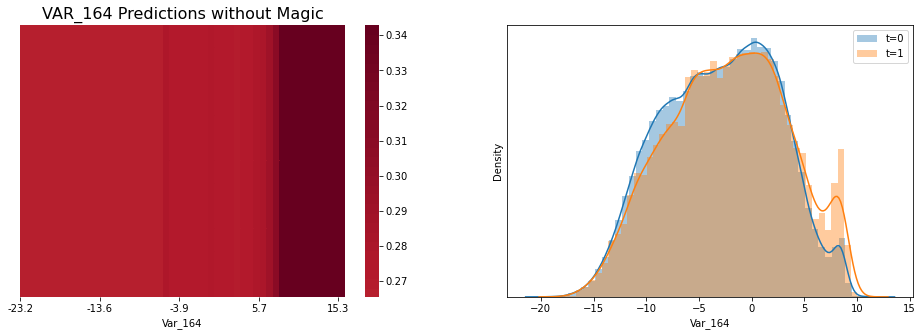

VAR_165 with magic val_auc = 0.50336


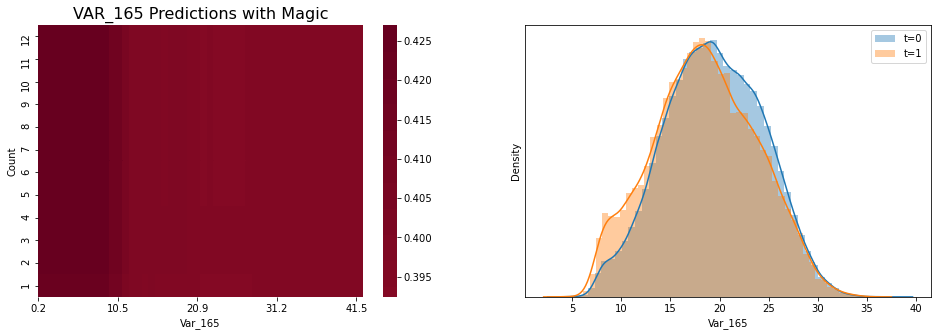

VAR_165 without magic val_auc = 0.50333


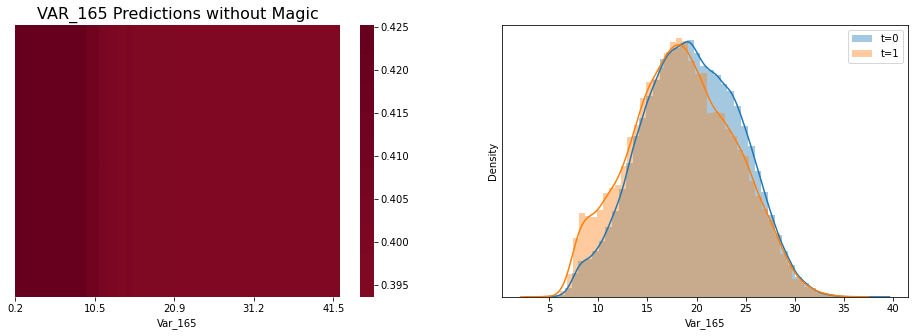

VAR_166 with magic val_auc = 0.5512


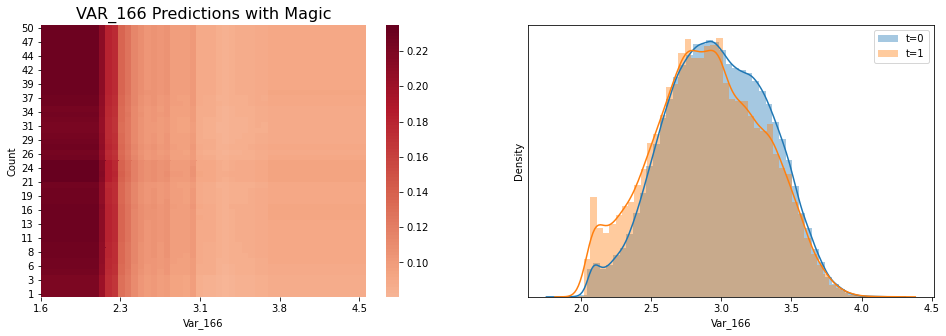

VAR_166 without magic val_auc = 0.5396


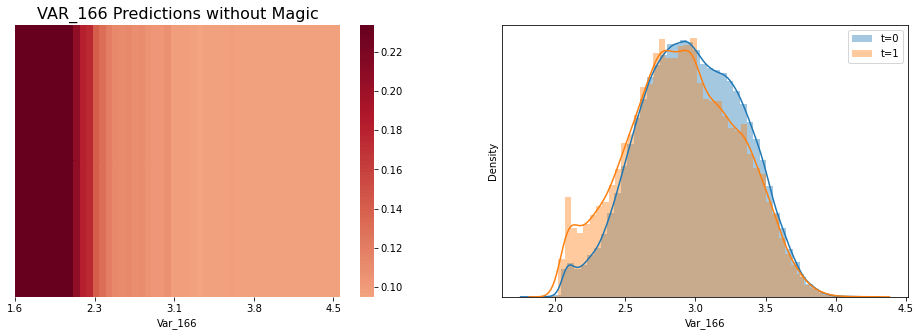

VAR_167 with magic val_auc = 0.5


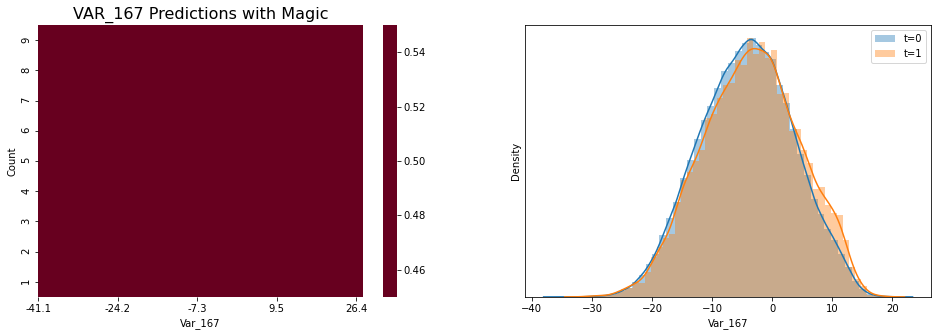

VAR_167 without magic val_auc = 0.5


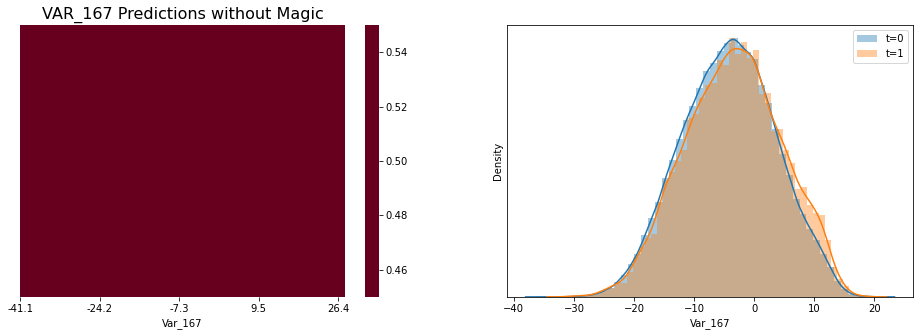

VAR_168 with magic val_auc = 0.5


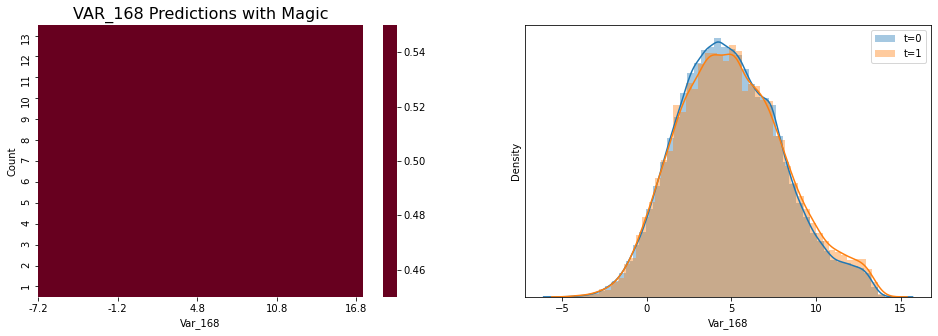

VAR_168 without magic val_auc = 0.5


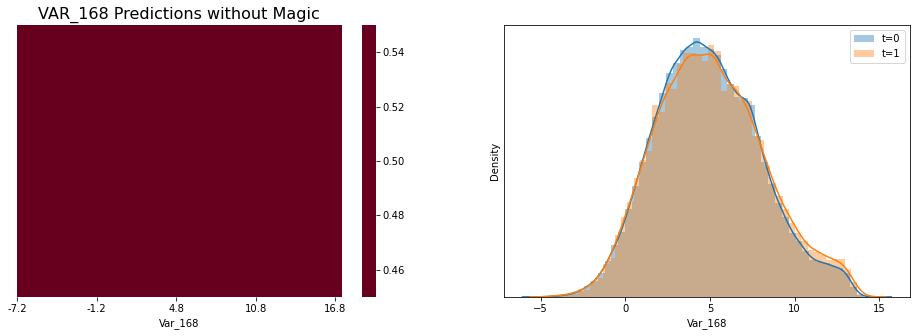

VAR_169 with magic val_auc = 0.5


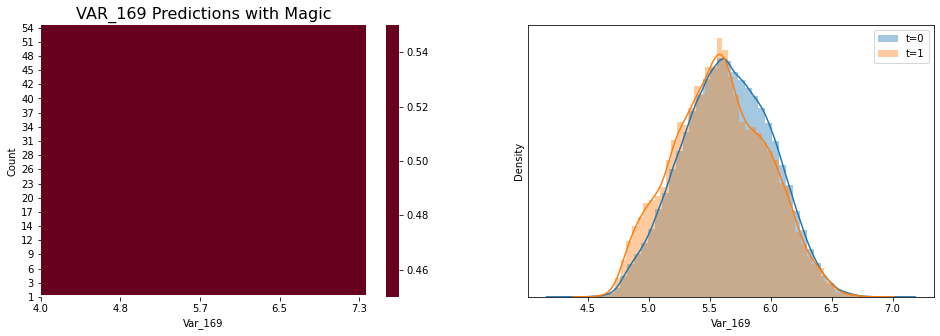

VAR_169 without magic val_auc = 0.5


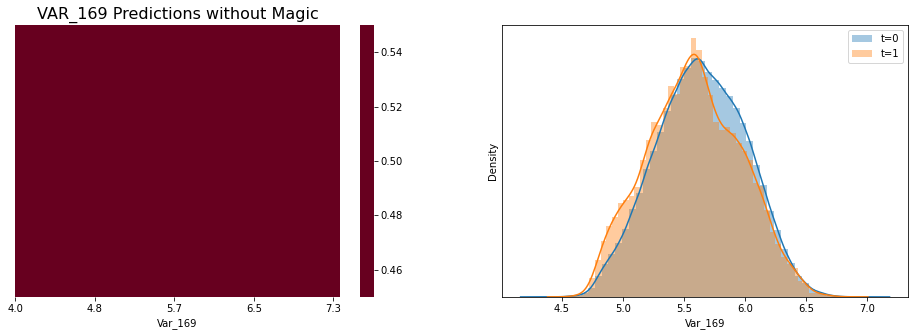

VAR_170 with magic val_auc = 0.5


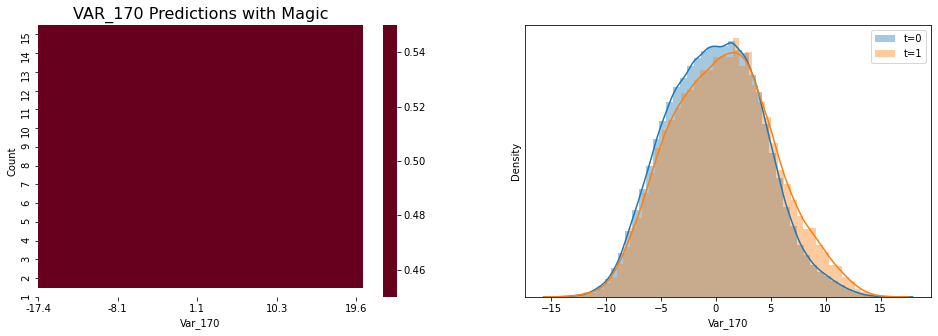

VAR_170 without magic val_auc = 0.5


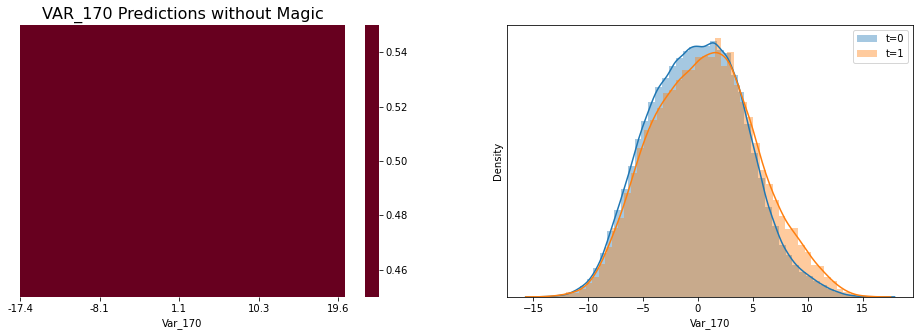

VAR_171 with magic val_auc = 0.5


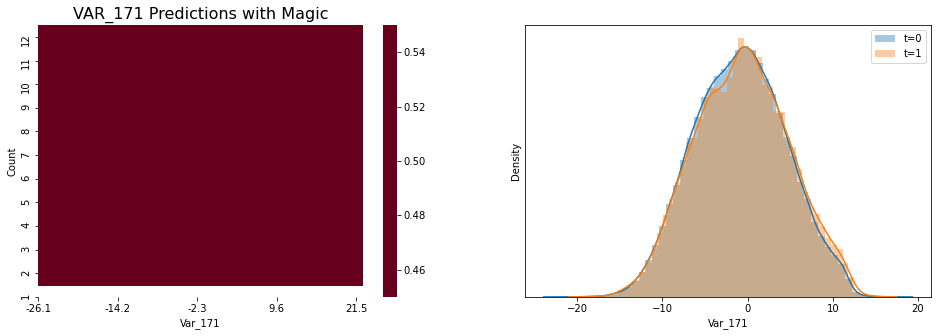

VAR_171 without magic val_auc = 0.5


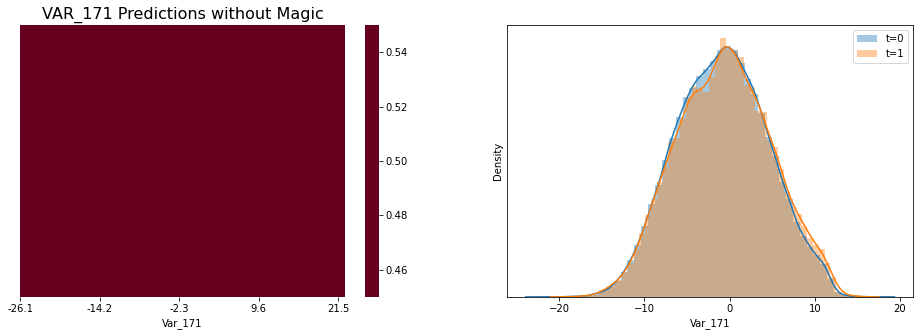

VAR_172 with magic val_auc = 0.5


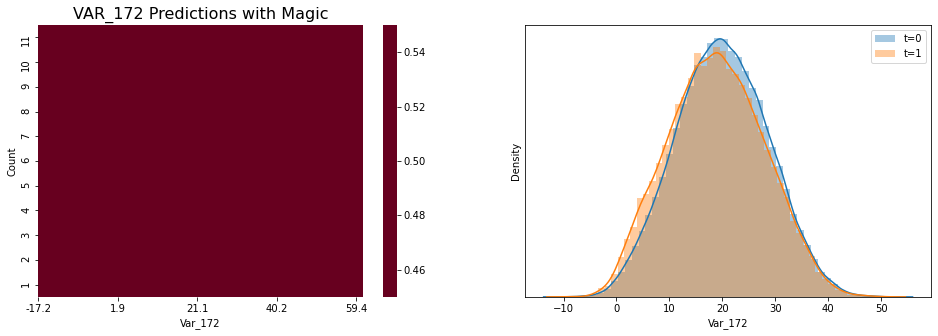

VAR_172 without magic val_auc = 0.5


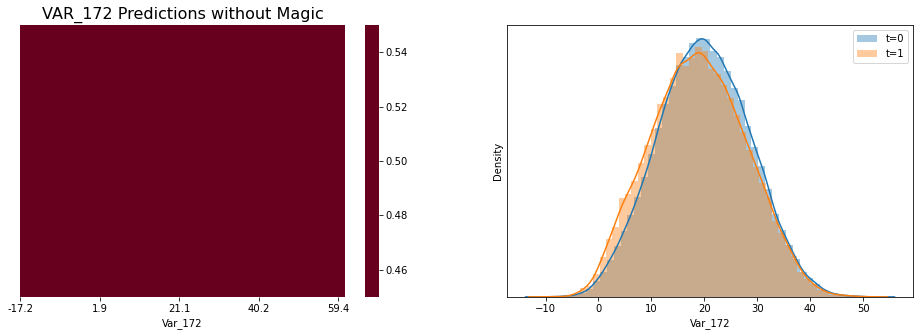

VAR_173 with magic val_auc = 0.5


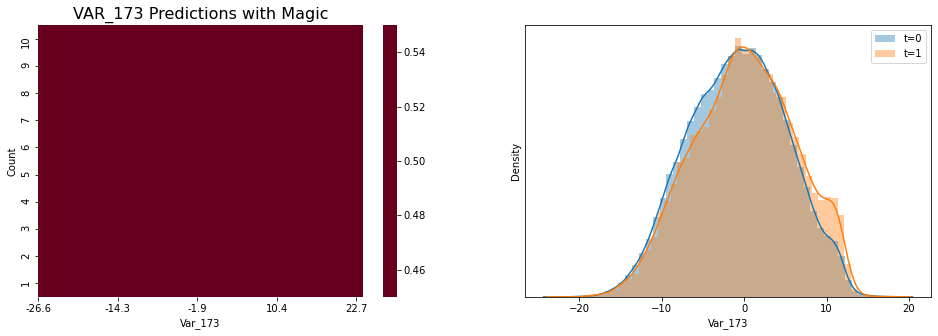

VAR_173 without magic val_auc = 0.5


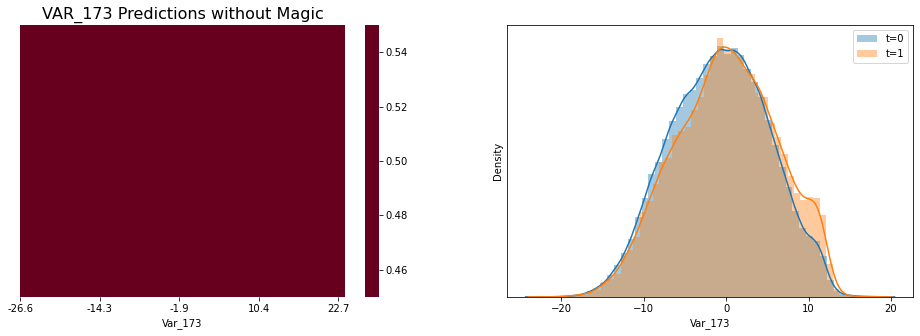

VAR_174 with magic val_auc = 0.55066


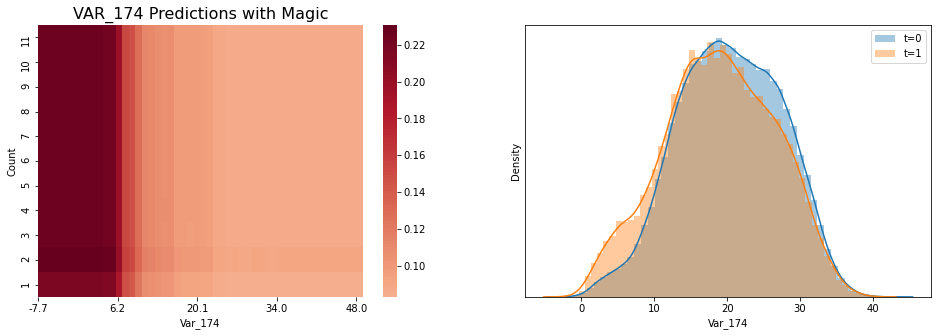

VAR_174 without magic val_auc = 0.54644


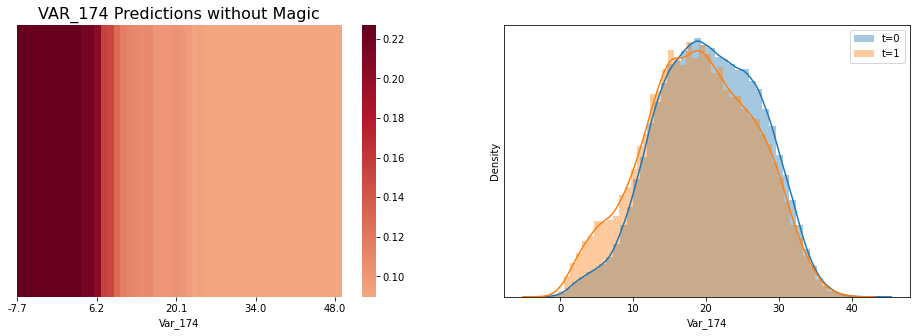

VAR_175 with magic val_auc = 0.5


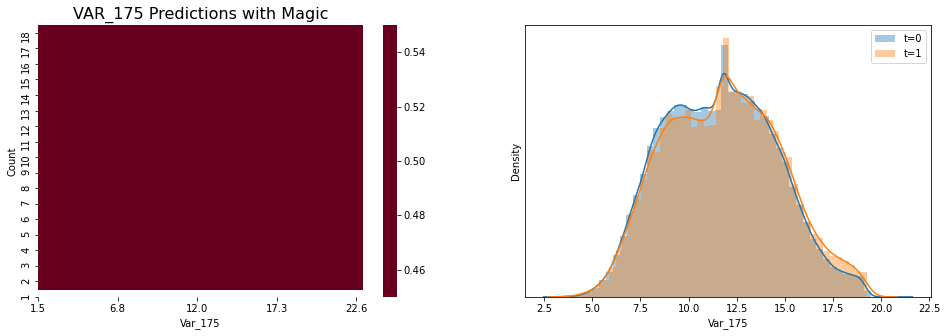

VAR_175 without magic val_auc = 0.5


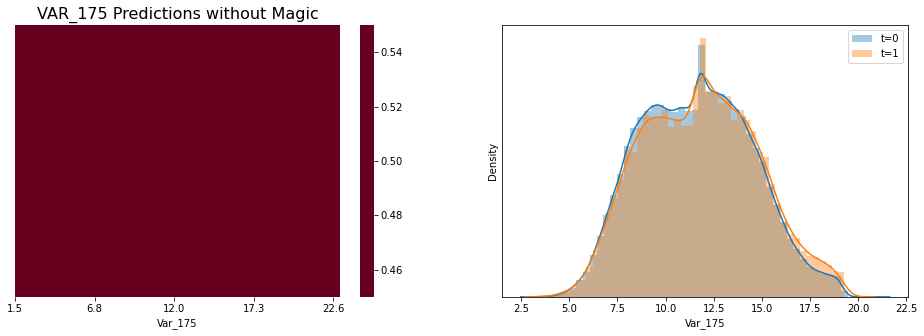

VAR_176 with magic val_auc = 0.5


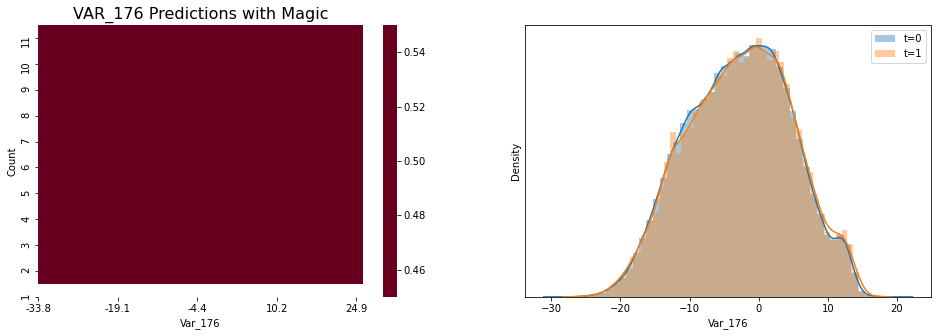

VAR_176 without magic val_auc = 0.5


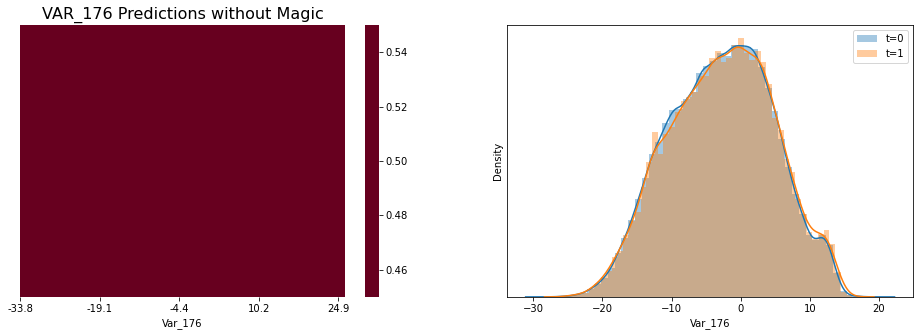

VAR_177 with magic val_auc = 0.50532


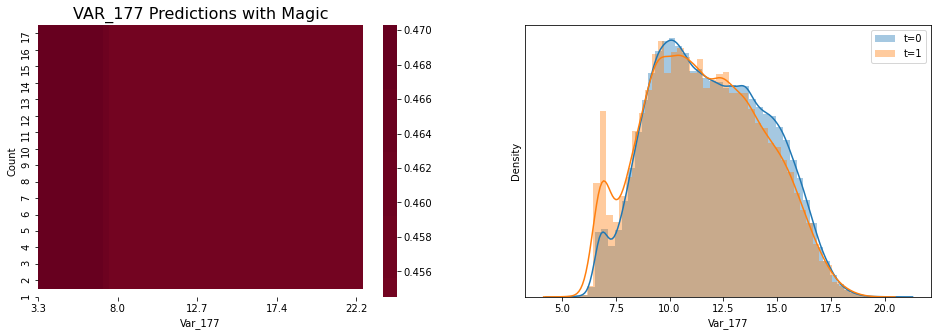

VAR_177 without magic val_auc = 0.50532


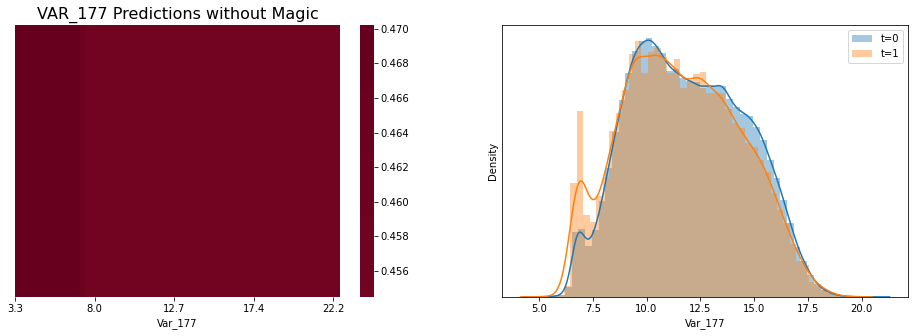

VAR_178 with magic val_auc = 0.5


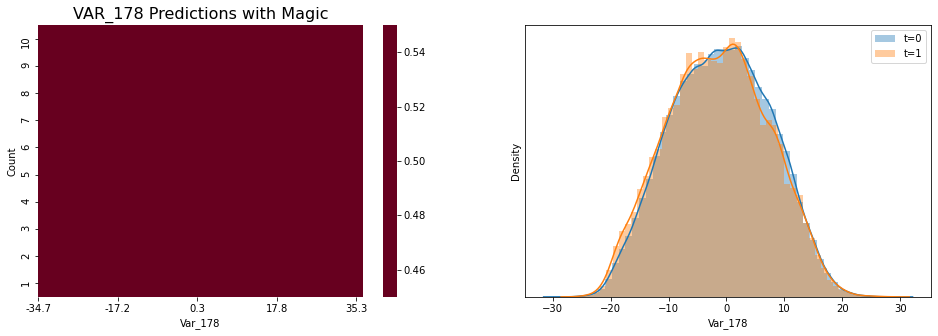

VAR_178 without magic val_auc = 0.5


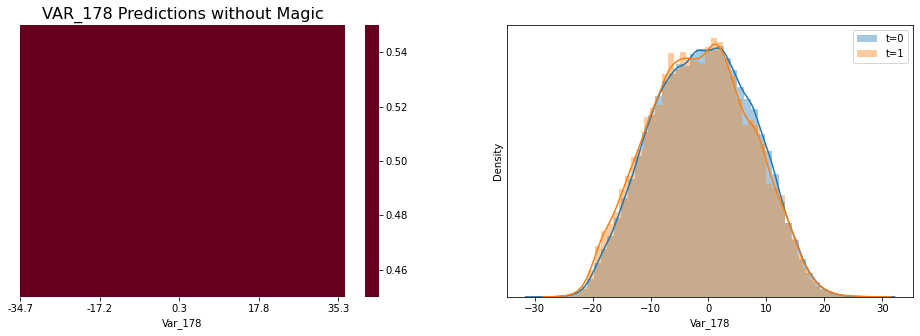

VAR_179 with magic val_auc = 0.50117


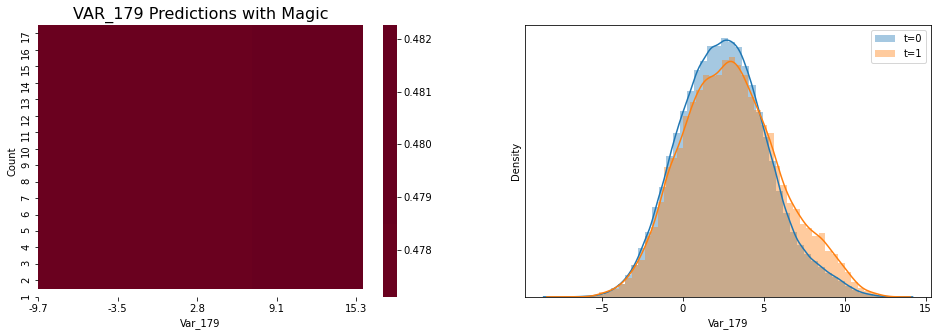

VAR_179 without magic val_auc = 0.50117


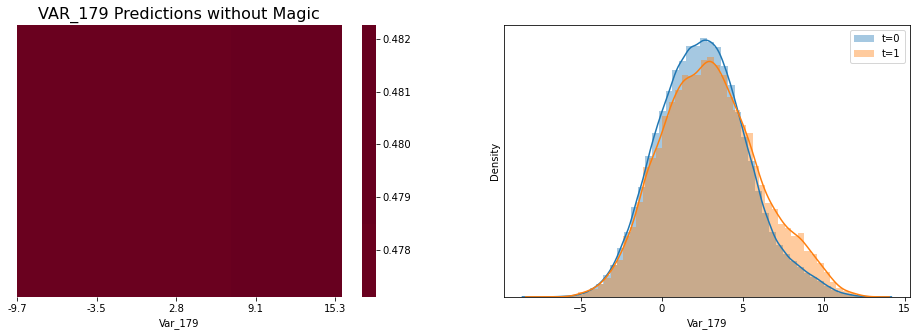

VAR_180 with magic val_auc = 0.5


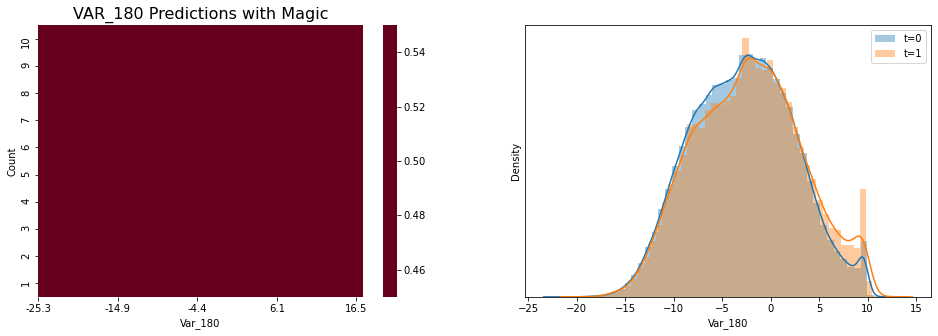

VAR_180 without magic val_auc = 0.5


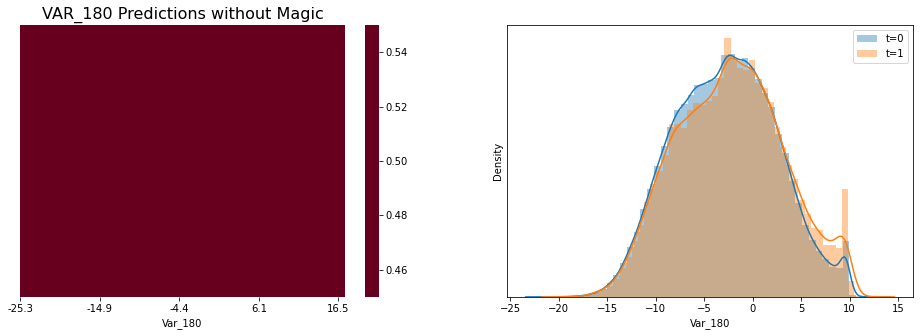

VAR_181 with magic val_auc = 0.5


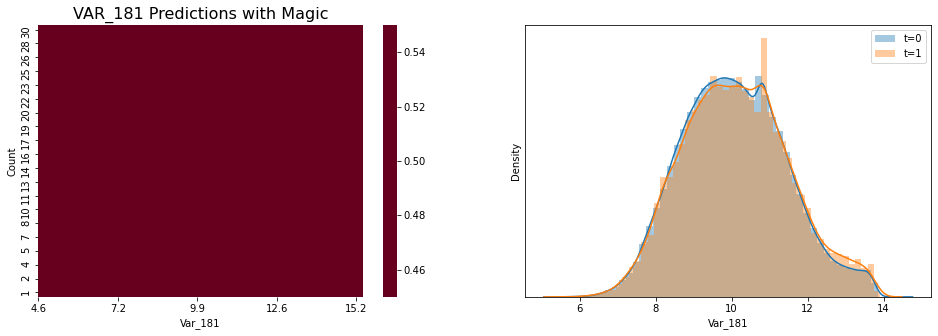

VAR_181 without magic val_auc = 0.5


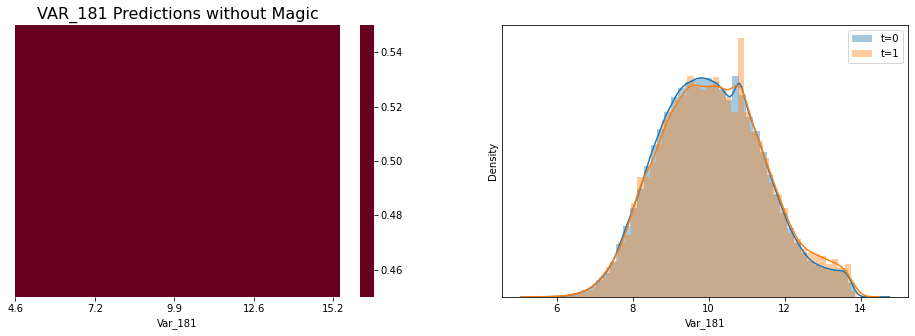

VAR_182 with magic val_auc = 0.5


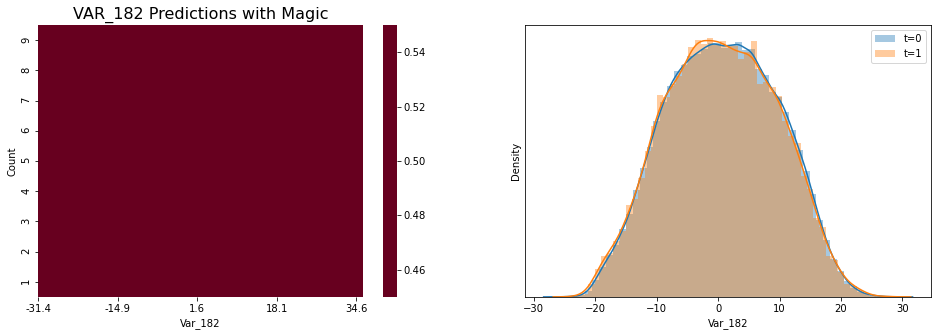

VAR_182 without magic val_auc = 0.5


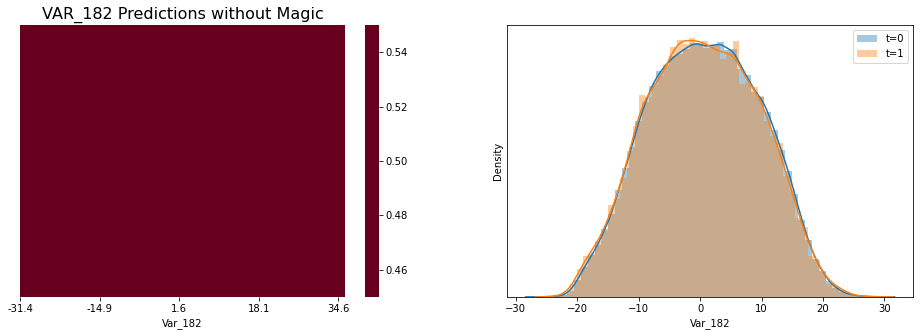

VAR_183 with magic val_auc = 0.5


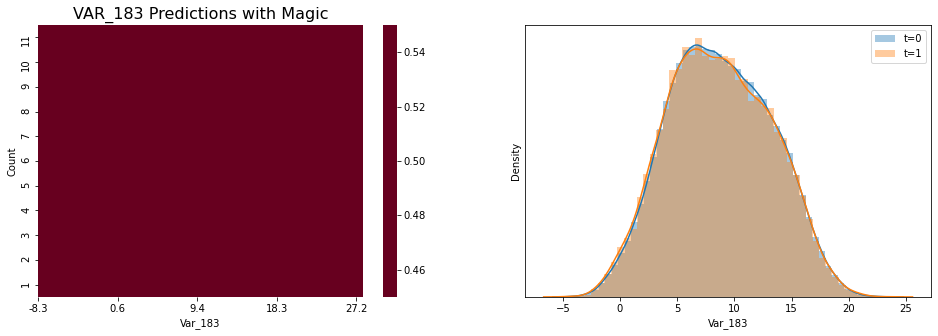

VAR_183 without magic val_auc = 0.5


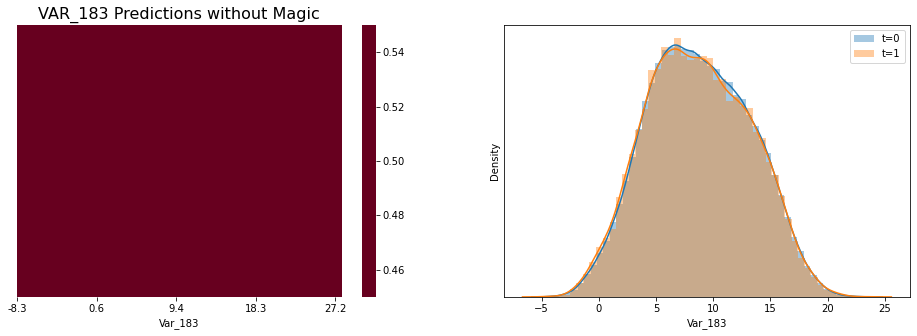

VAR_184 with magic val_auc = 0.5


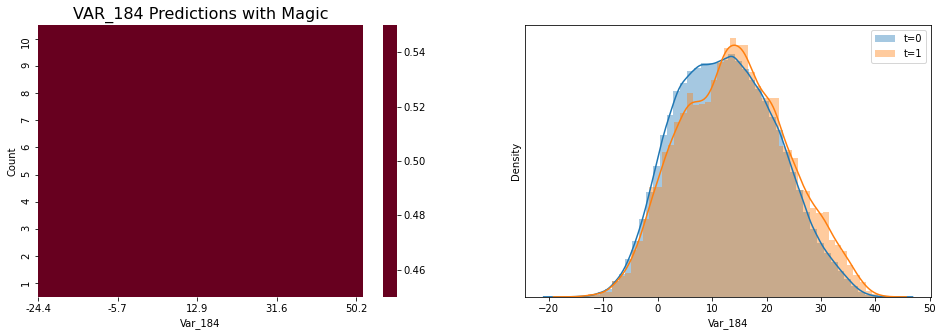

VAR_184 without magic val_auc = 0.5


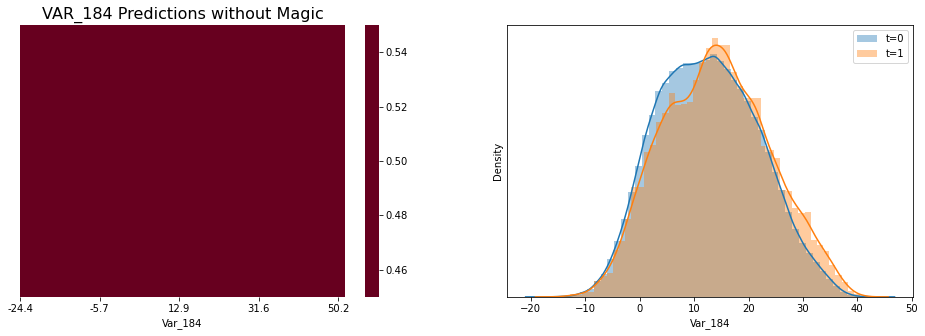

VAR_185 with magic val_auc = 0.5


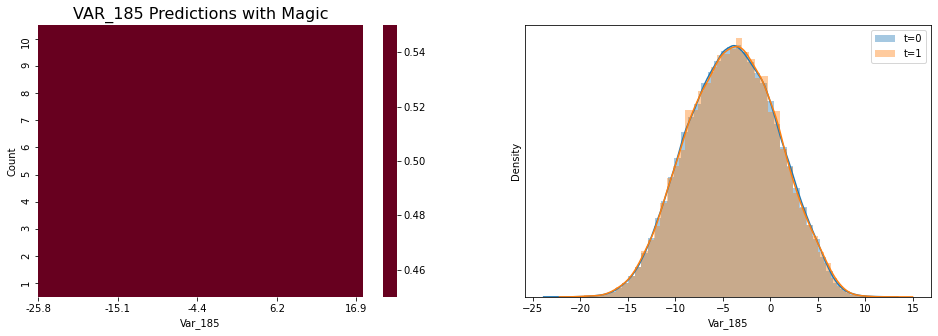

VAR_185 without magic val_auc = 0.5


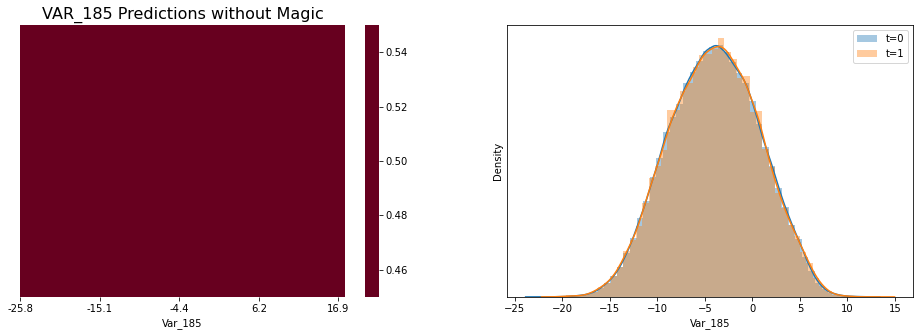

VAR_186 with magic val_auc = 0.5


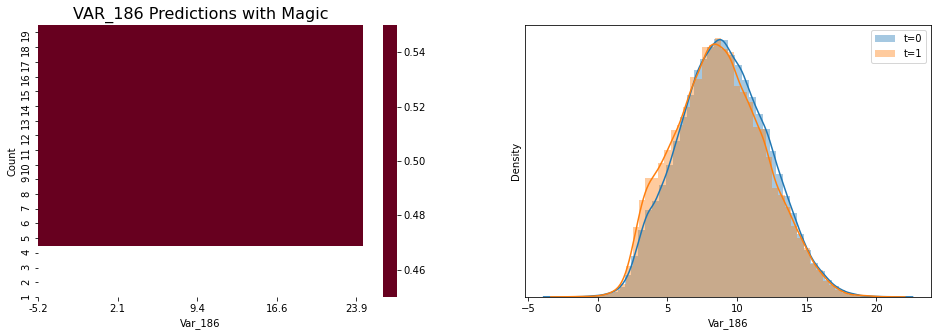

VAR_186 without magic val_auc = 0.5


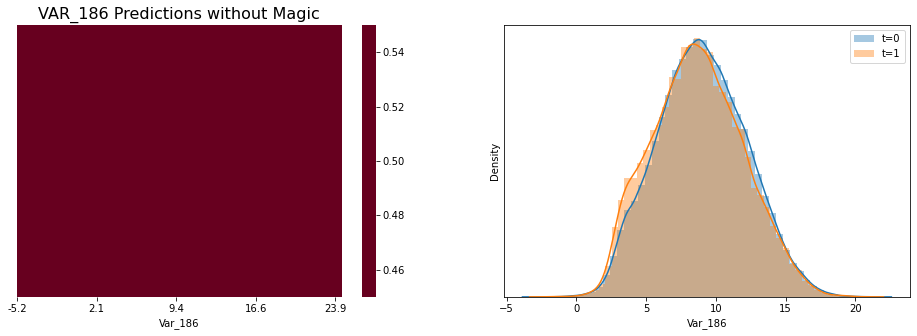

VAR_187 with magic val_auc = 0.5


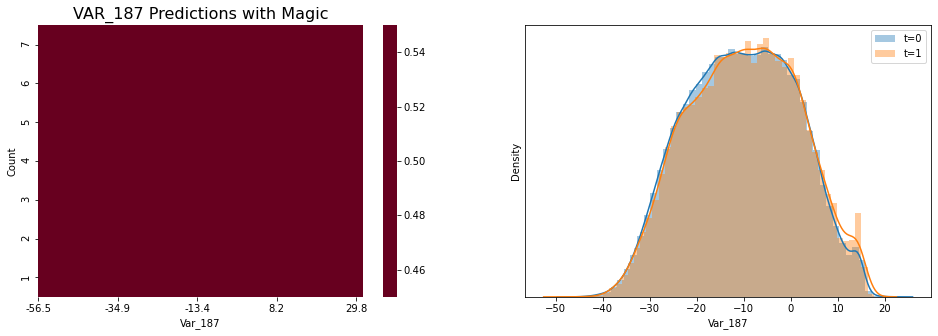

VAR_187 without magic val_auc = 0.5


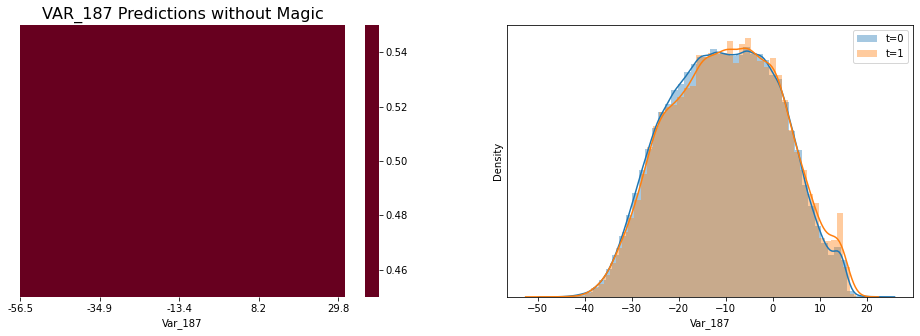

VAR_188 with magic val_auc = 0.5


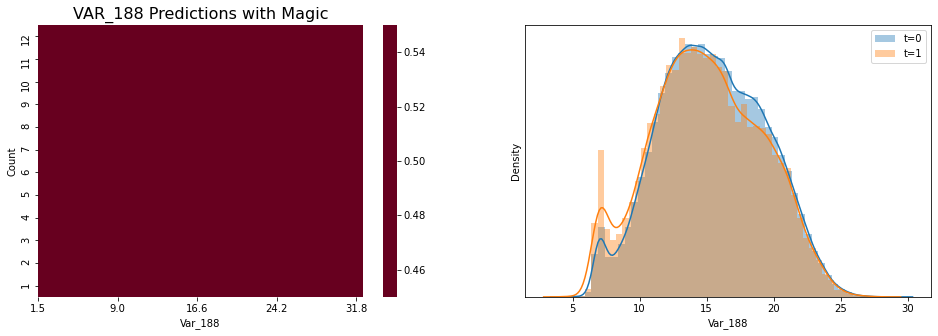

VAR_188 without magic val_auc = 0.5


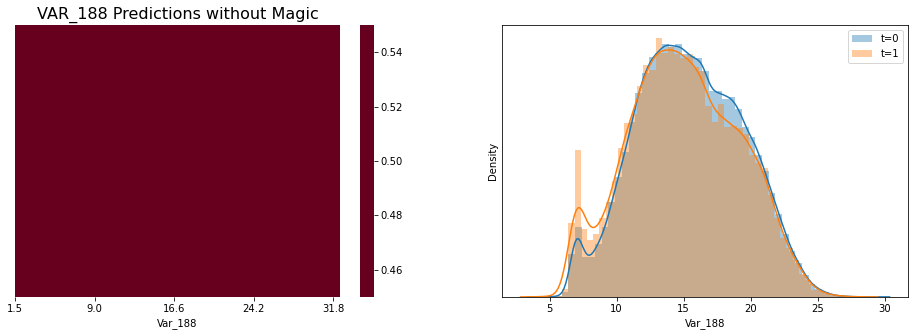

VAR_189 with magic val_auc = 0.5


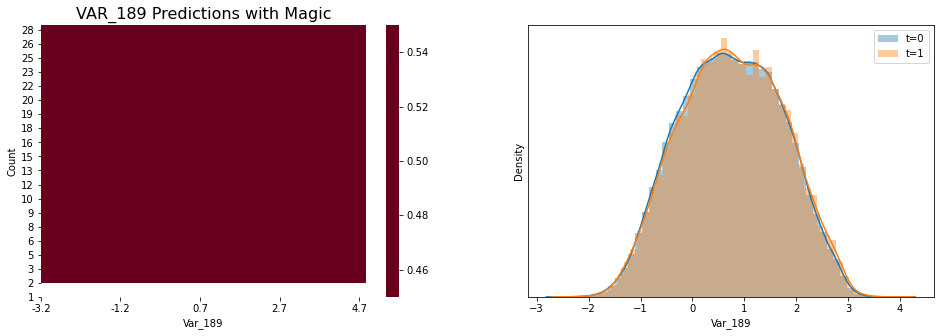

VAR_189 without magic val_auc = 0.5


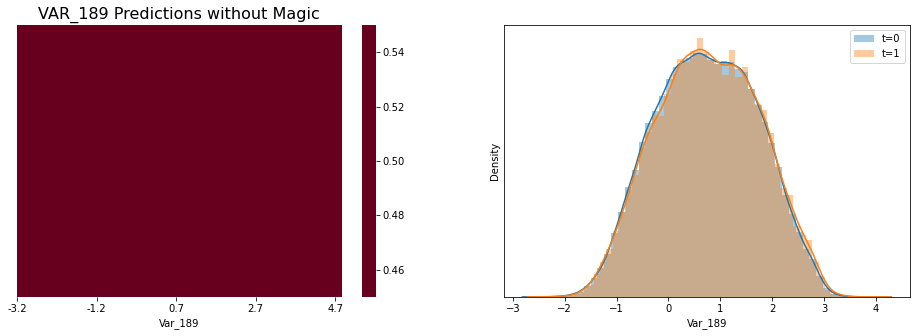

VAR_190 with magic val_auc = 0.5


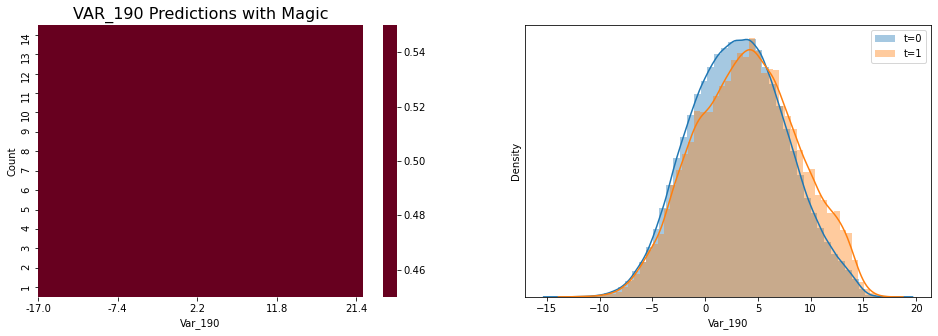

VAR_190 without magic val_auc = 0.5


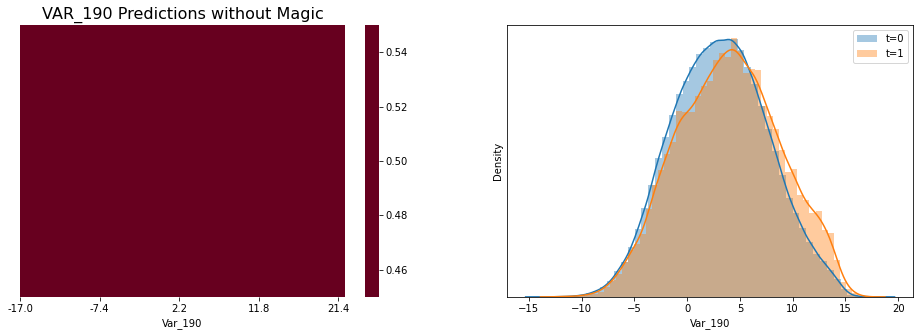

VAR_191 with magic val_auc = 0.5


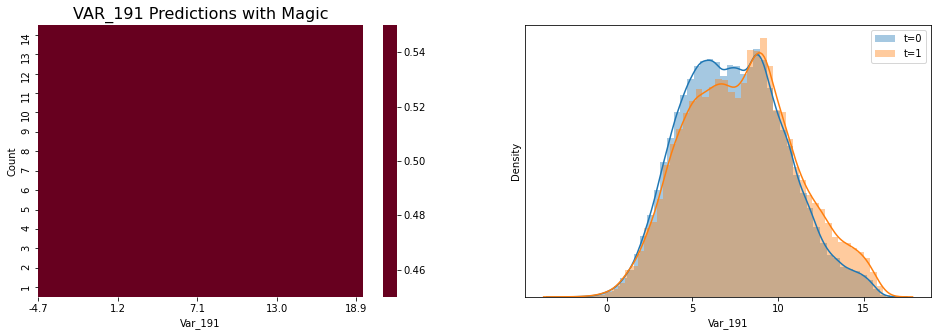

VAR_191 without magic val_auc = 0.5


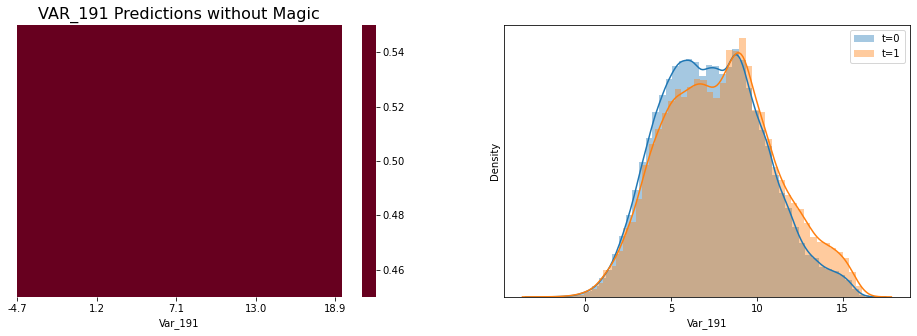

VAR_192 with magic val_auc = 0.5


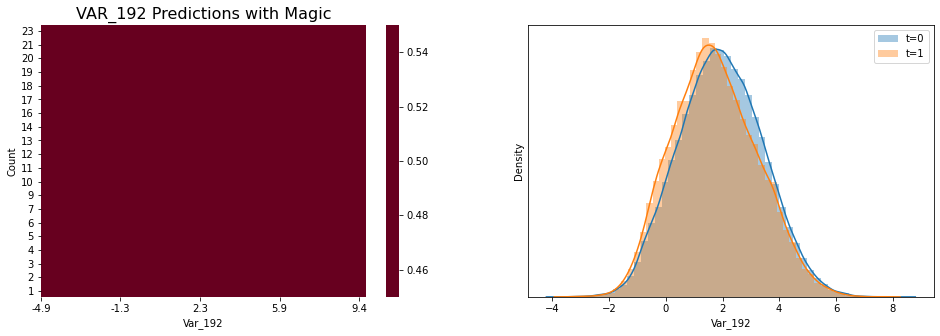

VAR_192 without magic val_auc = 0.5


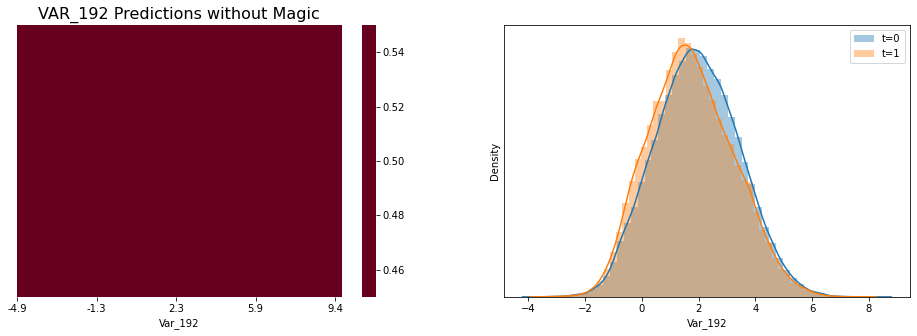

VAR_193 with magic val_auc = 0.5


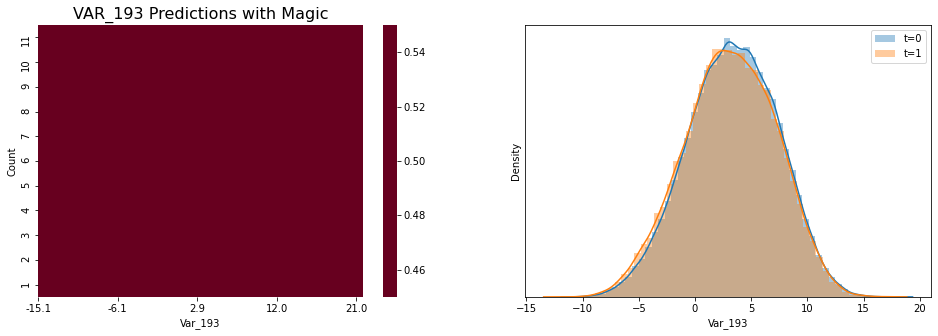

VAR_193 without magic val_auc = 0.5


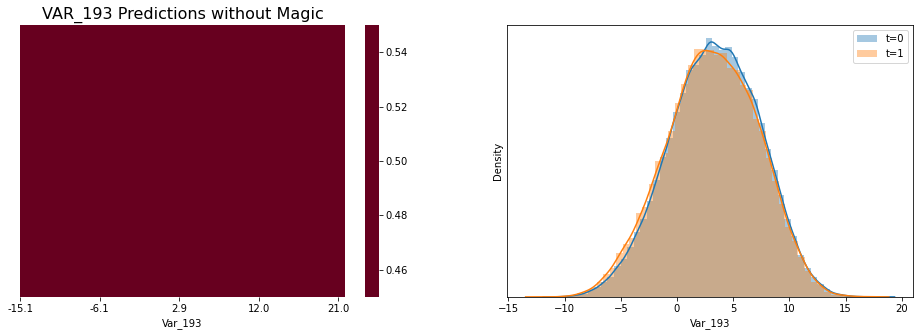

VAR_194 with magic val_auc = 0.5


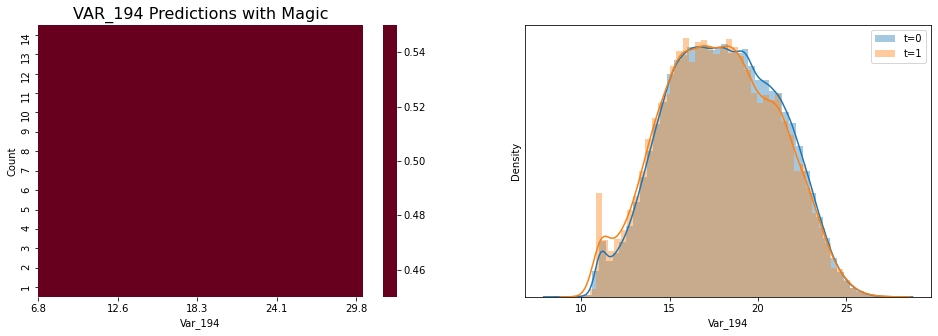

VAR_194 without magic val_auc = 0.5


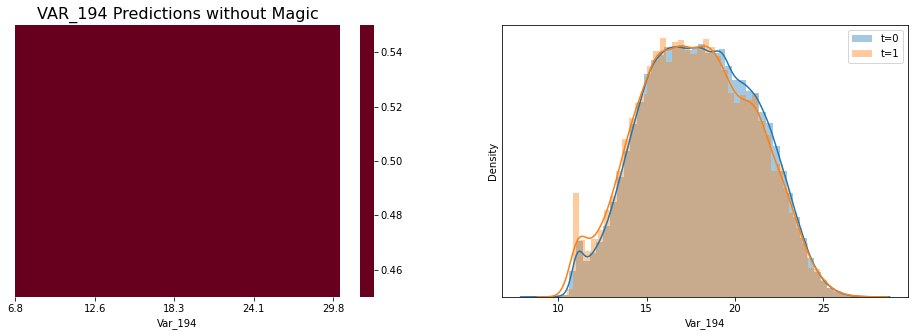

VAR_195 with magic val_auc = 0.5


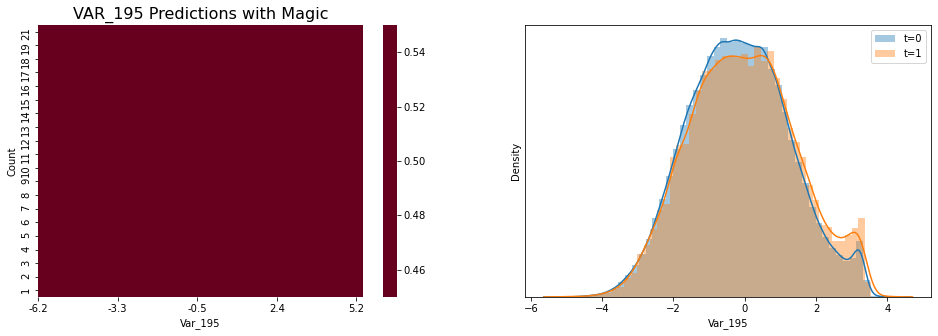

VAR_195 without magic val_auc = 0.5


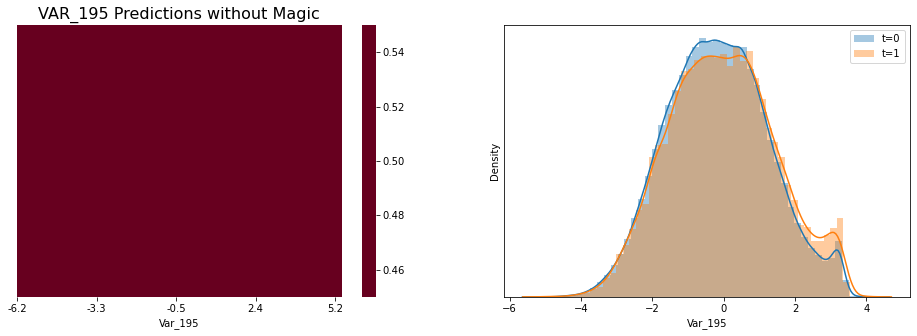

VAR_196 with magic val_auc = 0.5


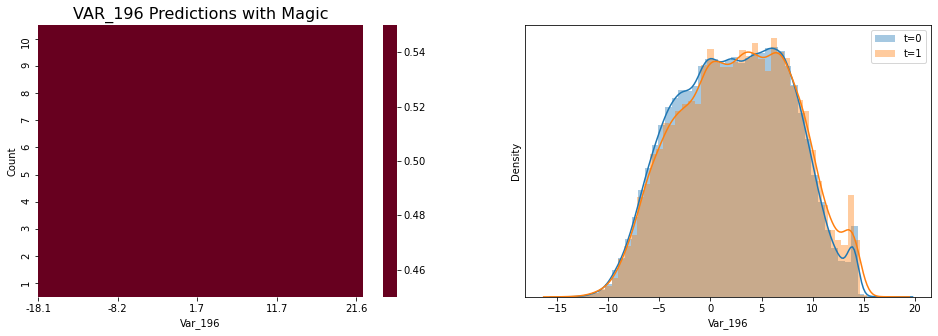

VAR_196 without magic val_auc = 0.5


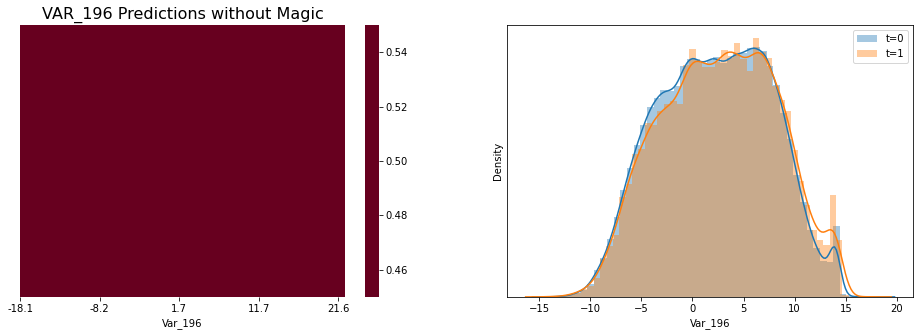

VAR_197 with magic val_auc = 0.5


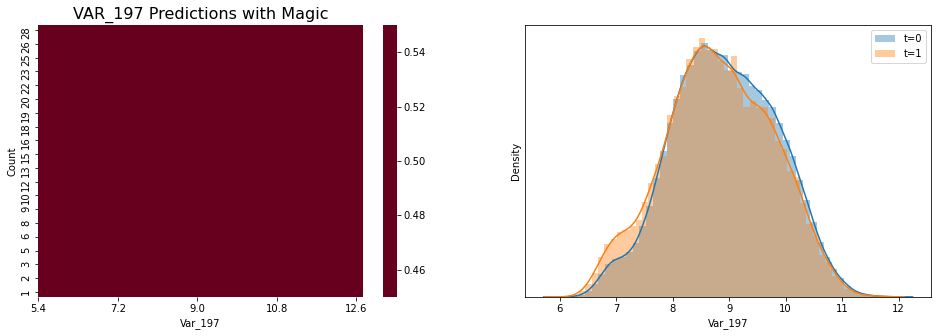

VAR_197 without magic val_auc = 0.5


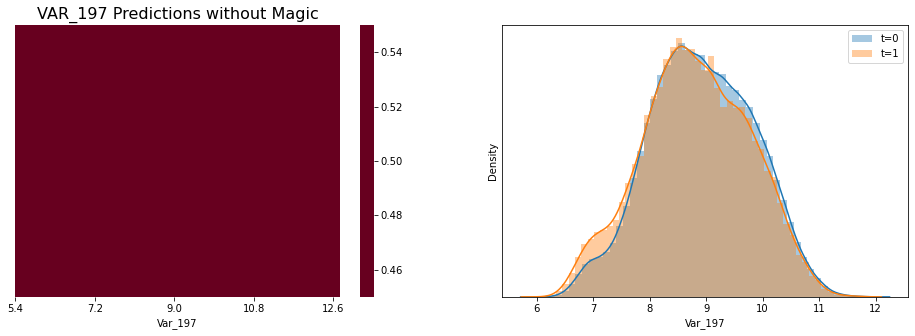

VAR_198 with magic val_auc = 0.50318


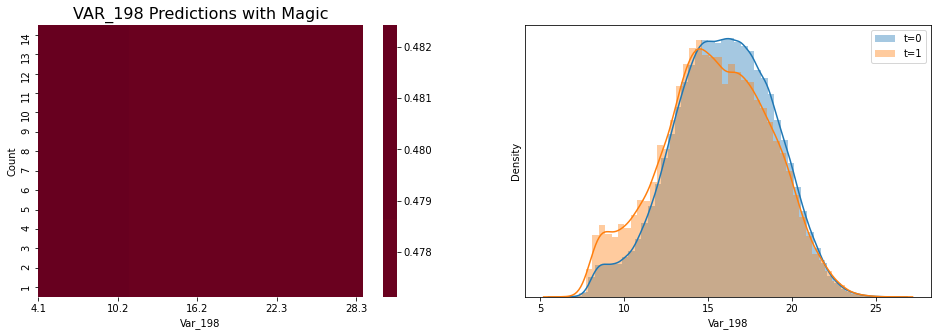

VAR_198 without magic val_auc = 0.50594


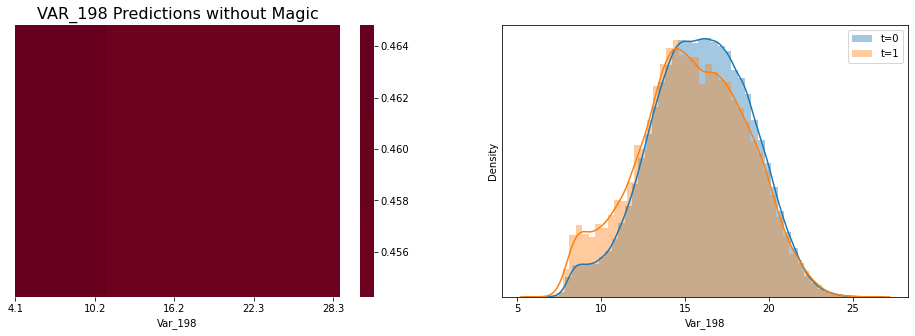

VAR_199 with magic val_auc = 0.5


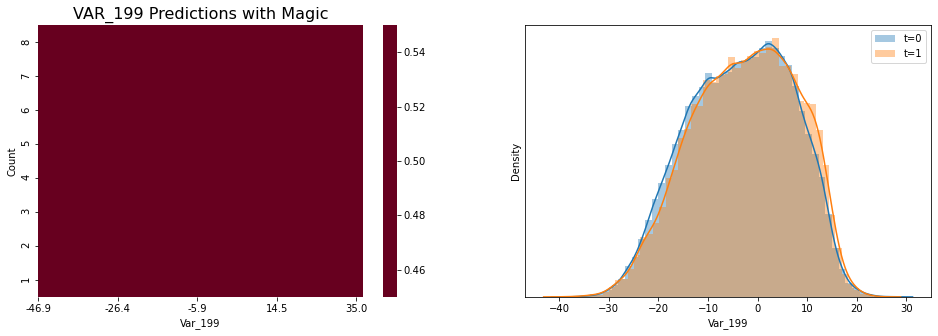

VAR_199 without magic val_auc = 0.5


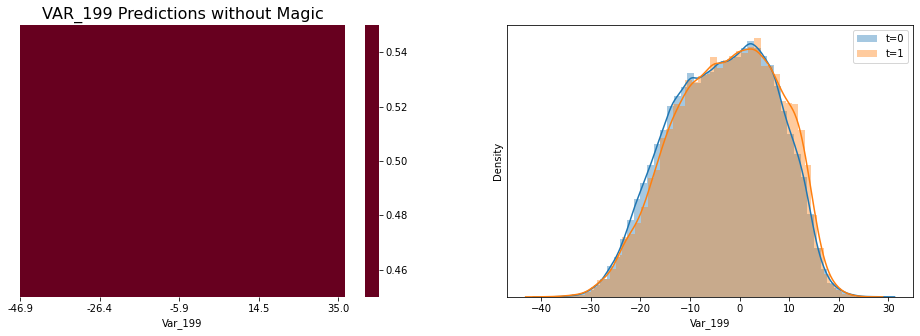

In [35]:
for j in range(num_vars):
    
    # MODEL WITH MAGIC
    features = ['var_'+str(j),'var_'+str(j)+'_FE']
    oof = np.zeros(len(train2))
    preds = np.zeros(len(test))
    
    # PLOT DENSITIES    
    plt.figure(figsize=(16,5))
    plt.subplot(1,2,2)
    sns.distplot(train2[train2['target']==0]['var_'+str(j)], label = 't=0')
    sns.distplot(train2[train2['target']==1]['var_'+str(j)], label = 't=1')
    plt.legend()
    plt.yticks([])
    plt.xlabel('Var_'+str(j))

    # MAKE A GRID OF POINTS FOR LGBM TO PREDICT    
    mn,mx = plt.xlim()
    mnFE = train2['var_'+str(j)+'_FE'].min()
    mxFE = train2['var_'+str(j)+'_FE'].max()
    step = 50
    stepB = train2['var_'+str(j)+'_FE'].nunique()
    w = (mx-mn)/step
    x = w * (np.arange(0,step)+0.5) + mn
    x2 = np.array([])
    for i in range(stepB):
        x2 = np.concatenate([x,x2])
    df = pd.DataFrame({'var_'+str(j):x2})
    df['var_'+str(j)+'_FE'] = mnFE + (mxFE-mnFE)/(stepB-1) * (df.index//step)
    df['pred'] = 0
    
    # 5-FOLD WITH MAGIC
    for k in range(5):
            valid = train2.iloc[k*40000:(k+1)*40000]
            train = train2[ ~train2.index.isin(valid.index) ]    
            trn_data  = lgbm.Dataset(train[features], label=train['target'])
            val_data = lgbm.Dataset(valid[features], label=valid['target'])     
            model = lgbm.train(param, trn_data, 750, valid_sets = [trn_data, val_data], 
                    verbose_eval=False, evals_result=evals_result)      
            x = evals_result['valid_1']['auc']
            best = x.index(max(x))
            #print('i=',i,'k=',k,'best=',best)
            oof[k*40000:(k+1)*40000] = model.predict(valid[features], num_iteration=best)
            preds += model.predict(test[features], num_iteration=best)/5.0
            df['pred'] += model.predict(df[features], num_iteration=best)/5.0
            
    val_auc = roc_auc_score(train2['target'],oof)
    print('VAR_'+str(j)+' with magic val_auc =',round(val_auc,5))
    all_oof[:,j+1] = oof
    all_preds[:,j+1] = preds
    x = df['pred'].values
    x = np.reshape(x,(stepB,step))
    x = np.flip(x,axis=0)
    
    # PLOT LGBM PREDICTIONS USING MAGIC    
    plt.subplot(1,2,1)
    sns.heatmap(x, cmap='RdBu_r', center=0.0) 
    plt.title('VAR_'+str(j)+' Predictions with Magic',fontsize=16)    
    plt.xticks(np.linspace(0,49,5),np.round(np.linspace(mn,mx,5),1))
    plt.xlabel('Var_'+str(j))
    s = min(mxFE-mnFE+1,20)
    plt.yticks(np.linspace(mnFE,mxFE,s)-0.5,np.linspace(mxFE,mnFE,s).astype('int'))
    plt.ylabel('Count')
    plt.show()
    
    # MODEL WITHOUT MAGIC
    features = ['var_'+str(j)]
    oof = np.zeros(len(train2))
    preds = np.zeros(len(test))
    
    # PLOT DENSITIES
    plt.figure(figsize=(16,5))
    plt.subplot(1,2,2)
    sns.distplot(train2[train2['target']==0]['var_'+str(j)], label = 't=0')
    sns.distplot(train2[train2['target']==1]['var_'+str(j)], label = 't=1')
    plt.legend()
    plt.yticks([])
    plt.xlabel('Var_'+str(j))
    
    # MAKE A GRID OF POINTS FOR LGBM TO PREDICT
    mn,mx = plt.xlim()
    mnFE = train2['var_'+str(j)+'_FE'].min()
    mxFE = train2['var_'+str(j)+'_FE'].max()
    step = 50
    stepB = train2['var_'+str(j)+'_FE'].nunique()
    w = (mx-mn)/step
    x = w * (np.arange(0,step)+0.5) + mn
    x2 = np.array([])
    for i in range(stepB):
        x2 = np.concatenate([x,x2])
    df = pd.DataFrame({'var_'+str(j):x2})
    df['var_'+str(j)+'_FE'] = mnFE + (mxFE-mnFE)/(stepB-1) * (df.index//step)
    df['pred'] = 0
    
    # 5-FOLD WITHOUT MAGIC
    for k in range(5):
            valid = train2.iloc[k*40000:(k+1)*40000]
            train = train2[ ~train2.index.isin(valid.index) ]
            trn_data  = lgbm.Dataset(train[features], label=train['target'])
            val_data = lgbm.Dataset(valid[features], label=valid['target'])     
            model = lgbm.train(param, trn_data, 750, valid_sets = [trn_data, val_data], 
                    verbose_eval=False, evals_result=evals_result)      
            x = evals_result['valid_1']['auc']
            best = x.index(max(x))
            #print('i=',i,'k=',k,'best=',best)
            oof[k*40000:(k+1)*40000] = model.predict(valid[features], num_iteration=best)
            preds += model.predict(test[features], num_iteration=best)/5.0
            df['pred'] += model.predict(df[features], num_iteration=best)/5.0
            
    val_auc = roc_auc_score(train2['target'],oof)
    print('VAR_'+str(j)+' without magic val_auc =',round(val_auc,5))
    all_oofB[:,j+1] = oof
    all_predsB[:,j+1] = preds
    x = df['pred'].values
    x = np.reshape(x,(stepB,step))
    x = np.flip(x,axis=0)
    
    # PLOT LGBM PREDICTIONS WITHOUT USING MAGIC
    plt.subplot(1,2,1)
    sns.heatmap(x, cmap='RdBu_r', center=0.0) 
    plt.title('VAR_'+str(j)+' Predictions without Magic',fontsize=16)
    plt.xticks(np.linspace(0,49,5),np.round(np.linspace(mn,mx,5),1))
    plt.xlabel('Var_'+str(j))
    plt.yticks([])
    plt.ylabel('')
    plt.show()

In [37]:
## Ensemble 200 models with logistic regression
# ENSEMBLE MODEL WITHOUT MAGIC
logrB = sm.Logit(train2['target'], all_oofB[:,:num_vars+1])
logrB = logrB.fit(disp=0)
ensemble_predsB = logrB.predict(all_oofB[:,:num_vars+1])
ensemble_aucB = roc_auc_score(train2['target'],ensemble_predsB)  
print('##################')
print('Combined Model without magic Val_AUC=',round(ensemble_aucB,5))
print()

LinAlgError: Singular matrix

In [41]:
# ENSEMBLE MODEL WITH MAGIC
logr = sm.Logit(train2['target'], all_oof[:,:num_vars+1])
logr = logr.fit()
ensemble_preds = logr.predict(all_oof[:,:num_vars+1])
ensemble_auc = roc_auc_score(train2['target'],ensemble_preds)  
print('##################')
print('Combined Model with magic Val_AUC=',round(ensemble_auc,5))
print()

Optimization terminated successfully.
         Current function value: 0.282997
         Iterations 7


LinAlgError: Singular matrix